# Development of correlation models

In [164]:
import biocharStability as bs
from biocharStability.analyse import _align_dataframes, _calculateY, apply_Q10_bis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
import matplotlib.cm as cm
from inspect import getfullargspec
from ast import literal_eval
import re
import ipywidgets as widgets
from scipy.optimize import curve_fit
import itertools
import seaborn as sns
%load_ext autoreload

%matplotlib widget
import ipywidgets as widgets
import matplotlib.pyplot as plt
import pickle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [165]:
fp = '../biocharStability/database/biochar_incubation_database_2022-03-22_live.xlsx'
metadata, schema, metadata_column_sets = bs.load_metadata(filepath=fp)
data = bs.load_data(filepath=fp)
articles = bs.load_articles(filepath=fp)
validation = bs.load_validation(filepath=fp)

fitdata =pd.read_excel('../simulations/bestfitdata-p0_2022-10-27.xlsx', index_col=0)

Metadata loaded, with 187 rows
Data loaded, with 2941 rows
Articles loaded, with 76 rows
Validation loaded, with 151 rows


## Reproducing linear model from Woolf et al. 2022, and other linear correlations

### At a given time horizon

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -66.68 x H/C_all + 101.16 | R2 = 0.30


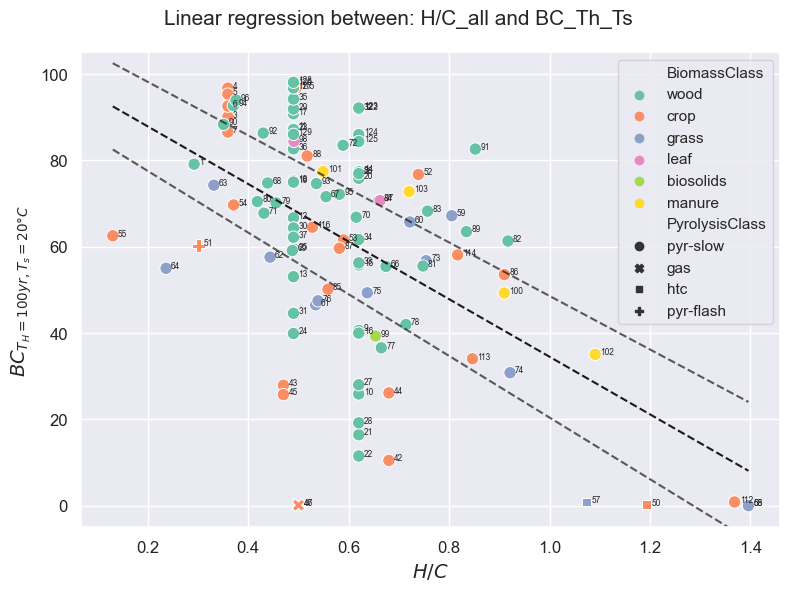

In [11]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=100, plot=True, an=True, 
                                figsize=(8,6))
ax[0].set_xlabel(r"$ H/C $")
ax[0].set_ylabel(r"$ BC_{T_H=100yr, T_s=20°C} $")
plt.show()
fig.savefig("../simulations/reproducing_woolf_HC_TH100_TS20.png", dpi=600)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -66.62 x H/C_all + 105.93 | R2 = 0.32


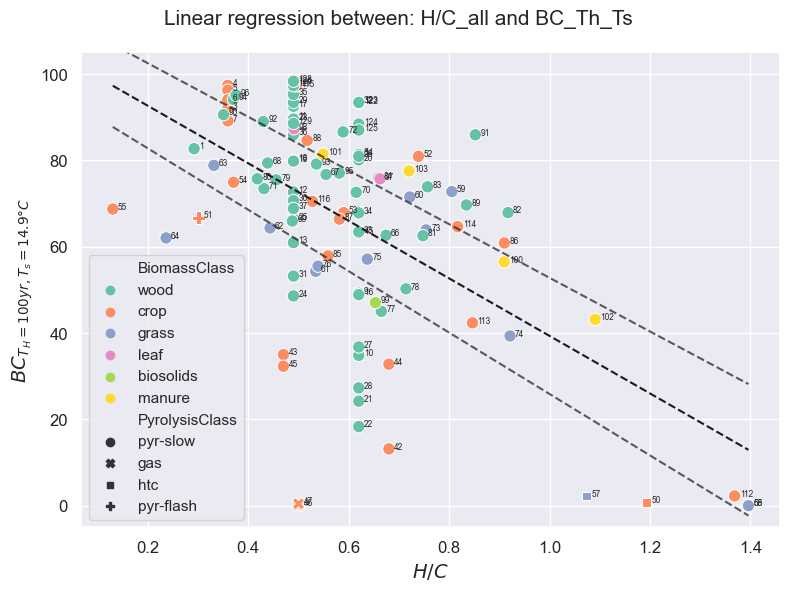

In [17]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=14.9, Th=100, plot=True, an=True,
                                figsize=(8,6))
ax[0].set_xlabel(r"$ H/C $")
ax[0].set_ylabel(r"$ BC_{T_H=100yr, T_s=14.9°C} $")
plt.show()
fig.savefig("../simulations/reproducing_woolf_HC_TH100_TS15.png", dpi=600)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -58.65 x H/C_all + 116.05 | R2 = 0.34


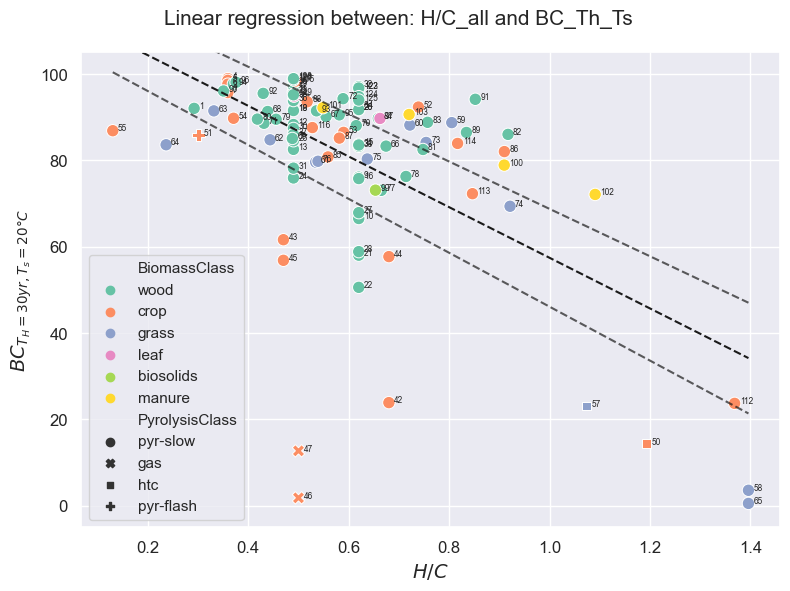

In [18]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=30, plot=True, an=True,
                                figsize=(8,6))
ax[0].set_xlabel(r"$ H/C $")
ax[0].set_ylabel(r"$ BC_{T_H=30yr, T_s=20°C} $")
plt.show()
fig.savefig("../simulations/reproducing_woolf_HC_TH30_TS20.png", dpi=600)

C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)


The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -52.04 x H/C_all + 116.28 | R2 = 0.33


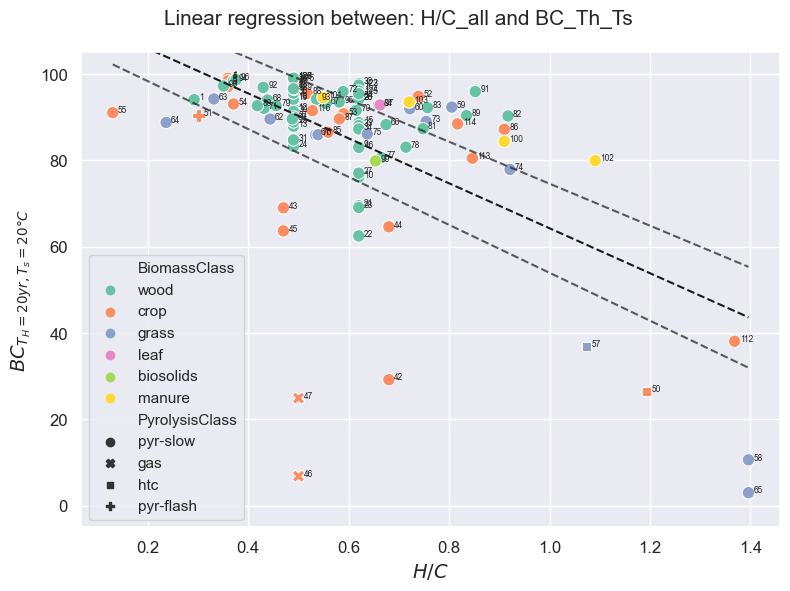

In [19]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=20, plot=True, an=True,
                                figsize=(8,6))
ax[0].set_xlabel(r"$ H/C $")
ax[0].set_ylabel(r"$ BC_{T_H=20yr, T_s=20°C} $")
plt.show()
fig.savefig("../simulations/reproducing_woolf_HC_TH20_TS20.png", dpi=600)

C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)


The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -38.35 x H/C_all + 113.36 | R2 = 0.30


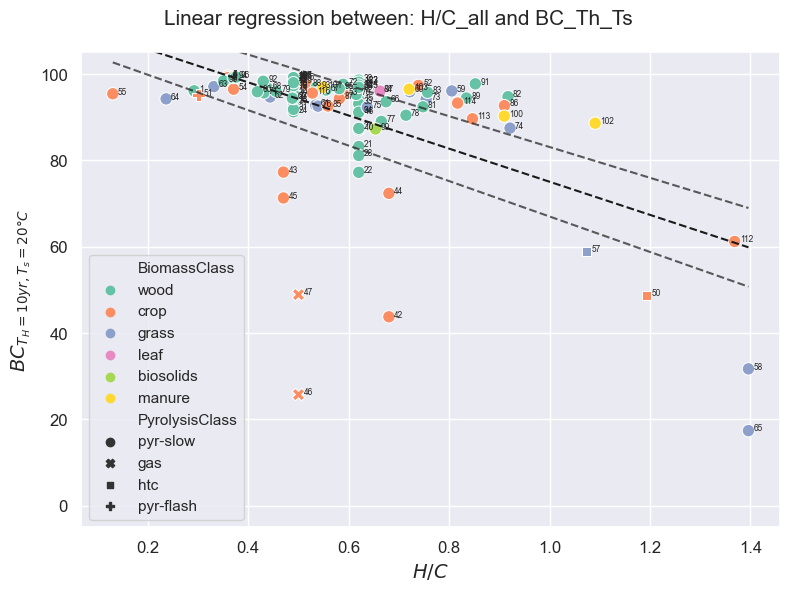

In [20]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=10, plot=True, an=True,
                                figsize=(8,6))
ax[0].set_xlabel(r"$ H/C $")
ax[0].set_ylabel(r"$ BC_{T_H=10yr, T_s=20°C} $")
plt.show()
fig.savefig("../simulations/reproducing_woolf_HC_TH10_TS20.png", dpi=600)

C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)


The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -52.04 x H/C_all + 116.28 | R2 = 0.33


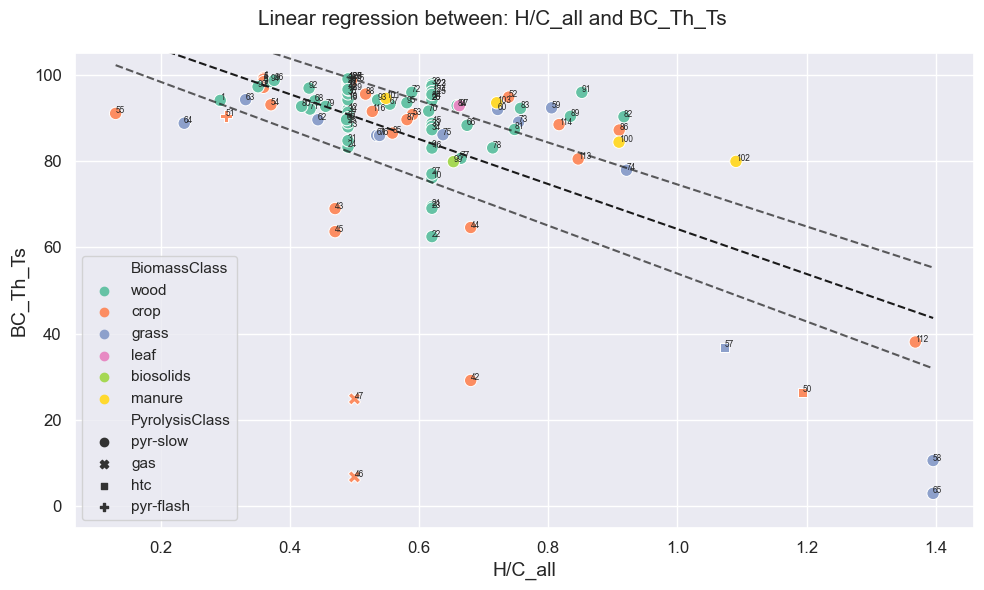

In [18]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=20, plot=True, an=True)

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]


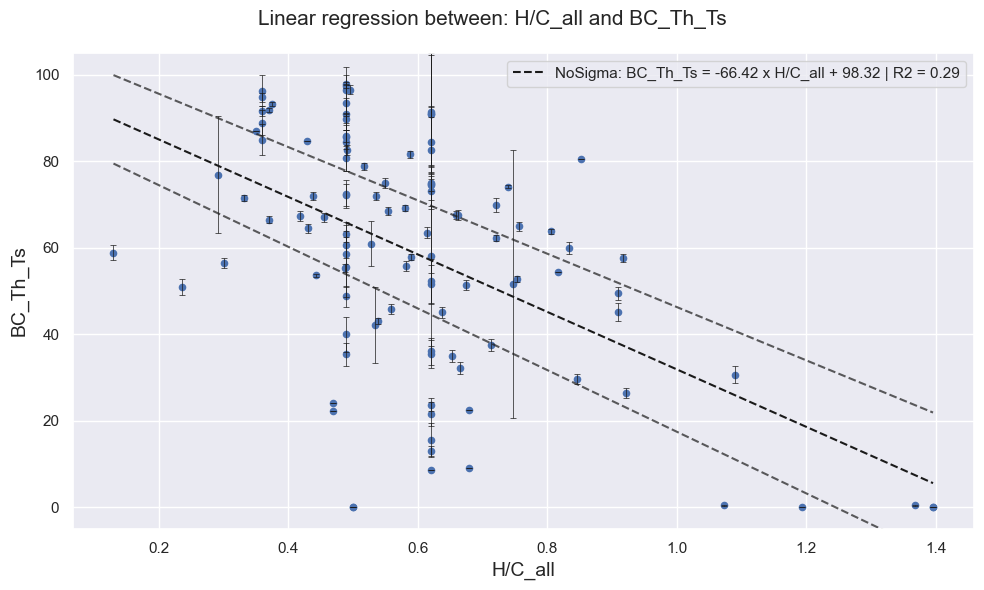

In [745]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=25, Th=100, plot=True)

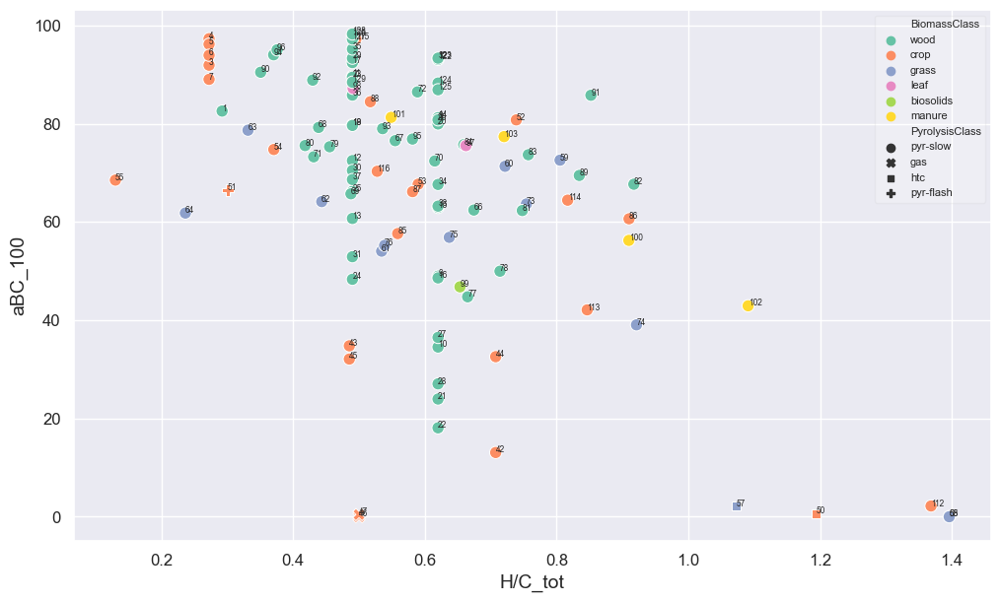

In [827]:
%matplotlib inline
make_corr_scatter(df_wSf, y='aBC_100', x='H/C_tot', an=list(df_wSf.index), saveFig=True, figsize=(12,7))

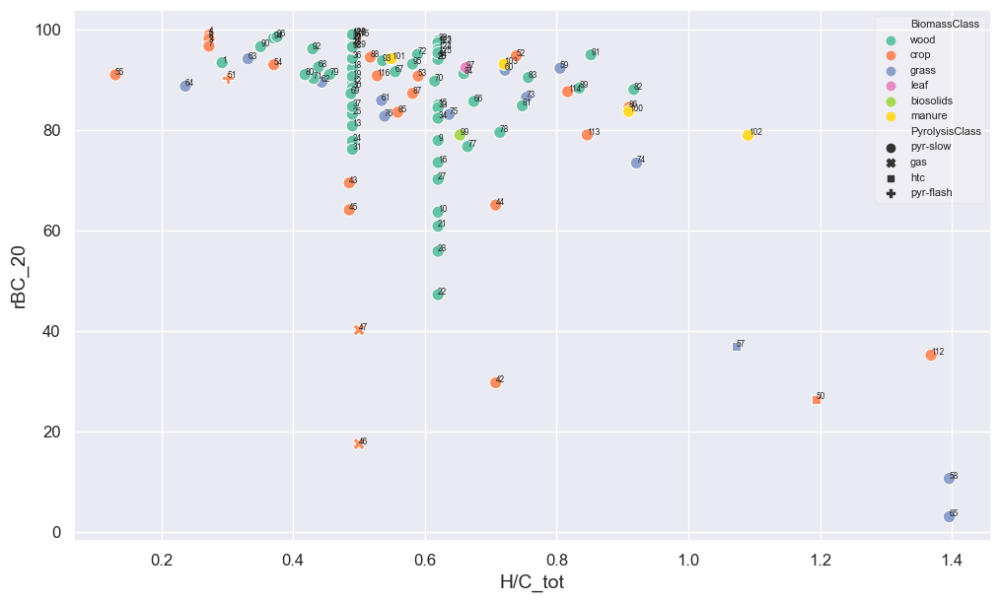

In [289]:
make_corr_scatter(df_wSf, y='rBC_20', x='H/C_tot', an=list(df_wSf.index), saveFig=False, figsize=(12,7))

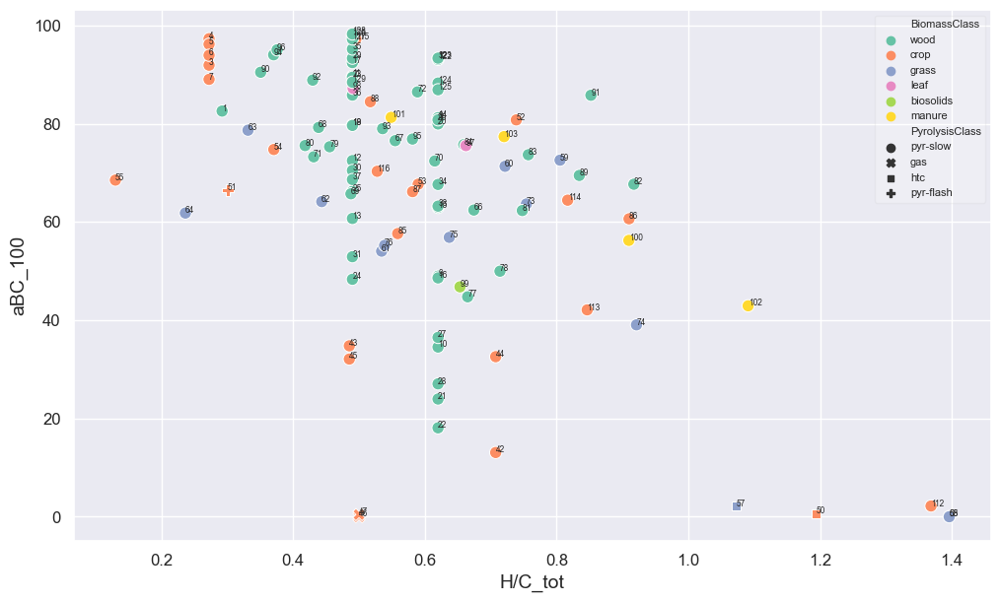

In [290]:
make_corr_scatter(df_wSf, y='aBC_100', x='H/C_tot', an=list(df_wSf.index), saveFig=True, figsize=(12,7))

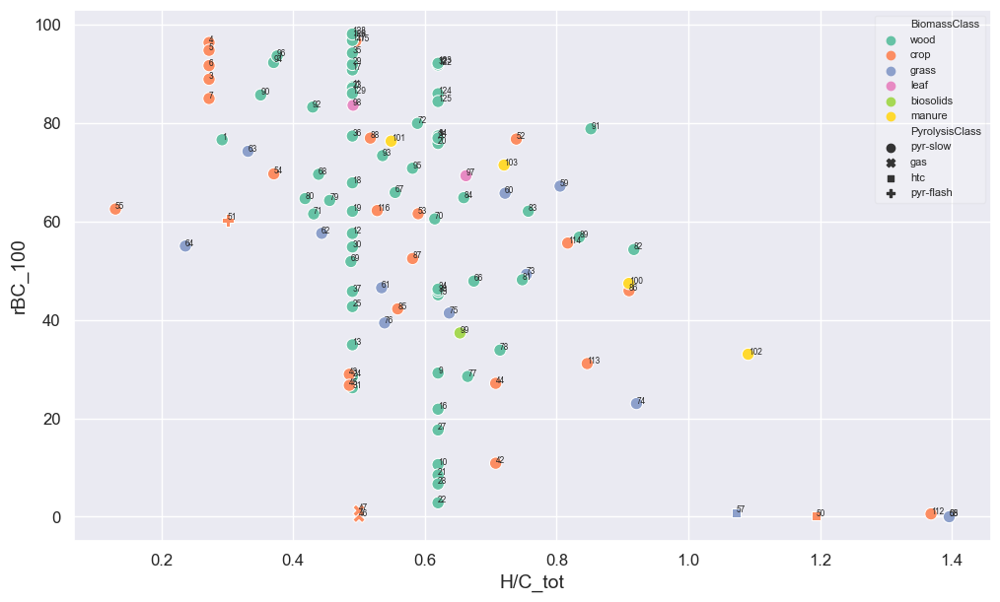

In [291]:
make_corr_scatter(df_wSf, y='rBC_100', x='H/C_tot', an=list(df_wSf.index), saveFig=True, figsize=(12,7))

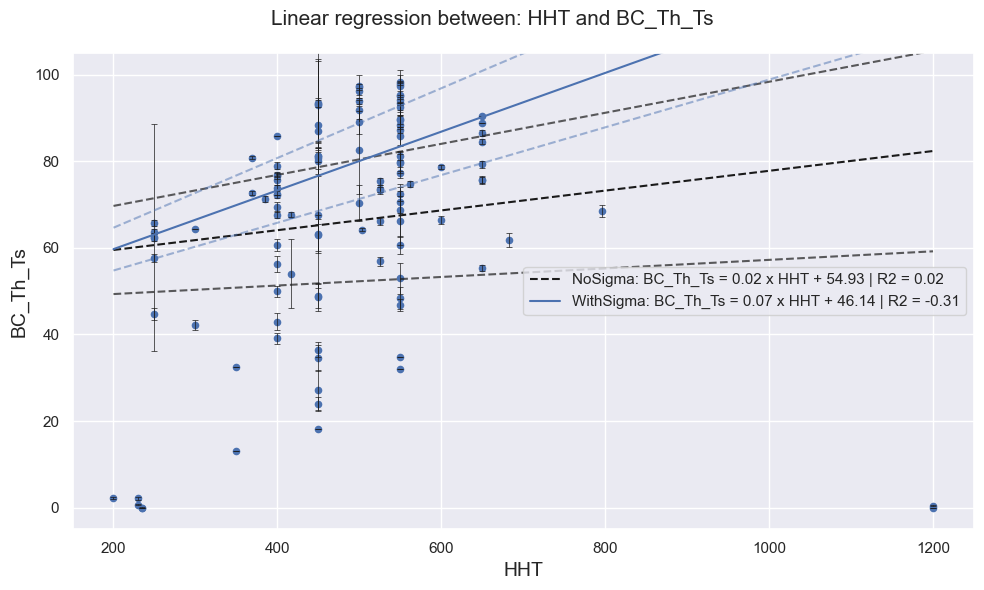

In [48]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='HHT', y='BC_Th_Ts', Ts=15, Th=100, plot=True)

The parameter x=`Soil clay content` contains 1 NaN values, from observations: [41]
Specified outliers (4) were removed from regression: [46, 47, 168, 48]


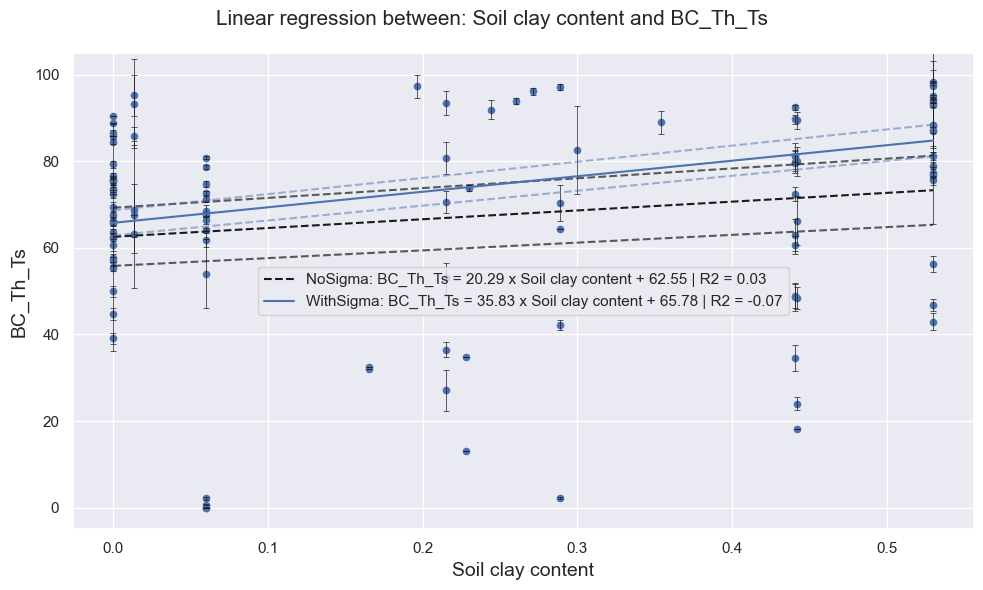

In [49]:
%matplotlib inline
fig, ax = bs.correlation_linear(fitdata, metadata, x='Soil clay content', y='BC_Th_Ts', Ts=15, Th=100, plot=True, 
                                    outliers=[46, 47, 168, 48])

#### Interactive figures

The parameter x=`H/C_all` contains 2 NaN values, from observations: [40, 41]
Linear regression: BC_Th_Ts = -66.68 x H/C_all + 101.16 | R2 = 0.30


interactive(children=(IntSlider(value=100, description='TimeHorizon', max=1000, step=10), FloatSlider(value=20…

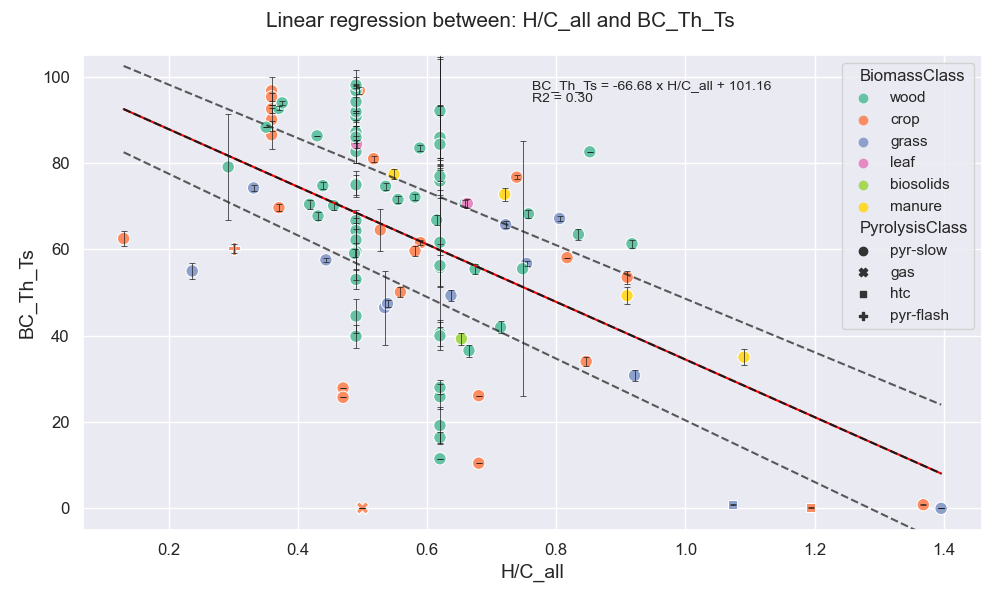

In [9]:
%matplotlib widget

TH_slider = widgets.IntSlider(
    value=100, 
    min=0, max=1000, step=10,
    description='TimeHorizon',
    continuous_update=True
)

TS_slider = widgets.FloatSlider(
    value=20, 
    min=0, max=30, step=0.5,
    description='SoilTemperature',
    continuous_update=True
)

fig, ax = bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=20, Th=100, plot=True)

def update(changeTH, changeTS):
    #print("change", change, type(change))
    bs.correlation_linear(fitdata, metadata, x='H/C_all', y='BC_Th_Ts', Ts=changeTS, Th=changeTH, plot=False, interactive=True, ax=ax, ifig=fig,
                                        iobs=73)
    fig.canvas.draw()

ie = widgets.interact(update, changeTH=TH_slider, changeTS=TS_slider)

#### Comment: plotting uncertainty on correlations

- plotting sigma of BC_TH_TS: done, adapting the uncertainty calculation through the TS recalcuation 
    - ==> some data points have an increasing sigma with time horizon? to check which ones


- from the linear corerlation itself (available in scipy, rather than sklearn, or to recalculate)
    - ==> Done: we can have the +/- 95% confidence interval, using scipy, on a linear regression curve


- combining uncertainty on BC100 estimate (in scipy) and on the linear correlation https://faculty1.coloradocollege.edu/~sburns/LinearFitting/SimpleDataFittingWithError.html 
https://faculty1.coloradocollege.edu/~sburns/toolbox/DataFitting.html
    - ==> Implemented but does not work as expected: sigma (standard deviation) does not fit at all; 1/sigma weighing provides another fit, but it is not good either
    - ==> TO DO: better understand what scipy does by reading the source code
    - ==> Hypothesis: well, the cloud of dots is not really a line.. it won't fit properly, even worse when adding relaxing with sigma
    
    
- checking the bootstrap method used by Woolf/IPCC https://datalesdatales.medium.com/the-bootstrap-or-why-you-should-care-about-uncertainty-c3fe1a5f36b5 

### Generating timeseries

In [18]:
np.seterr(divide='ignore', invalid='ignore') # ignore message "divide by 0", occuring in stdev

#Warning - at high time & temperature resolution, the cell takes 2-3 minutes to run
TS = np.arange(5, 30, 5) #[10, 15, 20]
TH = np.arange(0, 1010, 10) #[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 120, 140, 160, 180, 200]

In [ ]:
vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs = bs.calc_correlation_timeseries(fitdata, metadata,
                                                        x = ['H/C_all'], outliers=None, Ts= TS, Th= TH)

with open('../simulations/correlation_HC_highres_2022-11-16.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump([vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs], file)

In [15]:
with open('../simulations/correlation_HC_highres_2022-11-03.pkl', 'rb') as file:  
    # Call load method to deserialze
    vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs = pickle.load(file)

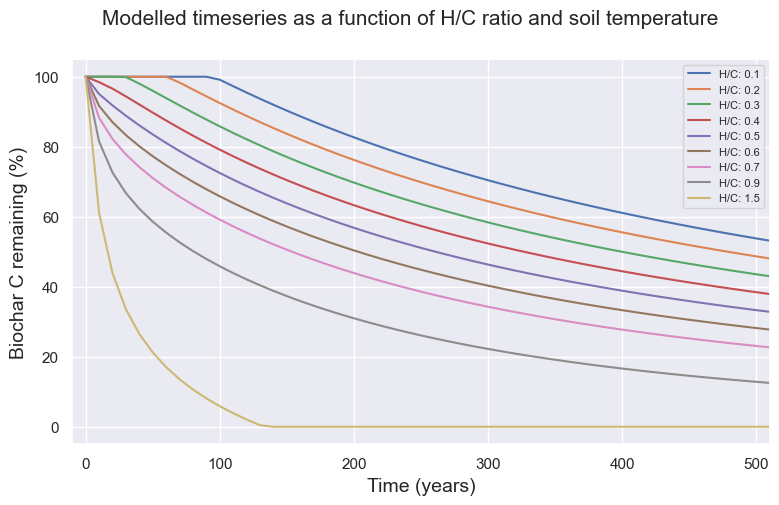

In [19]:
%matplotlib inline
fig, ax = bs.plot_correlation_timeseries(fitdata, metadata, 
                            [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1.5], 
                            [15], 
                            TH,
                            vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs,
                            fig=None, ax=None, TH_lim=500,
                               )

interactive(children=(FloatSlider(value=15.0, description='SoilTemperature', max=25.0, min=5.0, step=5.0), Out…

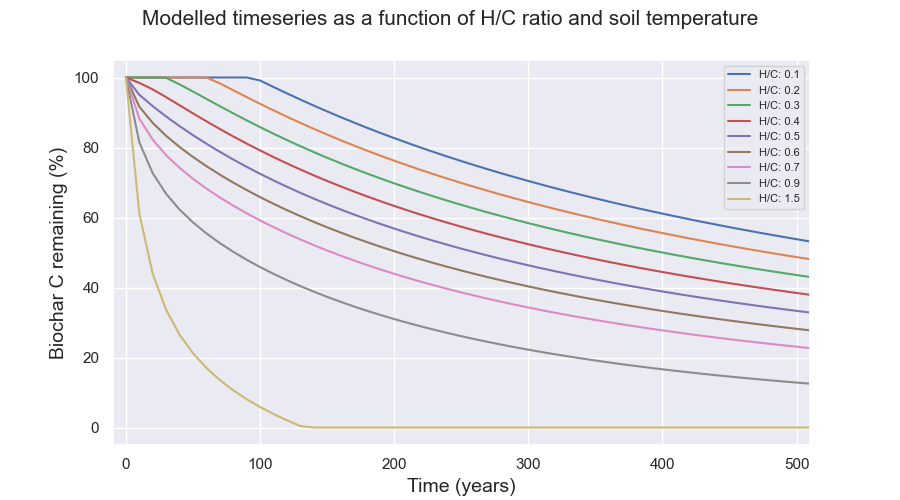

In [20]:
%matplotlib widget
TS_slider = widgets.FloatSlider(value=15, min=5, max=25, step=5, description='SoilTemperature', continuous_update=True)
figgy, ax = bs.plot_correlation_timeseries(fitdata, metadata, 
                            [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1.5], 
                            [15], 
                            TH,
                            vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs,
                            fig=None, ax=None, TH_lim=500)
def update(changeTS):
    #print("change", change, type(change))
    _, _ = bs.plot_correlation_timeseries(fitdata, metadata, 
                            [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1.5], 
                            [changeTS], 
                            TH,
                            vX, vXnan, megaY, megaYnan, megaCoeffs, megaSCoeffs,
                            fig=figgy, ax=ax, TH_lim=500)    
    figgy.canvas.draw()
ie = widgets.interact(update, changeTS=TS_slider)

## New correlation models

Mainly using Scikit-Learn. 

Note to team: in course project, I had to write own functions for data preparation; here, instead, I'll use existing functions provided by Scikit-Learn.

Pre-processing: https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing 

In [166]:
# used
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline

from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, explained_variance_score

# for later
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, train_test_split

In [167]:
# the data should be: for set of observations in the model:
# the corresponding subset of metadata and at least one target variable (BC100)
mod_bestfit = pd.read_excel('../simulations/bestfitdata-p0_2022-10-27.xlsx', index_col=0)
mod_obs =  list(mod_bestfit['ID_obs'].unique())
mod_bestfit = mod_bestfit.set_index('ID_obs')
mod_metadata = metadata[metadata.index.isin(mod_obs)] # filter metadata for the observations in the model
mod_metadata = mod_metadata.replace('na',np.NaN) # replaces 'na' strings by NaN, for correct handling 
mod_bestfit.sort_index(inplace=True)
mod_metadata.sort_index(inplace=True)

if not mod_bestfit.index.equals(mod_metadata.index):
    # True if “other” is an Index and it has the same elements and order as the calling index; False otherwise.
    raise Exception("Warning: the indexes of fitdata & sub_metadata do not have same elments or same order")

len(mod_metadata), len(mod_bestfit)

(110, 110)

### Correlation matrices

Correlation calculation and interpertation will not be the same:
- between numerical variables
- between categorical variables (https://www.statology.org/correlation-between-categorical-variables/)
- between a numerical and a categorical variable (https://en.wikipedia.org/wiki/Kruskal%E2%80%93Wallis_one-way_analysis_of_variance and ANOVA)

For now, we limit ourselves to correlation between numerical variables. The categorical variables are plotted on top of the scatter plots (biomass class as marker type, pyrolysis type as marker color, with annotation of the article).

In addition, let's note that:
- correlation as determined by Pearson method corresponds to a linear correlation, the coefficient correspond to the slope of the best line fitting the two variables, and therefore vary between -1 and +1.
- Pearson correlation is not well suited to identify non-linear correlations
- other methods for non-linear correlation include e.g. the distance correlation (by SZÉKELY, 2007); or the Maximal Information Coefficient (MIC, 2011, https://doi.org/10.1126%2Fscience.1205438), see examples https://www.freecodecamp.org/news/how-machines-make-predictions-finding-correlations-in-complex-data-dfd9f0d87889/ 
- Distance correlation (and MIC) are also suited for identifying linear correlations

Below, we implement:
- Pearson correlation (alt. also easily available via df.corr: pearson : standard correlation coefficient; kendall : Kendall Tau correlation coefficient; spearman : Spearman rank correlation)
- Distance correlation (via scipy and dcor package)



In [168]:
fitdata2, df, obs = _align_dataframes(fitdata, metadata, None)

# numerical variables, including boolean, int, 
info_cols = ['ID_art', 'NameObs', 'Replicates','Biomass', 'Pyrolysis', 'BiomassLignin', 'Soil type',
             'SoilMoisture_Absolute', 'SoilOrigin', 'SoilGeolocation', 'TotalFluxMeasurement', 'BiocharFluxDetermination', 'OtherIncubationDescription', 'AssociatedControl',
             'Cultivated', 'ID_Lehmann2019', 'ID_Woolf2021', 'ID_Lehmann2021',
             ]
col_to_drop = ['pH_bc-soil', 'Magnesium', 'Potassium', 'Phosphorous', 'ParticleSize', 'BulkDensity',
              'TrueDensity', 'OxidationH2O2', 'BiocharYield', 'δ ¹³C biochar',
              'δ ¹³C soil', 'FixedCarbon', 'VolatileMatter', 'pH_CaCl2', 'CEC', 'SA_N2', 'SA_CO2', 'Sulphur', 'ApplicationRate',]

col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

col_numerical = ['HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content', 'Soil silt content', 'Soil organic matter content',
                'SoilMoisture_WHC', 'pH_soil', 'IncubationTemperature', 'IncubationDuration', 
                'Ash550', 'Ash700', 'Carbon', 'Carbon, organic', 'Hydrogen', 'Nitrogen',
                'Oxygen', 'H/C_org', 'H/C_tot', 'O/C_org', 'C/N', 'pH_H2O',
                ]

df.drop(info_cols, axis=1, inplace=True)


In [169]:
# engineered variables - C, H, O on dry ash free basis
# to attempt fix the high manure ones!
def dry2daf(df, x, ash='Ash'):
    '''
    Convert quantity x expressed in dry-basis to a dry-ash-free basis, with ash content specified.
    New columns: named as `x_daf`
    How are NaNs handled: NaNs in one colum remain NaNs 
    '''
    dff = df.copy()
    dff.replace('na', np.NaN, inplace=True)
    if ash == 'Ash':
        # the mean of both ash content is taken, if any gaps 
        dff['Ash'] = dff[['Ash550', 'Ash700']].mean(axis=1)
    else:
        dff['Ash'] = dff[ash]
    
    dff[x+'_daf'] = dff[x]/(1-dff['Ash'])
    return dff

In [6]:
dafs = ['Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen']
for d in dafs:
    df = dry2daf(df, x=d, ash='Ash')

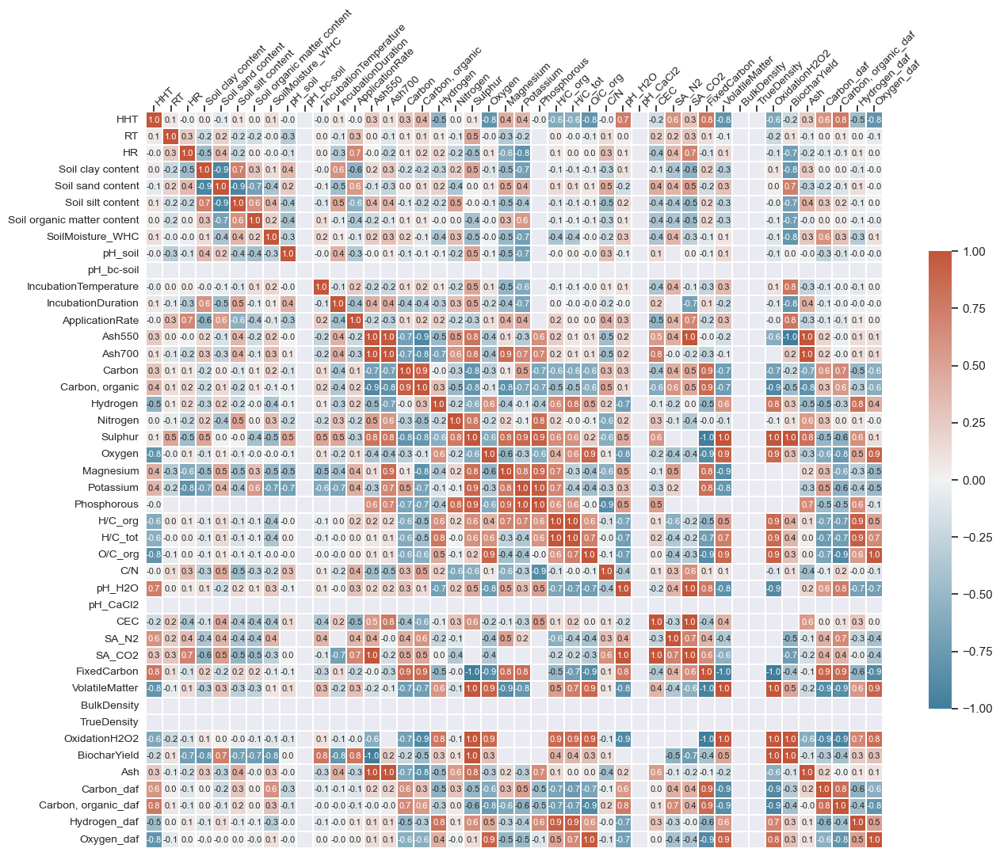

In [46]:
%matplotlib inline

# Correlation
corr = df.corr(method='pearson', numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=bool)).T
meta_numeric = corr.columns

f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

#corr[['BC_50', 'BC_100', 'BC_150', 'BC_200']]
sns.heatmap(corr, cmap=cmap, center=0, #mask=mask
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": .5},
            annot=True, annot_kws={"size": 8}, fmt='.1f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);
#plt.savefig('../simulations/correlation-pearson-all-numerics.png', dpi=300, bbox_inches='tight')



In [8]:
from scipy.optimize import fsolve
from biocharStability.analyse import _align_dataframes, _calculateY, apply_Q10_bis, singleExp, singleExp_u, doubleExp, doubleExp_u, tripleExp, tripleExp_u, powerModel, rebuild_cov2

def _calculate_stability_features(fitdata, metadata, Ts=15, THs=[1, 2, 3, 5, 10, 20, 50, 75, 100, 150, 200]):
    '''
    Caculates a set of features relating to stability estimates, whether amounts of carbon remaining at given time, half-lives, mean resisdence times, or average decay rates, dervied from curve fitting
    Returns a copy of the metadata with additional columns for the new entries.
    '''
    # some constants 
    map_model_function = {"singleExp":singleExp,"singleExp_u":singleExp_u,"doubleExp":doubleExp,"doubleExp_u":doubleExp_u,"tripleExp":tripleExp,"tripleExp_u":tripleExp_u,"powerModel":powerModel,}            
    #THs = [1, 2, 3, 5, 10, 20, 50, 75, 100, 150, 200]
    #THs = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
    stability_features = {}
    #THs = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
    for ts in THs:
        stability_features['rBC_'+str(ts)] = []
        stability_features['aBC_'+str(ts)] = []
        stability_features['rK_y'+str(ts)] = []
        stability_features['aK_y'+str(ts)] = []
    stability_features['rT12'] = []
    stability_features['rMRT'] = []
    stability_features['rK02_K100'] = []
    stability_features['aK02_K100'] = []
    for obs, row in fitdata.iterrows():
        # retrive metadata and fitdata
        Ts_ini = metadata.loc[obs, 'IncubationTemperature']
        FIT_func = row['model']
        params = row[['k', 'c', 'k1', 'k2', 'c1', 'c2', 'k3', 'c0', 'b', 'm', 'c3']]
        # std is in absolute value (other named .1 => relative value, in %)
        params_std = row[['std_k', 'std_c','std_k1', 'std_k2', 'std_c1', 'std_c2', 'std_k3', 'std_c3', 'std_c0', 'std_b', 'std_m']]
        params_corr = ['corr(k, c)', 'corr(k1, k2)', 'corr(k1, c1)', 'corr(k2, c1)', 'corr(k1, c2)', 'corr(k2, c2)', 'corr(c1, c2)', 'corr(k1, k3)',
                        'corr(k2, k3)', 'corr(k3, c1)', 'corr(k3, c2)', 'corr(k1, c3)', 'corr(k2, c3)', 'corr(k3, c3)', 'corr(c1, c3)', 'corr(c2, c3)','corr(c0, b)', 'corr(c0, m)', 'corr(b, m)']
        params_cov = row[['cov(k, c)', 'cov(k1, k2)', 'cov(k1, c1)', 'cov(k2, c1)', 'cov(k1, c2)', 'cov(k2, c2)',
                       'cov(c1, c2)', 'cov(k1, k3)', 'cov(k2, k3)', 'cov(k3, c1)','cov(k3, c2)', 'cov(k1, c3)', 'cov(k2, c3)', 'cov(k3, c3)','cov(c1, c3)', 'cov(c2, c3)', 'cov(c0, b)', 'cov(c0, m)', 'cov(b, m)']]
        p_opt_names, p_opt, p_cov = rebuild_cov2(map_model_function[FIT_func], params, params_std, params_cov) 
    
        # calculate MRT and T12
        def f12(t):
            return map_model_function[FIT_func](t, *p_opt) - 50.
        t12 = fsolve(f12, x0=50*365) # half-life time, 50% C remaining
        t12 = t12[0]/365

        def fMRT(t):
            return map_model_function[FIT_func](t, *p_opt) - np.exp(-1)
        MRT_app = fsolve(fMRT, x0=50*365) # apparent MRT, np.exp(-1) = 36.8% C remaining
        MRT_app = MRT_app[0]/365

        # perform calculations, of BC and K
        r_timeseries = []
        a_timeseries = []
        r_K_timeseries = [0] # init with 0 for decay at time 0
        a_K_timeseries = [0] # init with 0 for decay at time 0
        for t in np.arange(0, THs[-1]+1, 1): # steps of 1 year in timeseries
            # temperature-adjusted timeseries
            BC, sBC = apply_Q10_bis(t, Ts, Ts_ini, FIT_func, params, p_opt, p_cov) # Th in years, it is multiplied by 365 in the function
            a_timeseries.append(BC)
            if t > 0:
                a_K_timeseries.append(a_timeseries[t-1]-BC)
            # no temperature adjustment
            BC, sBC = apply_Q10_bis(t, Ts_ini, Ts_ini, FIT_func, params, p_opt, p_cov) # Th in years, it is multiplied by 365 in the function
            r_timeseries.append(BC)
            if t > 0:
                r_K_timeseries.append(r_timeseries[t-1]-BC)
            
        for i in THs:
            # BC Remaining at given year
            stability_features['aBC_'+str(i)].append(a_timeseries[i]) # in % of initial carbon
            stability_features['rBC_'+str(i)].append(r_timeseries[i]) 
            # Annual average decay rates
            stability_features['aK_y'+str(i)].append(a_K_timeseries[i]) # in %ini per year
            stability_features['rK_y'+str(i)].append(r_K_timeseries[i])
    
        # Ratio between average decay rate in 1st two years divided by decay rate in year 100, as modelled by curve fit
        stability_features['aK02_K100'].append((a_timeseries[0]-a_timeseries[2])/2/a_K_timeseries[100] )
        stability_features['rK02_K100'].append((r_timeseries[0]-r_timeseries[2])/2/r_K_timeseries[100])
            
        # Half-life and MRT, in years
        stability_features['rT12'].append(t12)
        stability_features['rMRT'].append(MRT_app)
    return stability_features, r_timeseries, a_timeseries, a_K_timeseries, r_K_timeseries        

In [20]:
stability_features, r_timeseries, a_timeseries, a_K_timeseries, r_K_timeseries = _calculate_stability_features(
    fitdata2, df, 20, THs=[1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500])

C:\github\biocharStability\biocharStability\analyse.py:938: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:970: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:77: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
C:\github\biocharStability\biocharStability\analyse.py:970: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:77: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t) + (100-c1-c2)*np.exp(-k3*t)
C:\github\biocharStability\biocharStability\analyse.py:71: RuntimeWarning: overflow encountered in exp
  return c1*np.exp(-k1*t)+ c2*np.exp(-k2*t)
C:\github\biocharStability\biocharStability\analyse.py:77: RuntimeWarning: overflow encountered in

KeyboardInterrupt: 

In [10]:
dSf = pd.DataFrame(stability_features, index=df.index)
df_wSf = df.copy(deep=True)
df_wSf = df.join(dSf)
df_wSf

,AuthorDate,BiomassClass,PyrolysisClass,HHT,RT,HR,Soil clay content,Soil sand content,Soil silt content,Soil organic matter content,...,rK_y200,aK_y200,rBC_500,aBC_500,rK_y500,aK_y500,rT12,rMRT,rK02_K100,aK02_K100
ID_obs,,,,,,,,,,,,,,,,,,,,,
1,Major2010,wood,pyr-slow,500.0,2880.0,NaN,0.300,0.555,0.145,0.030000,...,0.148687,0.138018,28.308438,33.257585,0.070501,0.072085,271.299556,2246.083810,6.015585,6.483323
3,Wu2016,crop,pyr-slow,500.0,180.0,7.5,0.244,0.358,0.398,0.033781,...,0.092402,0.084088,55.688057,59.514830,0.065087,0.061640,592.238025,4797.398014,1.775013,1.834595
4,Wu2016,crop,pyr-slow,500.0,180.0,7.5,0.196,0.321,0.483,0.025095,...,0.033552,0.029979,83.351790,85.082171,0.030107,0.027235,1915.093073,15516.520419,3.233643,3.501496
5,Wu2016,crop,pyr-slow,500.0,180.0,7.5,0.271,0.364,0.365,0.022308,...,0.047686,0.042771,76.608698,78.957150,0.040667,0.037143,1304.009108,10559.752934,2.156355,2.284241
6,Wu2016,crop,pyr-slow,500.0,180.0,7.5,0.260,0.337,0.403,0.026041,...,0.072557,0.065572,64.874821,68.139535,0.056007,0.052129,801.800160,6493.970348,1.951853,2.042733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,Fang2019,wood,pyr-slow,450.0,40.0,7.5,0.530,NaN,NaN,0.007740,...,0.111478,0.111478,45.533999,45.533999,0.070216,0.070216,439.278249,3627.122619,7.319035,7.319035
126,Fang2019,wood,pyr-slow,550.0,40.0,7.5,0.530,NaN,NaN,0.007740,...,0.016019,0.016019,91.306144,91.306144,0.015237,0.015237,4109.004862,33547.165040,23.798481,23.798481
127,Fang2019,wood,pyr-slow,550.0,40.0,7.5,0.530,NaN,NaN,0.007740,...,0.025747,0.025747,86.717078,86.717078,0.023719,0.023719,2513.354216,20474.019528,11.812465,11.812465


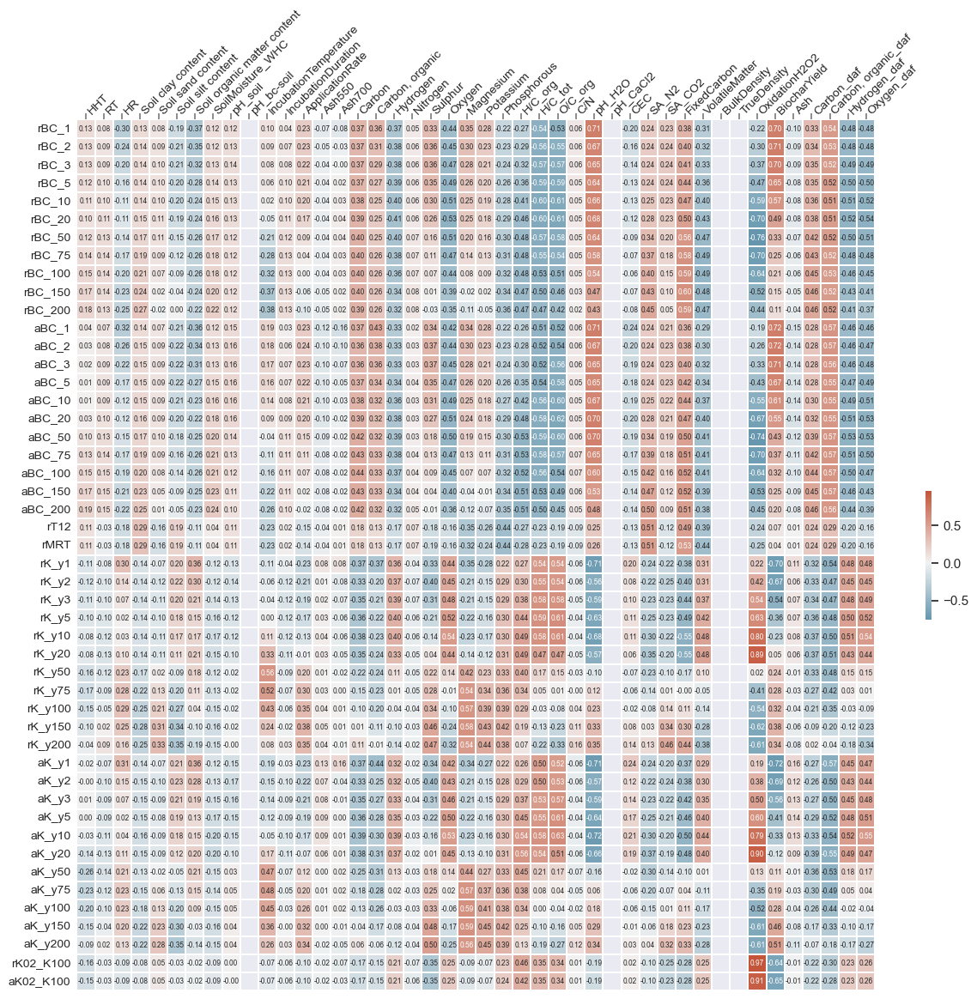

In [33]:
corr = df_wSf.corr(method='pearson', numeric_only=True)

%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# [['BC_1', 'BC_50', 'BC_100', 'BC_150', 'BC_200']].T
# corr[dSf.columns].T[meta_numeric]

sns.heatmap(corr[dSf.columns].T[meta_numeric], cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

#plt.savefig('../simulations/correlation-pearson-BCs-numeric.png', dpi=300, bbox_inches='tight')

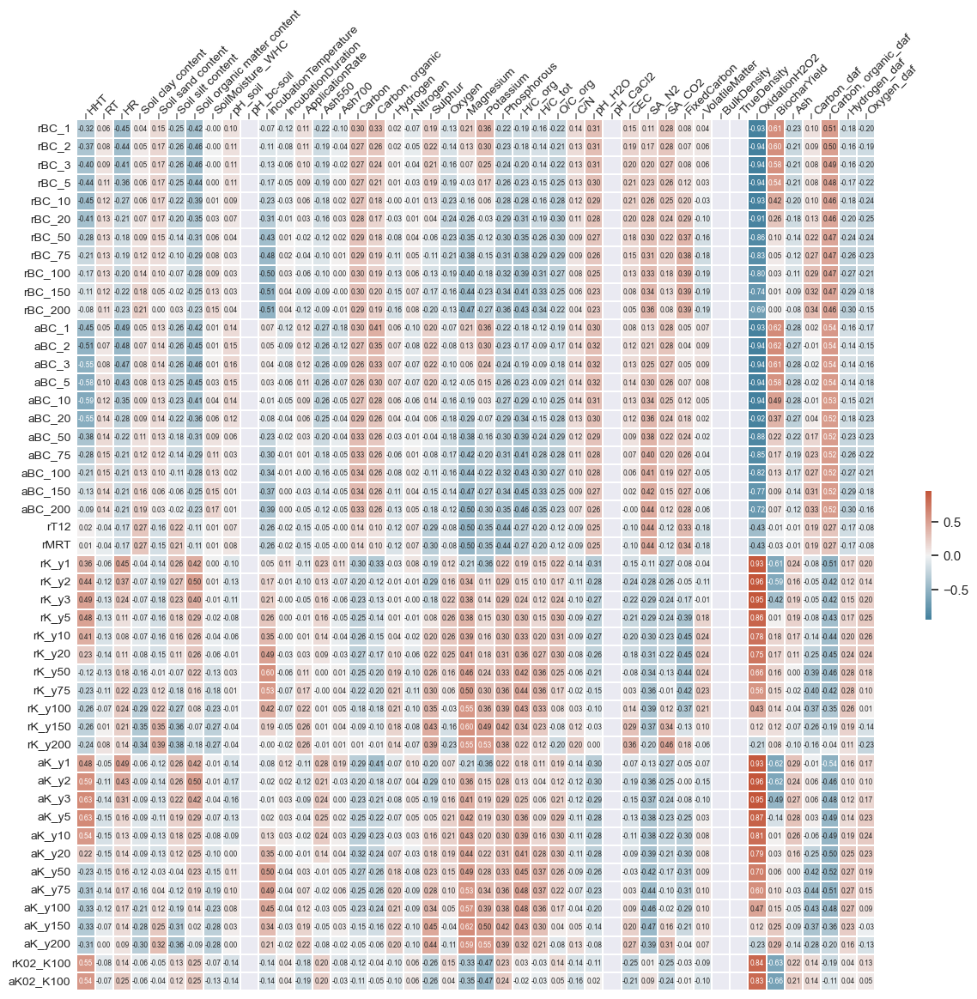

In [34]:
df_wSf_noLowT = df_wSf[df_wSf['HHT'] > 350]
corr = df_wSf_noLowT.corr(method='pearson', numeric_only=True)

%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# [['BC_1', 'BC_50', 'BC_100', 'BC_150', 'BC_200']].T
# corr[dSf.columns].T[meta_numeric]

sns.heatmap(corr[dSf.columns].T[meta_numeric], cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

#plt.savefig('../simulations/correlation-pearson-BCs-numeric.png', dpi=300, bbox_inches='tight')

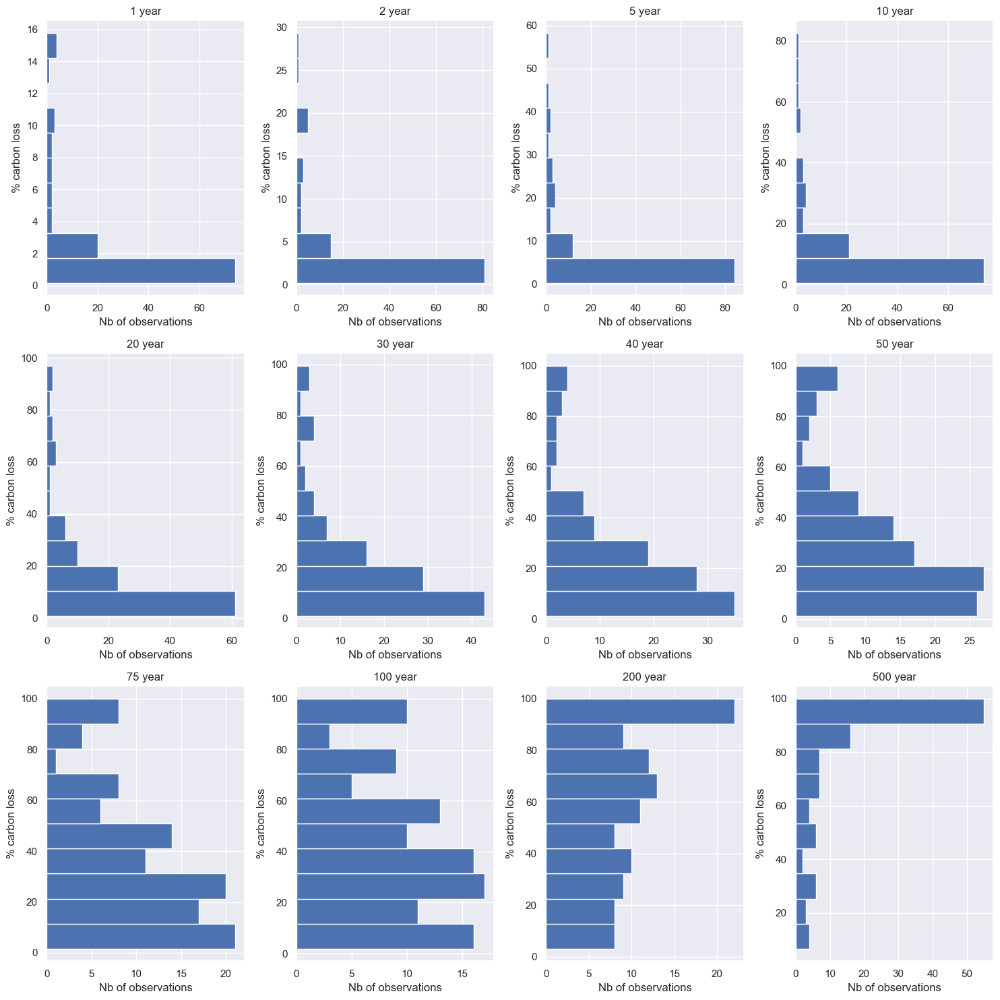

In [284]:
%matplotlib inline
f, ax = plt.subplots(nrows=3, ncols=4, figsize=(15, 15))
axl = ax.ravel()
THs = [1, 2, 5, 10, 20, 30, 40, 50, 75, 100, 200, 500]
for i, t in enumerate(THs):
    (100.-df_wSf['rBC_'+str(t)]).hist(ax=axl[i], orientation='horizontal', align='mid')
    axl[i].set_title(str(t)+' year')
    axl[i].set_xlabel("Nb of observations")
    axl[i].set_ylabel("% carbon loss")
    #axl[i].set_ylim([0,100])
f.tight_layout()

### Biochar decay rate as function of temperature

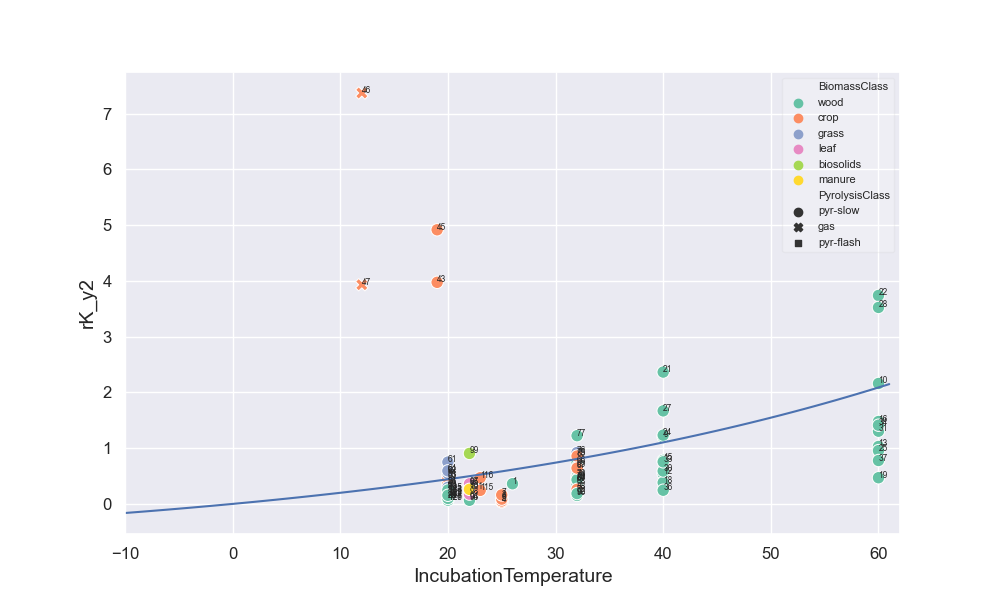

In [19]:
df_wSf_noLowT = df_wSf[df_wSf['HHT'] > 400]
df_wSf_noLowT = df_wSf[df_wSf['H/C_tot'] < 0.7]
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,6))
make_corr_scatter(df_wSf_noLowT, y='rK_y2', x='IncubationTemperature', 
                  an=list(df_wSf_noLowT.index), saveFig=False, fig=fig, ax=ax)
ax.set_xlim([-10,62])
#ax.set_ylim([-0.2,3])

xA = np.arange(-10,62,1)
yA = [0.9*np.exp(0.020*i) - 0.7 for i in xA]
#ax.plot(xA, yA)
yA = [0.9*np.exp(0.020*i) - 0.9 for i in xA]
ax.plot(xA, yA)
yA = [0.7 * np.exp(0.0251*i) - 0.6 for i in xA]
#ax.plot(xA, yA)
plt.show()

C:\github\biocharStability\biocharStability\analyse.py:834: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:866: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(std_f2)
C:\github\biocharStability\biocharStability\analyse.py:

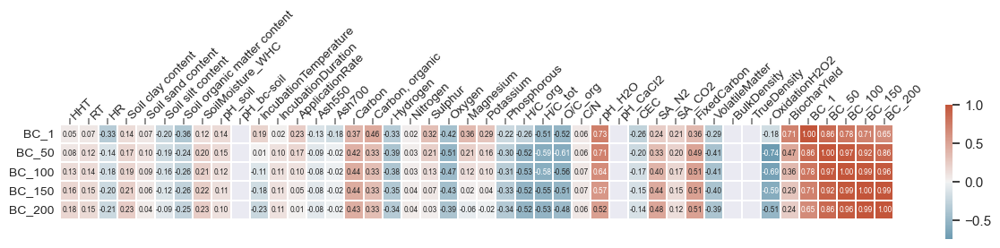

In [22]:
vY, sigvY, vYnan = _calculateY(fitdata2, df, 15, 1)
df['BC_1'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, df, 15, 50)
df['BC_50'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, df, 15, 100)
df['BC_100'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, df, 15, 150)
df['BC_150'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, df, 15, 200)
df['BC_200'] = vY

corr = df.corr(method='pearson', numeric_only=True)

%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)


sns.heatmap(corr[['BC_1', 'BC_50', 'BC_100', 'BC_150', 'BC_200']].T, cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

plt.savefig('simulations/correlation-pearson-BCs-numeric.png', dpi=300, bbox_inches='tight')
#plt.show()

In [170]:
# scatter for every BC x Numeric variable, 
# color for biomass type [c]
# marker for pyrolysis type [m]
# Field with border on marker [fi] -- pending
# AuthorDate with annotation [an]

col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

def make_corr_scatter(df, x='HHT', y='BC_100', c='BiomassClass', m = 'PyrolysisClass', 
                      an=False, fi=None, 
                      fig=None, ax=None, saveFig=False, figsize=(6,6)): 
    if ax is None:
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)

    sns.scatterplot(data=df, x=x, y=y,
                    style=m, hue=c, palette=sns.color_palette("Set2", as_cmap=False)[:len(df[c].unique())], 
                    ax = ax, s=80)
    ax.set_xlabel(x, fontsize=14)
    ax.set_ylabel(y, fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.legend(facecolor='white', framealpha=0.2, fontsize=8) 
    
    if an is not False:
        texts = an
        xss = list(df[x])
        yss = list(df[y])
        for i, txt in enumerate(texts):
            ax.annotate(txt, xy=(xss[i], yss[i]), xycoords="data", fontsize=6)
    
    if saveFig:
        x = x.replace("/", "")
        fig.savefig('simulations/scatter-'+y+'---'+x+'.png', dpi=300, bbox_inches='tight')

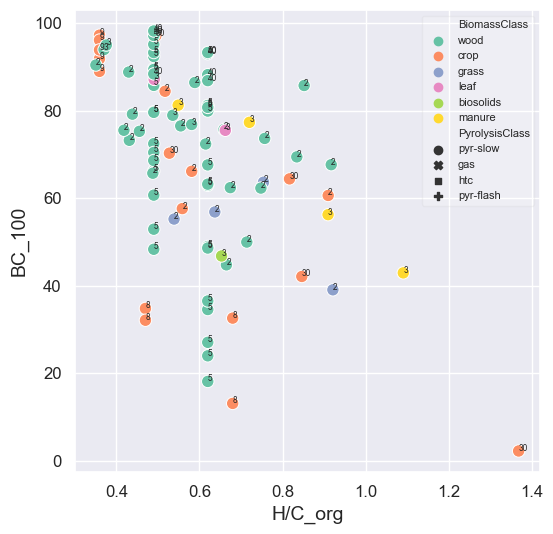

In [183]:
make_corr_scatter(df, y='BC_100', x='H/C_org', an=list(metadata.loc[df.index,'ID_art']), saveFig=True)

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_6740\3514042578.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


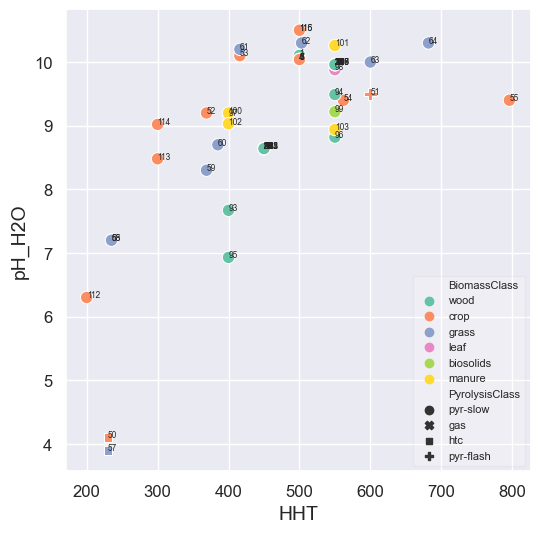

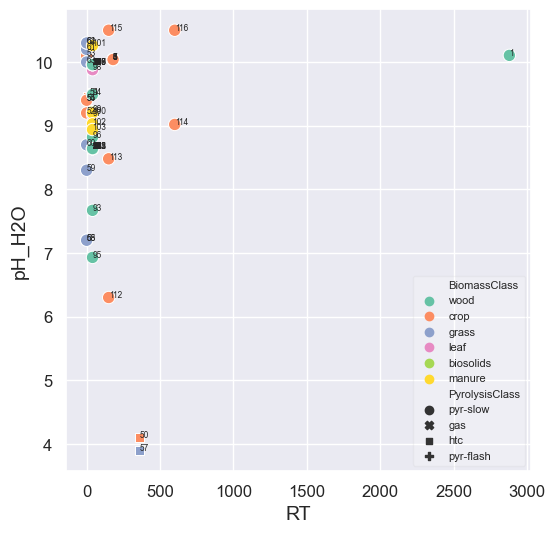

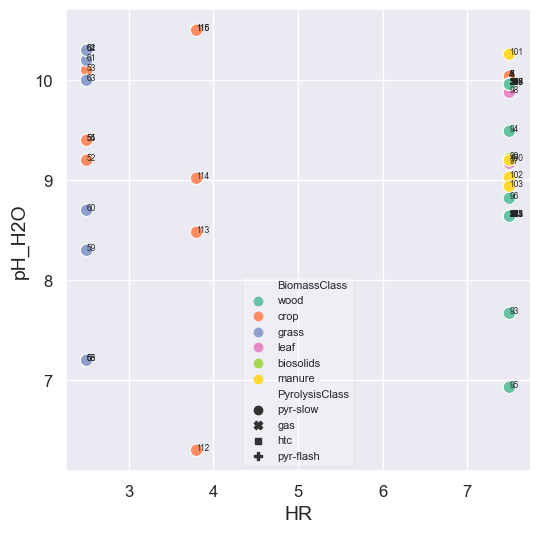

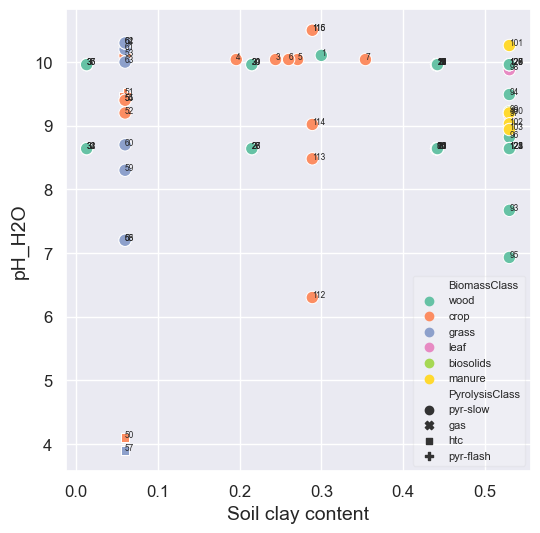

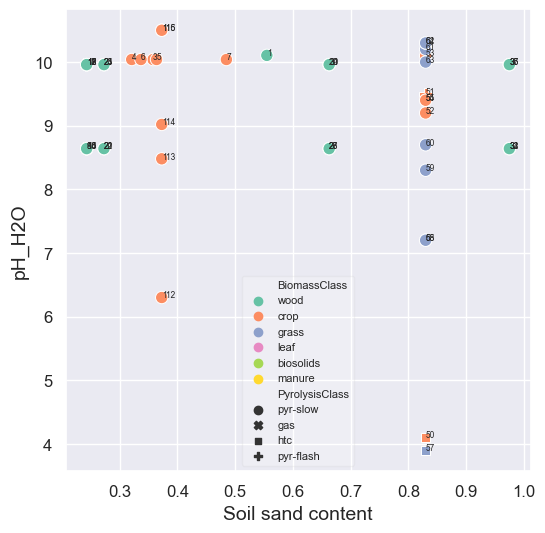

...

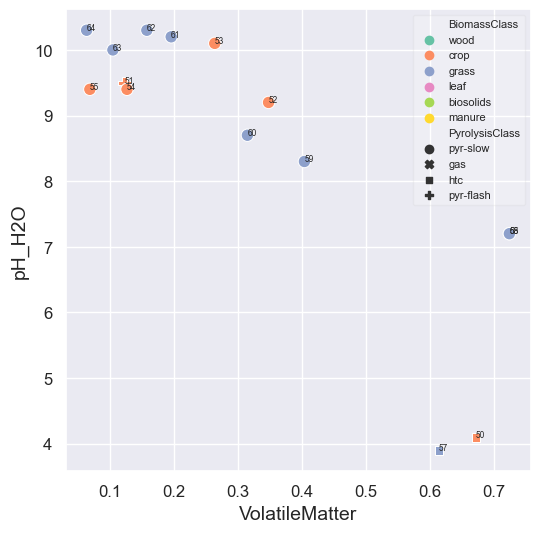

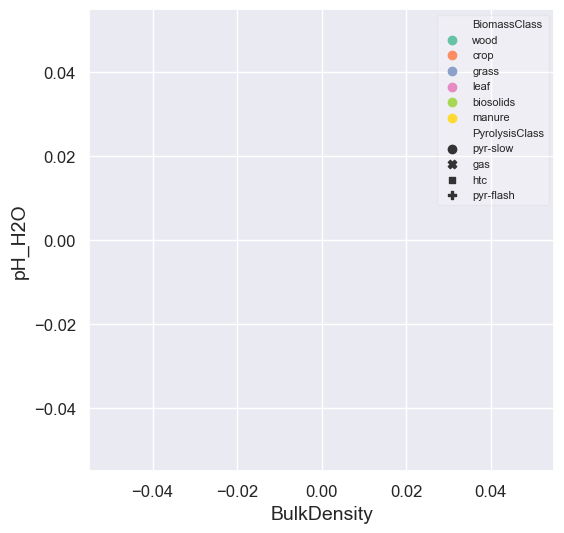

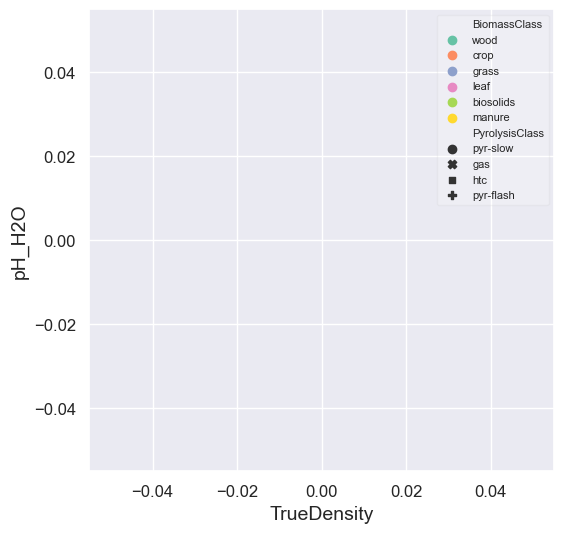

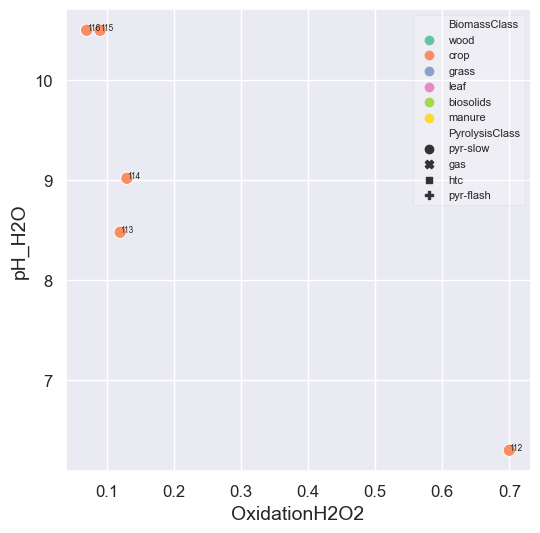

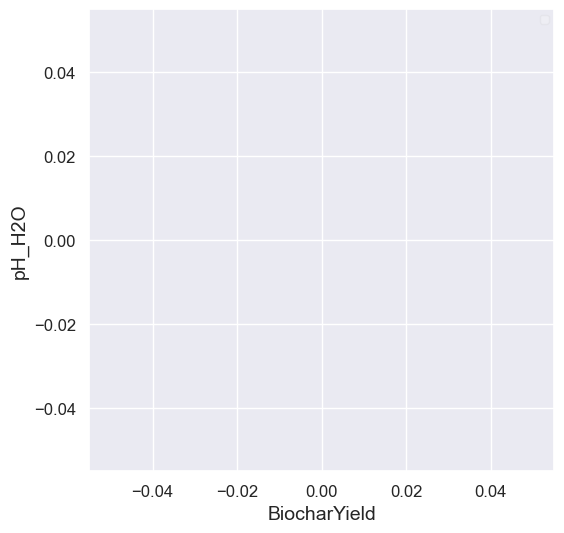

In [222]:
for x in df.select_dtypes(include=np.number).columns.tolist():
    make_corr_scatter(df, y='pH_H2O', x=x, an=list(df.index), saveFig=True)

C:\Users\Elias S. Azzi\AppData\Local\Temp\ipykernel_18688\3514042578.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=figsize)


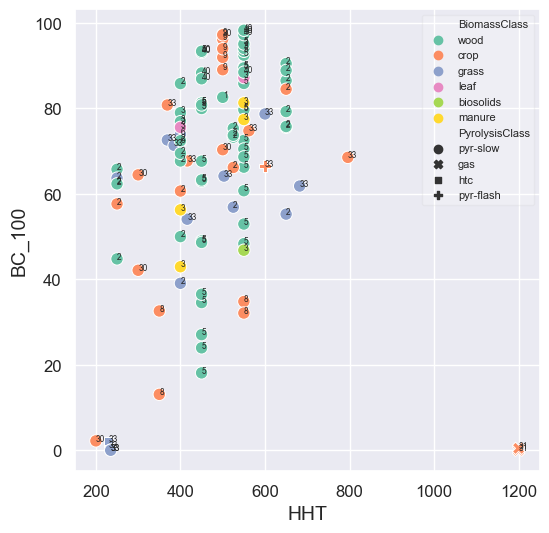

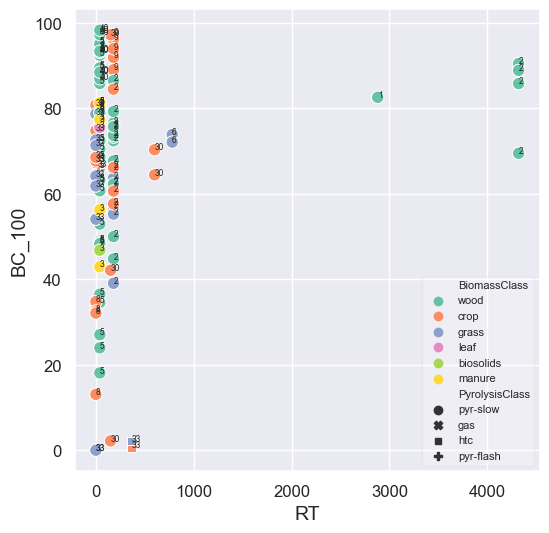

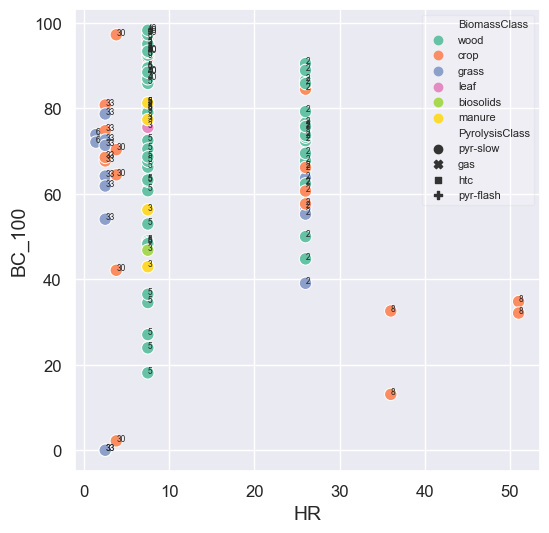

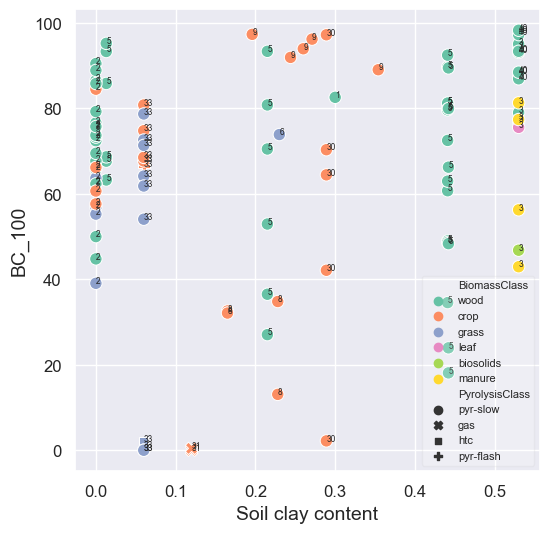

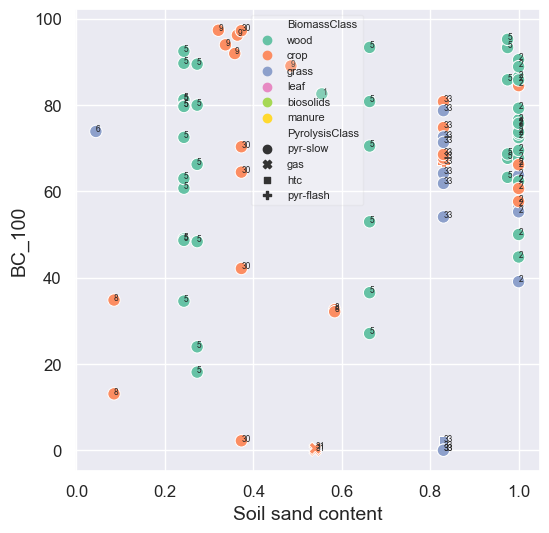

...

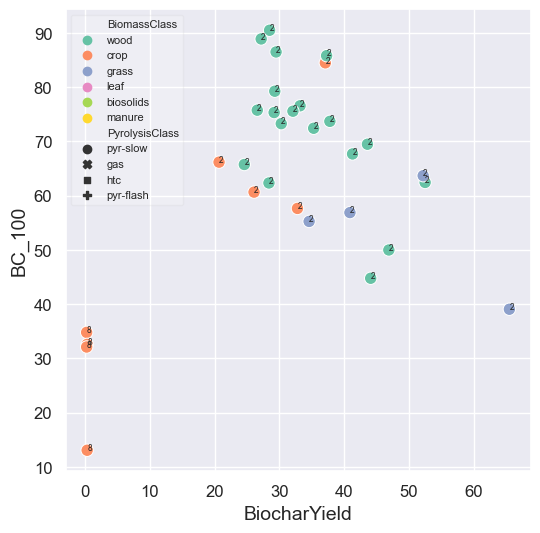

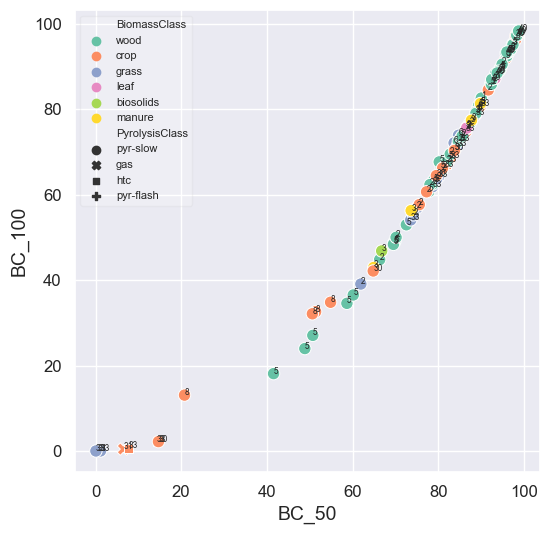

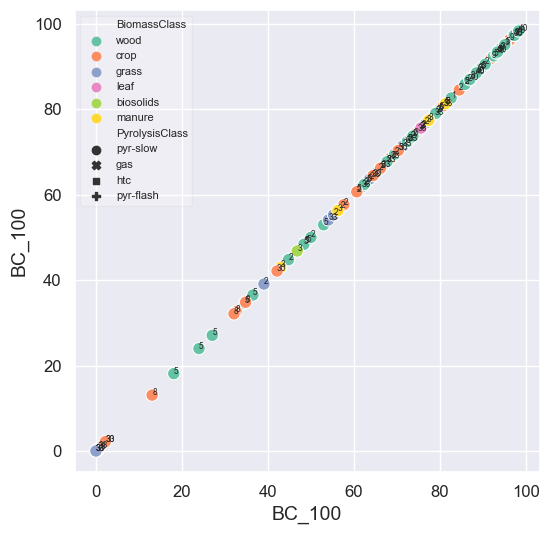

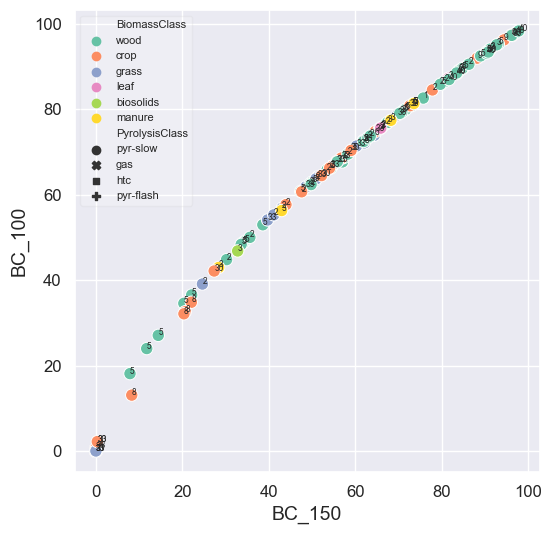

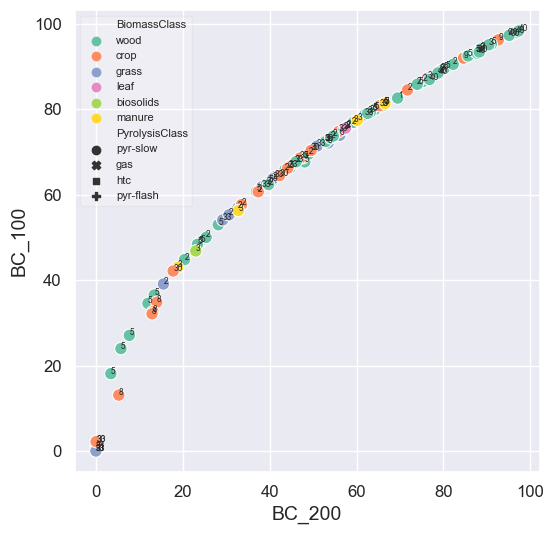

In [184]:
for x in df.select_dtypes(include=np.number).columns.tolist():
    make_corr_scatter(df, y='BC_100', x=x, an=list(metadata.loc[df.index,'ID_art']), saveFig=True)

ValueError: Could not interpret value `BC_100` for parameter `y`

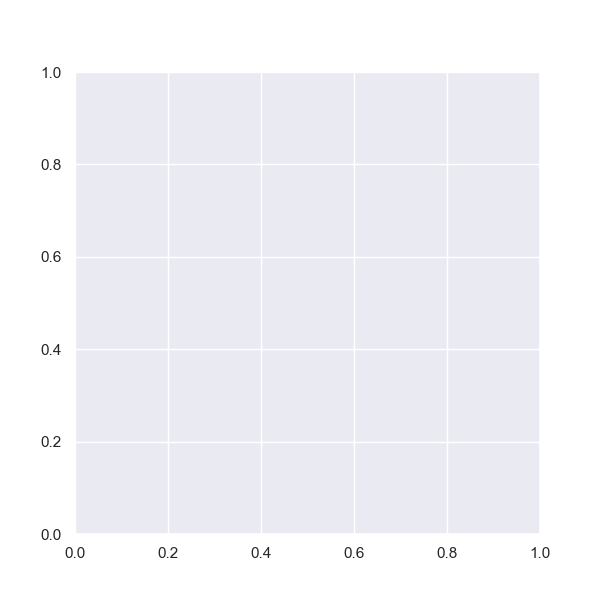

In [171]:
# engineered variables - C, H, O on dry ash free basis
# to attempt fix the high manure ones!
def dry2daf(df, x, ash='Ash'):
    '''
    Convert quantity x expressed in dry-basis to a dry-ash-free basis, with ash content specified.
    New columns: named as `x_daf`
    How are NaNs handled: NaNs in one colum remain NaNs 
    '''
    dff = df.copy()
    dff.replace('na', np.NaN, inplace=True)
    if ash == 'Ash':
        # the mean of both ash content is taken, if any gaps 
        dff['Ash'] = dff[['Ash550', 'Ash700']].mean(axis=1)
    else:
        dff['Ash'] = dff[ash]
    
    dff[x+'_daf'] = dff[x]/(1-dff['Ash'])
    return dff

dafs = ['Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen']
ddf=df.copy()
for d in dafs:
    ddf = dry2daf(ddf, x=d, ash='Ash')
    make_corr_scatter(ddf, y='BC_100', x=d+'_daf', an=list(metadata.loc[df.index,'ID_art']), saveFig=True)

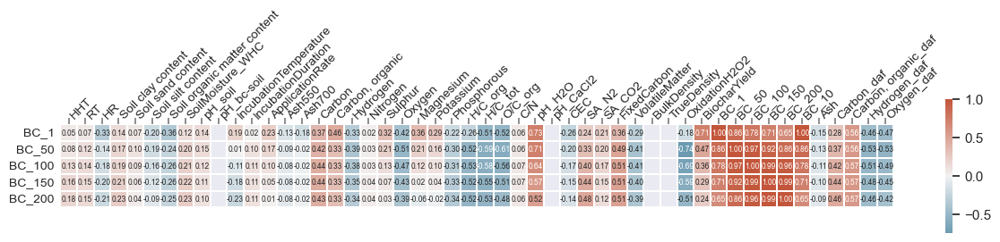

In [33]:
corr = ddf.corr(method='pearson', numeric_only=True)

%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)


sns.heatmap(corr[['BC_1', 'BC_50', 'BC_100', 'BC_150', 'BC_200']].T, cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

plt.savefig('../simulations/correlation-pearson-BCs-numeric.png', dpi=300, bbox_inches='tight')
#plt.show()

In [ ]:
import ternary as ter
from adjustText import adjust_text

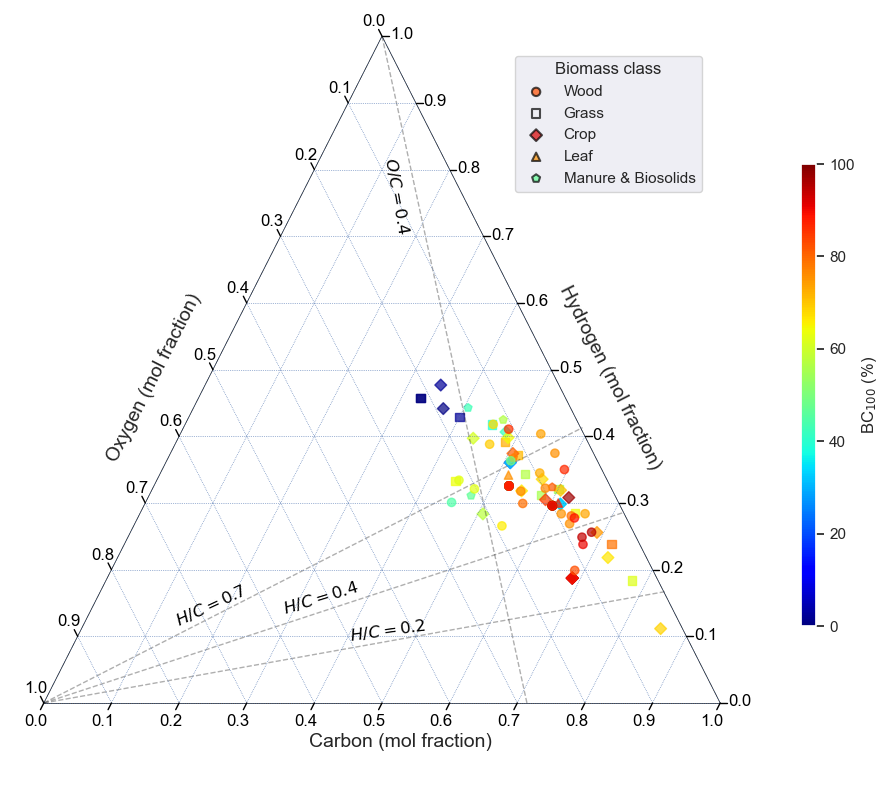

In [36]:
# ternary plot with BC100 as color; and biomass type as marker; and marker border for field experiments
cols = ["BiomassClass", 'Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen', 'BC_100']
ternary = ddf.replace(['na'], np.nan)[cols].copy(deep=True)

# conversion from %weight to mol fractions (so it reflects molar ratios) 
# %weight = g X /g biochar
# %mol = mol X / mol (X+Y+Z) 
# conversion is: %weight / M_X = mol X / g biochar /
M_C = 12.0107
M_H = 1.00784
M_O = 15.999

ternary['Carbon'] = ternary['Carbon'] / M_C
ternary['Carbon, organic'] = ternary['Carbon, organic'] / M_C
ternary['Hydrogen'] = ternary['Hydrogen'] / M_H
ternary['Oxygen'] = ternary['Oxygen'] / M_O
ternary['sum_HOC'] = ternary['Oxygen'] + ternary['Hydrogen'] + ternary['Carbon']
ternary['sum_HOC_org'] = ternary['Oxygen'] + ternary['Hydrogen'] + ternary['Carbon, organic']

ternary['Carbon'] = ternary['Carbon'] / ternary['sum_HOC'] * 100
ternary['Hydrogen'] = ternary['Hydrogen'] / ternary['sum_HOC'] * 100
ternary['Oxygen'] = ternary['Oxygen'] / ternary['sum_HOC'] * 100

# https://github.com/marcharper/python-ternary
fig, tax = ter.figure(scale=1)
fig.set_size_inches(12, 10)

cb_kwargs = {"shrink" : 0.6,
         "pad" : 0.05,
         "aspect" : 30}

# Draw ternary, by biomass class
tax.scatter(ternary[ternary['BiomassClass']=='wood'][['Carbon', 'Hydrogen', 'Oxygen']].values/100,
            label='Wood', marker='o', c=ternary[ternary['BiomassClass']=='wood']['BC_100'], alpha=0.7,
            cmap='jet', colormap='jet', colorbar=True, vmin=0., vmax=100.,cbarlabel='BC$_{100}$ (%)', cb_kwargs=cb_kwargs,zorder=3)

tax.scatter(ternary[ternary['BiomassClass']=='grass'][['Carbon', 'Hydrogen', 'Oxygen']].values/100,
            label='Grass', marker='s', c=ternary[ternary['BiomassClass']=='grass']['BC_100'],
            cmap='jet', colormap='jet', vmin=0, vmax=100, colorbar=False, alpha=0.7)

tax.scatter(ternary[ternary['BiomassClass']=='crop'][['Carbon', 'Hydrogen', 'Oxygen']].values/100,
            label='Crop', marker='D', c=ternary[ternary['BiomassClass']=='crop']['BC_100'],
            cmap='jet', colormap='jet', vmin=0, vmax=100, colorbar=False, alpha=0.7)

tax.scatter(ternary[ternary['BiomassClass']=='leaf'][['Carbon', 'Hydrogen', 'Oxygen']].values/100,
            label='Leaf', marker='^', c=ternary[ternary['BiomassClass']=='leaf']['BC_100'],
            cmap='jet', colormap='jet', vmin=0, vmax=100, colorbar=False, alpha=0.7)

tax.scatter(ternary[ternary['BiomassClass'].isin(['biosolids', 'manure']) ][['Carbon', 'Hydrogen', 'Oxygen']].values/100,
            label='Manure & Biosolids', marker='p', c=ternary[ternary['BiomassClass'].isin(['biosolids', 'manure']) ]['BC_100'],
            cmap='jet', colormap='jet', vmin=0, vmax=100, colorbar=False, alpha=0.7)


# Draw some lines.
cc = 0.59
p1, p2 = (0, 0, 1), (cc, cc*0.70, 1- cc-cc*0.4)
tax.line(p1, p2, linewidth=1, color='k', alpha=0.35, linestyle="--") # H/C = 0.7
tax.get_axes().text(0.19, 0.1, r"$H/C = 0.7$", color='black', rotation=25, fontsize=12) # r"$H/C_{org} = 0.7$"

cc = 0.715
p1, p2 = (0, 0, 1), (cc, cc*0.40, 1- cc-cc*0.4)
tax.line(p1, p2, linewidth=1, color='k', alpha=0.35, linestyle="--") # H/C = 0.4
tax.get_axes().text(0.35, 0.115, r"$H/C = 0.4$", color='black', rotation=17, fontsize=12)

cc = 0.835
p1, p2 = (0, 0, 1), (cc, cc*0.20, 1- cc-cc*0.4)
tax.line(p1, p2, linewidth=1, color='k', alpha=0.35, linestyle="--") # H/C = 0.2
tax.get_axes().text(0.45, 0.081, r"$H/C = 0.2$", color='black', rotation=8, fontsize=12)

cc = 0.716
p1, p2 = (0, 1, 0), (cc, 1-cc-cc*0.40, cc*0.4)
tax.line(p1, p2, linewidth=1, color='k', alpha=0.35, linestyle="--") # O/C = 0.4
tax.get_axes().text(0.5, 0.61, r"$O/C = 0.4$", color='black', rotation=-80, fontsize=12)


# Axis labels. (See below for corner labels.)
fontsize = 14
offset = 0.1
tax.left_axis_label("Oxygen (mol fraction)", fontsize=fontsize, offset=offset)
tax.right_axis_label("Hydrogen (mol fraction)", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("Carbon (mol fraction)", fontsize=fontsize, offset=-offset)

# Decoration.
tax.legend(title="Biomass class", bbox_to_anchor=(0.94, 0.95) )
ax = tax.get_axes()
leg = ax.get_legend()
[(leg.legendHandles[i].set_color('black'), leg.legendHandles[i].set_lw(1.5)) for i, _ in enumerate(leg.legendHandles)]


tax.set_background_color(color='white') #whitesmoke
#plt.Polygon(xy=np.array([ter.project_point(p=(1,0,0)), ter.project_point(p=(0,1,0)) , ter.project_point(p=(0,0,1)) ]),closed=True, color='black', zorder=5)

tax.boundary(linewidth=0.5)
tax.gridlines(multiple=0.1,) # color="grey"
tax.ticks(axis='lbr', linewidth=1, multiple=0.1, tick_formats="%.1f",fontsize=12)
shhh = tax.get_axes().axis('off')

if True:
    tax.savefig('simulations/scatter-'+'BC_100'+'---'+'C-H-O'+'.png', dpi=300, bbox_inches='tight')

Testing below the distance correlation, as implemented in the package: `dcor-0.5.7`


In [ ]:
import dcor as dc

In [122]:
# working with ddf [with ash free variables] and existing corr matrix (to extract names of numeric variables)
dcorr = pd.DataFrame(columns=corr.columns, index=corr.index)
count=0
for x1, x2 in itertools.product(corr.index, corr.columns):
    shivesh = ddf[[x1,x2]].dropna()
    dcorr.loc[x1, x2] = dc.distance_correlation(shivesh[x1], shivesh[x2])
    
    #print(x1, x2, dcorr.loc[x1, x2])
    

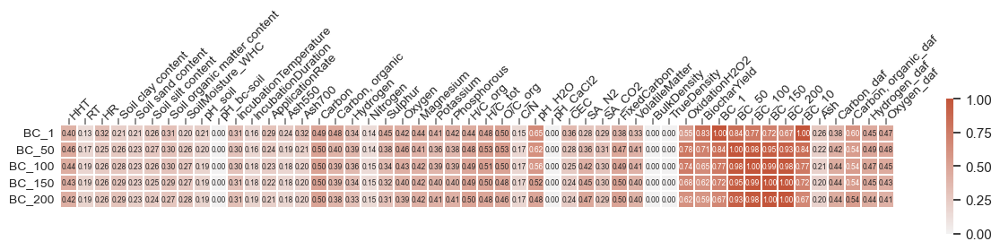

In [123]:
%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

dcorr = dcorr.astype(np.float64)
sns.heatmap(dcorr[['BC_1', 'BC_50', 'BC_100', 'BC_150', 'BC_200']].T, cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

plt.savefig('../simulations/correlation-distance-BCs-numeric.png', dpi=300, bbox_inches='tight')
#plt.show()

High correlation of BCs with (>0.4):
- HHT
- Carbon
- Carbon, organic
- Oxygen
- Mg, K, P, 
- H/C_tot, H/C_org, O/C
- pH biochar
- FixedCarbon
- OxidationH2O2
- Carbon, Carbon, organic, Hydrogen, Oxygen, in daf

Novelty: pH

Note: not same amount of observations for each variable

In [234]:
# working with df_wSf [with ash free variables] and existing corr matrix (to extract names of numeric variables)
corr = df_wSf.corr(method='pearson', numeric_only=True)
dcorr_wSf = pd.DataFrame(columns=corr.columns, index=corr.index)
count=0
for x1, x2 in itertools.product(corr.index, corr.columns):
    shivesh = df_wSf[[x1,x2]].dropna()
    dcorr_wSf.loc[x1, x2] = dc.distance_correlation(shivesh[x1], shivesh[x2])
    #print(x1, x2, dcorr_wSf.loc[x1, x2])

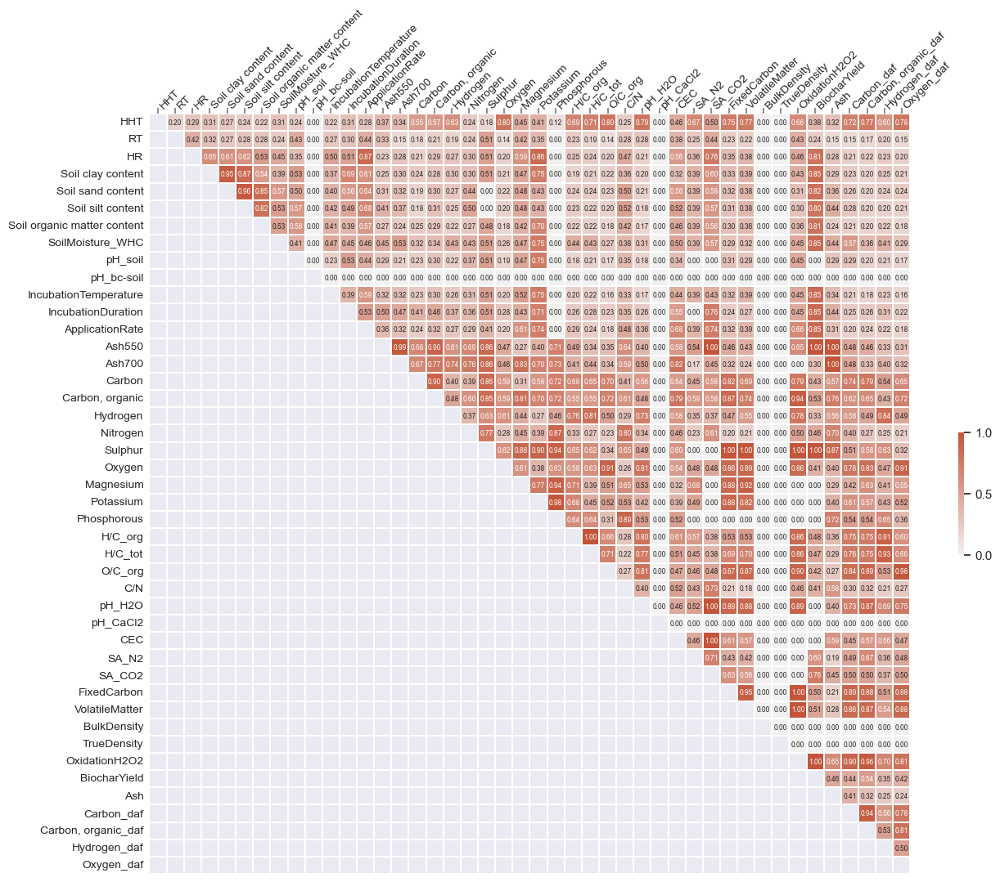

In [247]:
%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

dcorr_wSf = dcorr_wSf.astype(np.float64)

tmp = dcorr_wSf[meta_numeric].T[meta_numeric]
mask = np.triu(np.ones_like(tmp, dtype=bool)).T

sns.heatmap(tmp, cmap=cmap, center=0, mask=mask,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);

#plt.savefig('../simulations/correlation-distance-BCs-numeric.png', dpi=300, bbox_inches='tight')
#plt.show()

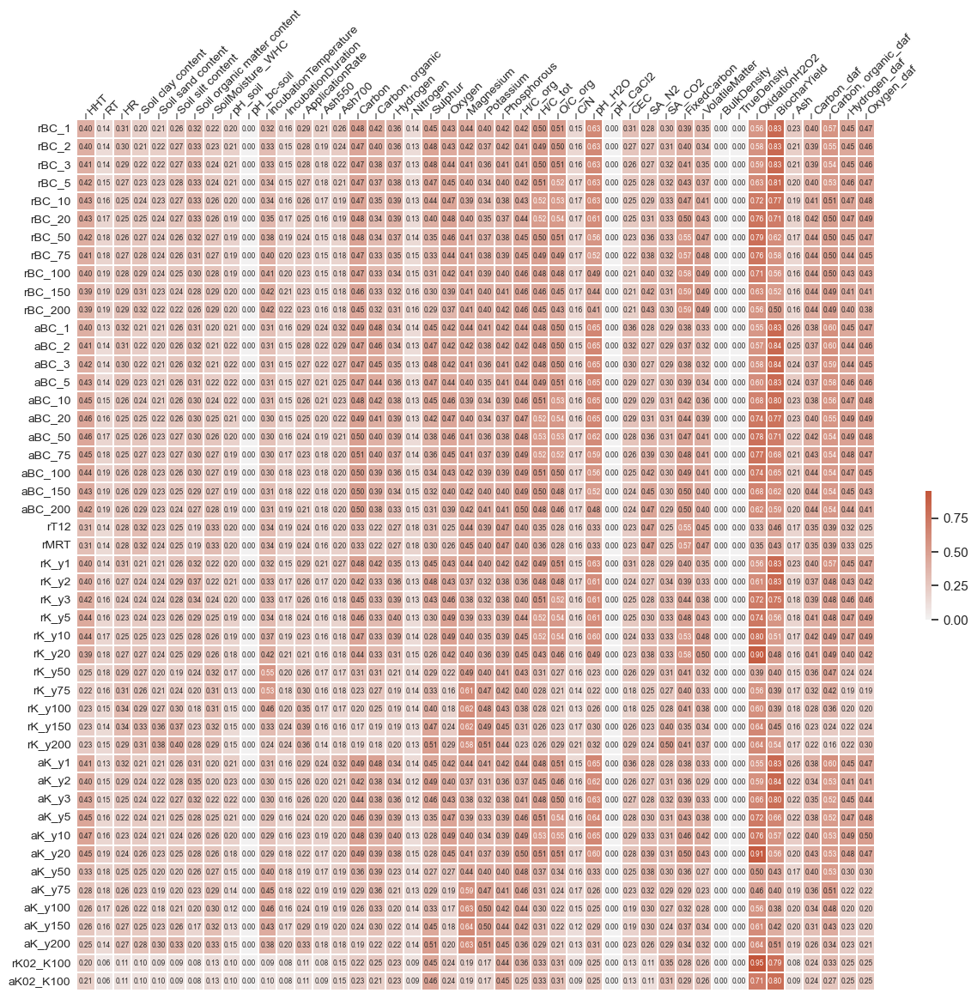

In [251]:
%matplotlib inline
f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

tmp = dcorr_wSf[dSf.columns].T[meta_numeric]
sns.heatmap(tmp, cmap=cmap, center=0,
            square=True, 
            linewidths=.1, linecolor='white',
            cbar_kws={"shrink": 0.13},
            annot=True, annot_kws={"size": 6}, fmt='.2f')

ax.tick_params(axis='both', which='major', labelsize=10, 
               labelbottom = False, bottom=False, top = True, labeltop=True, left=False,
               color="grey", length=5, pad=0)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='left', verticalalignment='baseline',
                   parse_math=True);


### Data selection

In [ ]:
%matplotlib inline
# X [features] cleaning, selecting columns, merging some 
X = mod_metadata.copy(deep=True)
info_cols = ['ID_art', 'NameObs', 'Replicates','Biomass', 'Pyrolysis', 'BiomassLignin', 'Soil type',
             'SoilMoisture_Absolute', 'SoilOrigin', 'SoilGeolocation', 'TotalFluxMeasurement', 'BiocharFluxDetermination', 'OtherIncubationDescription', 'AssociatedControl',
             'Cultivated', 'ID_Lehmann2019', 'ID_Woolf2021', 'ID_Lehmann2021',
             ]
col_to_drop = ['pH_bc-soil', 'Magnesium', 'Potassium', 'Phosphorous', 'ParticleSize', 'BulkDensity',
              'TrueDensity', 'OxidationH2O2', 'BiocharYield', 'δ ¹³C biochar',
              'δ ¹³C soil', 'FixedCarbon', 'VolatileMatter', 'pH_CaCl2', 'CEC', 'SA_N2', 'SA_CO2', 'Sulphur', 'ApplicationRate',]

col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

col_numerical = ['HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content', 'Soil silt content', 'Soil organic matter content',
                'SoilMoisture_WHC', 'pH_soil', 'IncubationTemperature', 'IncubationDuration', 
                'Ash550', 'Ash700', 'Carbon', 'Carbon, organic', 'Hydrogen', 'Nitrogen',
                'Oxygen', 'H/C_org', 'H/C_tot', 'O/C_org', 'C/N', 'pH_H2O',
                ]

# drop irrelevant columns
X.drop(info_cols, axis=1, inplace=True)
opf, opf_x, opf_y = bs.obs_per_feat(X)

X.drop(col_to_drop, axis=1, inplace=True)

# count gaps remaining, per columns, for this model set 
#print(X.isna().sum(axis=0))
print(X.isna().sum().sum(), "remaining nans, in various columns")

# 'SoilMoisture_WHC' : bridge gap, with mode; rationale: most lab experiment used 60%, if different, it is usually reported
c = 'SoilMoisture_WHC'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'pH_soil' : bridge gap, with mode; rationale: for Zimmerman (sand), 1 of Kuzyakov (loess), 
c = 'pH_soil'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'pH_H2O' :  biochar pH in water, bridge gap, with mode; rationale: for Zimmerman  
c = 'pH_H2O'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'Ash550', 'Ash700': merge, if both, take average, otherwise take existing one
#X['Ash'] = X[['Ash550', 'Ash700']].mean(axis=1)
#X.drop(['Ash550', 'Ash700'], axis=1, inplace=True)
#print("droping 2 columns")
#c = 'Ash'
#print("Strategy for:", c)
#print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
#X[c].fillna(X[c].mode()[0], inplace=True)

dafs = ['Carbon', 'Carbon, organic', 'Hydrogen', 'Oxygen']
for d in dafs:
    X = dry2daf(X, x=d, ash='Ash')
    
    
# H/C_all: merge, with strategy: H/C_org if existing, otherwise, H/C_tot; likewise for C, C_org
X['H/C_all'] = X['H/C_org'].fillna(X['H/C_tot'], inplace=False)
X.drop(['H/C_org', 'H/C_tot'], axis=1, inplace=True)
print("droping 2 columns")
X['Carbon, organic'] = X['Carbon, organic'].fillna(X['Carbon'], inplace=False)

# fill all the rest with mode; slightly brutal
print(X.isna().sum().sum(), "remaining nans, in various columns, filled with mode")
X.fillna(X.mode().loc[0,:], inplace=True)

opf, opf_x, opf_y = bs.obs_per_feat(X)

# count gaps remaining, per columns, for this model set 
#print(X.isna().sum(axis=0).sum())


From the graphs generated by the function obs_per_feat, we find that:

   - 1. We easily can have 110 observations with a complete set of 20-24 features, doing some minor data gaps filling.
   
   - 2. For comparison, in the 2019 pre-project, I had 64 observations with 15 features only.

In [64]:
#Xcombi = bs.featcombin(X, n=len(X.columns))
#len(Xcombi)

33554432

In [65]:
Xcombi = bs.featcombin(X, n=3)
len(Xcombi)

2626

The number of combination possible for 24 features is such that it does not seem realistic, nor smart, to test all of them. A selection has to be made, based on the following:

1. Models with many features are not usable in practice and are not necessarily more informative than with fewer features
2. Models with 20, 21, .. or 24 features are the same to us
3. It is interesting to check all combinations of features, with a total of 1, 2, 3, 4, 5 features? 50k combinations
4. This, we should/could also filter out features that are not very informative (e.g. pH) or combinations that have high correlations, or base the selection on our domain knowledge

In [ ]:
# Y [target] getting BC100c, or BC100 uncorrected, or BC_Th_Ts
Y = mod_bestfit['BC100c']
#Y = mod_bestfit['BC100']

# 
XY = X.copy(deep=True)
XY['BC100c'] = Y

Tutorial on how to process data with both categorical and numerical, efficiently:

https://inria.github.io/scikit-learn-mooc/python_scripts/03_categorical_pipeline_column_transformer.html

### Data scaling/encoding

In [105]:
XY.drop(labels=['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate' #'RT', 'HR',
               #'IncubationTemperature', 'IncubationDuration','pH_H2O'
               ], axis=1, inplace=True)

In [106]:
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(XY)
categorical_columns = categorical_columns_selector(XY)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = StandardScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)])

### Principal component analysis

In [67]:
model_PCA = make_pipeline(preprocessor, PCA(n_components=5))
model_PCA

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  StandardScaler(),
                                                  ['HHT', 'RT', 'HR',
                                                   'Soil clay content',
                                                   'Soil sand content',
                                                   'Soil silt content',
                                                   'Soil organic matter '
                                                   'content',
                                                   'SoilMoisture_WHC',
                                                   'pH_soil',
                                                   'IncubationTemperature',
                                                   'IncubationDuration',
                                                   'Carbon', 'Carbon, organic',
                                                   'Hydrogen', 'Nitrogen',
                                                   'Oxygen', 'O/C_org', 'C/N',
                                                   'pH_H2O', 'Ash', 'H/C_all',
                                                   'BC100c'])])),
                ('pca', PCA(n_components=5))])

In [68]:
_ = model_PCA.fit(XY)
projected = model_PCA.fit_transform(XY)

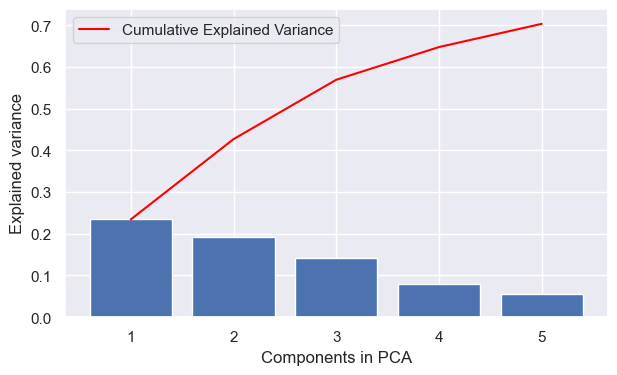

In [69]:
%matplotlib inline

# based on: https://ostwalprasad.github.io/machine-learning/PCA-using-python.html 
expl_var = model_PCA.named_steps['pca'].explained_variance_ratio_

fig, ax = plt.subplots(figsize=(7,4))
ax.bar(range(1,len(expl_var)+1),expl_var )

ax.plot(np.arange(len(expl_var))+1, expl_var.cumsum(), c='red', label="Cumulative Explained Variance")
plt.legend(loc='upper left')

plt.xlabel('Components in PCA')
plt.ylabel('Explained variance');

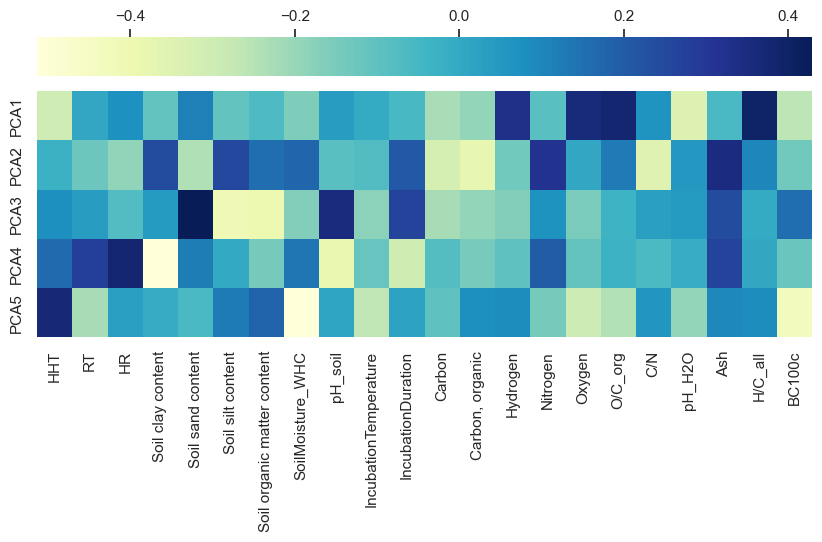

In [70]:
transformedfeatures = list(model_PCA.named_steps['columntransformer'].get_feature_names_out())
transformedfeatures = [x.removeprefix("one-hot-encoder__") for x in transformedfeatures]
transformedfeatures = [x.removeprefix("standard_scaler__") for x in transformedfeatures]
#transformedfeatures
## QUESTION: AM I SURE THAT THE ORDER OF THE COLUMNS HERE MATCH WITH WHAT IS PLOTTED 
pcamodel = model_PCA.named_steps['pca']

fig, ax = plt.subplots(figsize=(10,4))
ax = sns.heatmap(pcamodel.components_,
                 cmap='YlGnBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pcamodel.n_components_+1)],
                 xticklabels=transformedfeatures,
                 cbar_kws={"orientation": "horizontal", "location":"top"})
#ax.set_aspect("equal")

(<Figure size 1000x800 with 2 Axes>, <AxesSubplot: xlabel='PC2', ylabel='PC1'>)

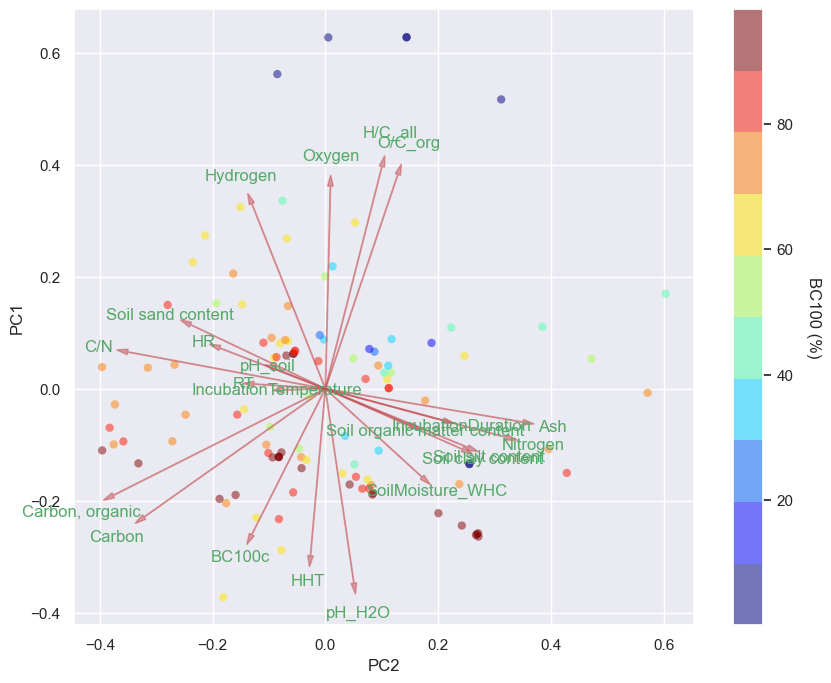

In [71]:
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, 26, Y, cbartxt="BC100 (%)")

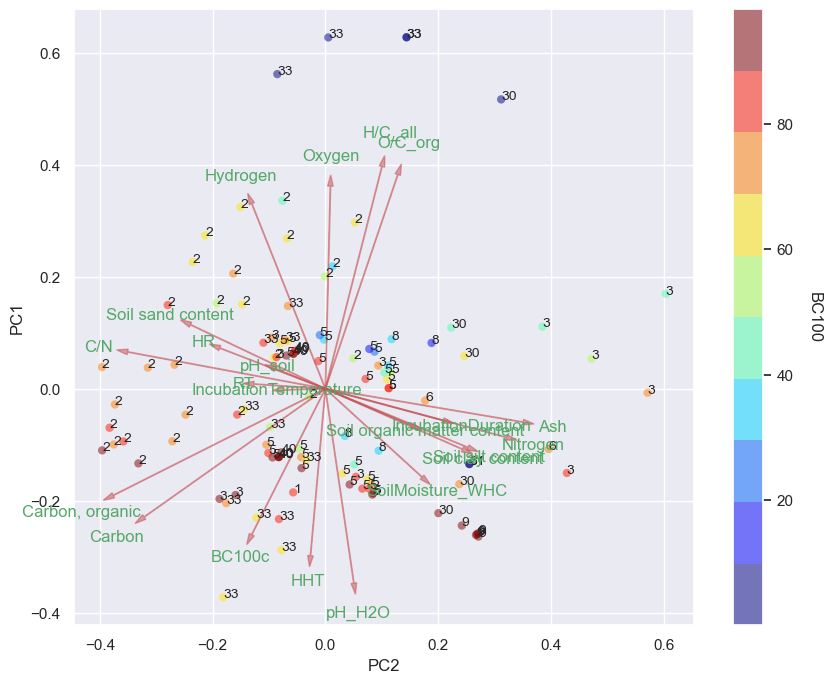

In [40]:
remap_ID_art = {x:a+1 for a,x in enumerate(mod_metadata['ID_art'].unique())}
newart = [remap_ID_art[x] for x in mod_metadata['ID_art'] ]
remapped_ID_art = pd.DataFrame(index=mod_metadata['ID_art'].index)
remapped_ID_art['ID_art'] = newart
fig, ax = bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, 26, 
                             Y, cbartxt="BC100", annotate=True, texts=list(mod_metadata['ID_art']))

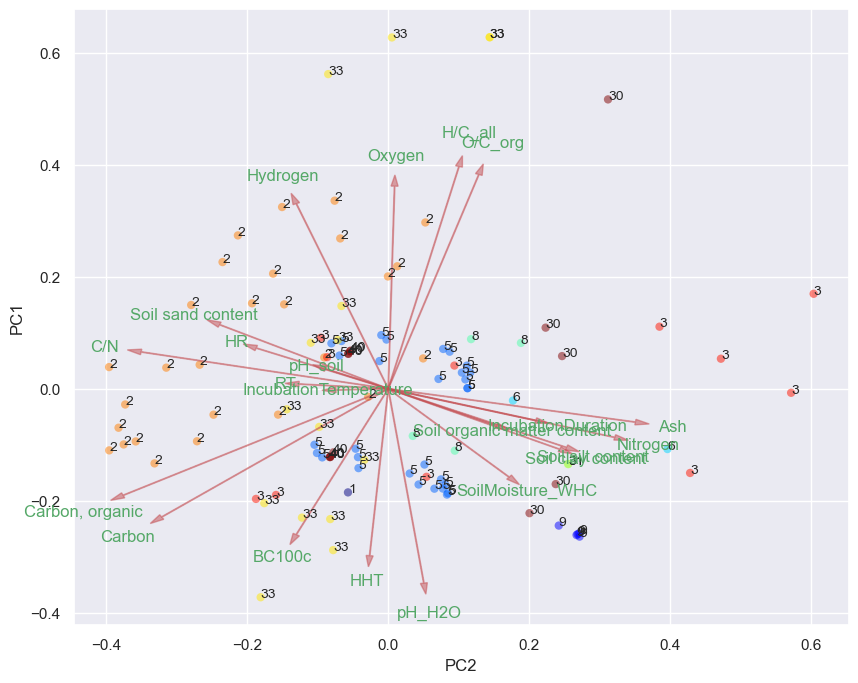

In [43]:
remap_ID_art = {x:a+1 for a,x in enumerate(mod_metadata['ID_art'].unique())}
newart = [remap_ID_art[x] for x in mod_metadata['ID_art'] ]
remapped_ID_art = pd.DataFrame(index=mod_metadata['ID_art'].index)
remapped_ID_art['ID_art'] = newart
fig, ax = bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, 26, 
                             remapped_ID_art['ID_art'], cbartxt=False, annotate=True, texts=list(mod_metadata['ID_art']))

In [33]:
pd.DataFrame([mod_metadata['ID_art'].unique(), mod_metadata['AuthorDate'].unique()]).T

,0,1
0,1,Major2010
1,9,Wu2016
2,5,Fang2014
3,6,Kuzyakov2014
4,8,Herath2015
5,31,Ventura2019
6,33,Budai2016
7,2,Zimmermann 2010
8,3,Singh2012
9,30,Liu2020


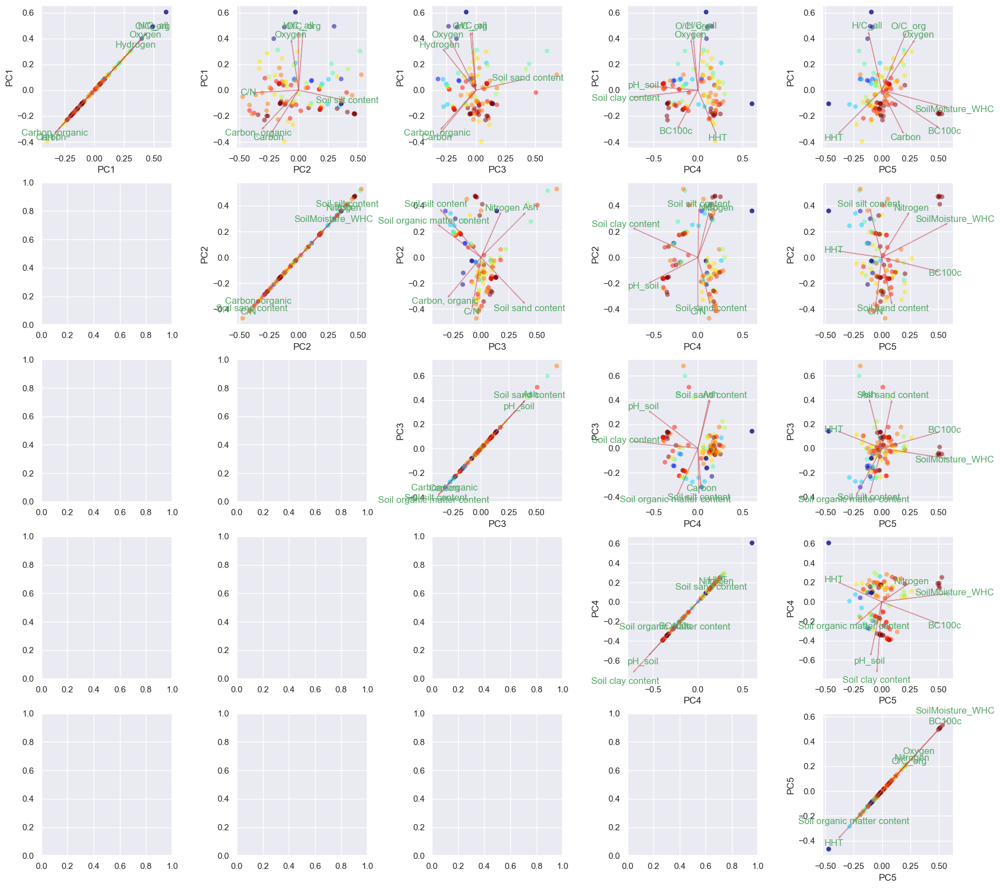

In [45]:
fig, ax = plt.subplots(5,5, figsize=(18, 4*4))
a=7
#row 1
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 0, a, Y, fig=fig, ax=ax[0,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, a, Y, fig=fig, ax=ax[0,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 0, a, Y, fig=fig, ax=ax[0,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 0, a, Y, fig=fig, ax=ax[0,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 0, a, Y, fig=fig, ax=ax[0,4])

#row 2
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 1, a, Y, fig=fig, ax=ax[1,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 1, a, Y, fig=fig, ax=ax[1,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 1, a, Y, fig=fig, ax=ax[1,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 1, a, Y, fig=fig, ax=ax[1,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 1, a, Y, fig=fig, ax=ax[1,4])

#row 3
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 2, a, Y, fig=fig, ax=ax[2,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 2, a, Y, fig=fig, ax=ax[2,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 2, a, Y, fig=fig, ax=ax[2,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 2, a, Y, fig=fig, ax=ax[2,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 2, a, Y, fig=fig, ax=ax[2,4])

#row 4
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 3, a, Y, fig=fig, ax=ax[3,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 3, a, Y, fig=fig, ax=ax[3,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 3, a, Y, fig=fig, ax=ax[3,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 3, a, Y, fig=fig, ax=ax[3,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 3, a, Y, fig=fig, ax=ax[3,4])

#row 5
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 4, a, Y, fig=fig, ax=ax[4,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 4, a, Y, fig=fig, ax=ax[4,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 4, a, Y, fig=fig, ax=ax[4,2])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 4, a, Y, fig=fig, ax=ax[4,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 4, a, Y, fig=fig, ax=ax[4,4])

fig.tight_layout(w_pad=0, h_pad=0.2)
fig.savefig('../simulations/PCA.png', dpi=300)

0.5570708196748237

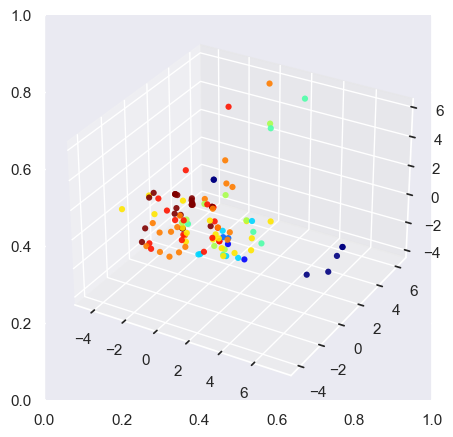

In [224]:
fig, ax = plt.subplots(figsize=(5,5),)# facecolor='white')
ax = plt.axes(projection ="3d")
ax.scatter3D(projected[:, 0], projected[:, 1],projected[:, 2],
            c=Y, edgecolor='none', alpha=0.9,
            cmap=plt.cm.get_cmap('jet', 10))
#ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

#plt.colorbar();
expl_var[0:3].sum()

Conclusion form PCA:

- RobustScaler and StandardScalar do not provide the same PCA. RobustScaler reaches 80%+ with 3 features, while only 56% with StandardScaler. 
- When plotting in 2D or 3D, with BC100c target variable, some "groups" seem to emerge in the visualisation

Addition:
- Plotting loading of each features on the components was informative. In particular, we could learn that:
    - Residence Time: seems to be a distinguishing characteristics of 5 observations; but does not affect much BC100c
    - H/C_all, C, H: are informative, in PC2xPC3, but not fully covariant (arrows not aligned)
    - N content & ash content: are somewhat informative, in PC2xPC3, are pretty much covariant there, but not in PC2xPC4 
    - 

#### How does the data look like in the space, Ash, C, H/C?

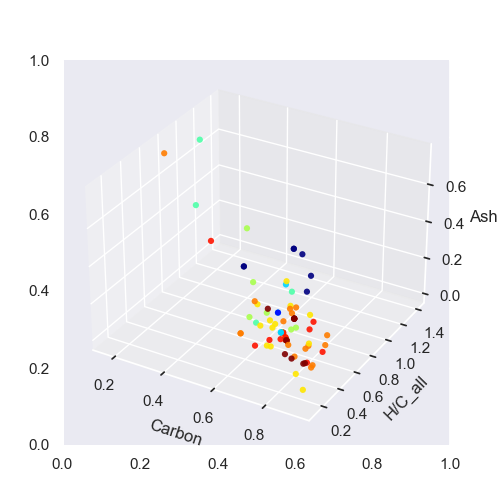

In [22]:
%matplotlib widget
fX = X[list(feature_sets[2239])]

fig, ax = plt.subplots(figsize=(5,5),)# facecolor='white')
ax = plt.axes(projection ="3d")
ax.scatter(fX['Carbon'],fX['H/C_all'],fX['Ash'],
            c=MT_Y['BC_100'], edgecolor='none', alpha=0.9,
            cmap=plt.cm.get_cmap('jet', 10))
ax.set_xlabel('Carbon');
ax.set_ylabel('H/C_all');
ax.set_zlabel('Ash');

#### PCA with Stability features

268 remaining nans, in various columns
Strategy for: SoilMoisture_WHC
	Mode: 0.7 will be replaced in 3 rows
Strategy for: pH_soil
	Mode: 6.8 will be replaced in 29 rows
Strategy for: pH_H2O
	Mode: 8.64 will be replaced in 35 rows
droping 2 columns
Strategy for: Ash
	Mode: 0.03 will be replaced in 2 rows
droping 2 columns
97 remaining nans, in various columns, filled with mode


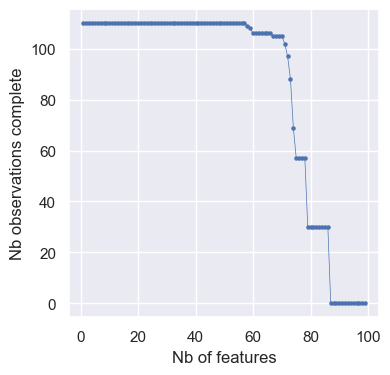

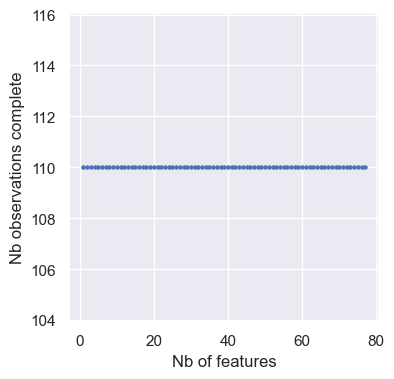

In [504]:
%matplotlib inline
# X [features] cleaning, selecting columns, merging some 
X = df_wSf.copy(deep=True)
info_cols = ['ID_art', 'NameObs', 'Replicates','Biomass', 'Pyrolysis', 'BiomassLignin', 'Soil type',
             'SoilMoisture_Absolute', 'SoilOrigin', 'SoilGeolocation', 'TotalFluxMeasurement', 'BiocharFluxDetermination', 'OtherIncubationDescription', 'AssociatedControl',
             'Cultivated', 'ID_Lehmann2019', 'ID_Woolf2021', 'ID_Lehmann2021',
             ]
col_to_drop = ['pH_bc-soil', 'Magnesium', 'Potassium', 'Phosphorous', 'ParticleSize', 'BulkDensity',
              'TrueDensity', 'OxidationH2O2', 'BiocharYield', 'δ ¹³C biochar',
              'δ ¹³C soil', 'FixedCarbon', 'VolatileMatter', 'pH_CaCl2', 'CEC', 'SA_N2', 'SA_CO2', 'Sulphur', 'ApplicationRate',]

col_categorical = ['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate']

# drop irrelevant columns
# X.drop(info_cols, axis=1, inplace=True)
opf, opf_x, opf_y = bs.obs_per_feat(X)

X.drop(col_to_drop, axis=1, inplace=True)

# count gaps remaining, per columns, for this model set 
#print(X.isna().sum(axis=0))
print(X.isna().sum().sum(), "remaining nans, in various columns")

# 'SoilMoisture_WHC' : bridge gap, with mode; rationale: most lab experiment used 60%, if different, it is usually reported
c = 'SoilMoisture_WHC'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'pH_soil' : bridge gap, with mode; rationale: for Zimmerman (sand), 1 of Kuzyakov (loess), 
c = 'pH_soil'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'pH_H2O' :  biochar pH in water, bridge gap, with mode; rationale: for Zimmerman  
c = 'pH_H2O'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# 'Ash550', 'Ash700': merge, if both, take average, otherwise take existing one
X['Ash'] = X[['Ash550', 'Ash700']].mean(axis=1)
X.drop(['Ash550', 'Ash700'], axis=1, inplace=True)
print("droping 2 columns")
c = 'Ash'
print("Strategy for:", c)
print("\tMode:", X[c].mode()[0], "will be replaced in", X[c].isna().sum(), "rows")
X[c].fillna(X[c].mode()[0], inplace=True)

# H/C_all: merge, with strategy: H/C_org if existing, otherwise, H/C_tot; likewise for C, C_org
X['H/C_all'] = X['H/C_org'].fillna(X['H/C_tot'], inplace=False)
X.drop(['H/C_org', 'H/C_tot'], axis=1, inplace=True)
print("droping 2 columns")
X['Carbon, organic'] = X['Carbon, organic'].fillna(X['Carbon'], inplace=False)

# fill all the rest with mode; slightly brutal
print(X.isna().sum().sum(), "remaining nans, in various columns, filled with mode")
X.fillna(X.mode().loc[0,:], inplace=True)

opf, opf_x, opf_y = bs.obs_per_feat(X)

# count gaps remaining, per columns, for this model set 
#print(X.isna().sum(axis=0).sum())


In [308]:
X.drop(labels=['BiomassClass', 'PyrolysisClass', 'LabField', 'AuthorDate' #'RT', 'HR',
               #'IncubationTemperature', 'IncubationDuration','pH_H2O'
               ], axis=1, inplace=True)

In [309]:
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(X)
categorical_columns = categorical_columns_selector(X)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = StandardScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)])

model_PCA = make_pipeline(preprocessor, PCA(n_components=5))
model_PCA

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  StandardScaler(),
                                                  ['HHT', 'RT', 'HR',
                                                   'Soil clay content',
                                                   'Soil sand content',
                                                   'Soil silt content',
                                                   'Soil organic matter '
                                                   'content',
                                                   'SoilMoisture_WHC',
                                                   'pH_soil',
                                                   'IncubationTemperature',
                                                   'IncubationDuration',
                                                   'Carbon', 'Carbon, organic',
                                                   'Hydrogen', 'Nitrogen',
                                                   'Oxygen', 'O/C_org', 'C/N',
                                                   'pH_H2O', 'Ash',
                                                   'Carbon_daf',
                                                   'Carbon, organic_daf',
                                                   'Hydrogen_daf', 'Oxygen_daf',
                                                   'rBC_1', 'rBC_2', 'rBC_3',
                                                   'rBC_5', 'rBC_10', 'rBC_20', ...])])),
                ('pca', PCA(n_components=5))])

In [310]:
_ = model_PCA.fit(X)
projected = model_PCA.fit_transform(X)

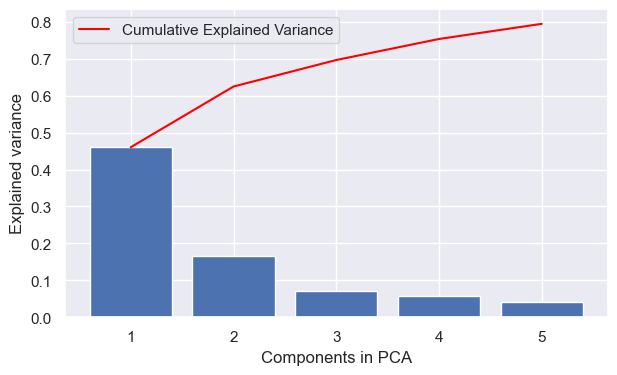

In [311]:
%matplotlib inline

# based on: https://ostwalprasad.github.io/machine-learning/PCA-using-python.html 
expl_var = model_PCA.named_steps['pca'].explained_variance_ratio_

fig, ax = plt.subplots(figsize=(7,4))
ax.bar(range(1,len(expl_var)+1),expl_var )

ax.plot(np.arange(len(expl_var))+1, expl_var.cumsum(), c='red', label="Cumulative Explained Variance")
plt.legend(loc='upper left')

plt.xlabel('Components in PCA')
plt.ylabel('Explained variance');

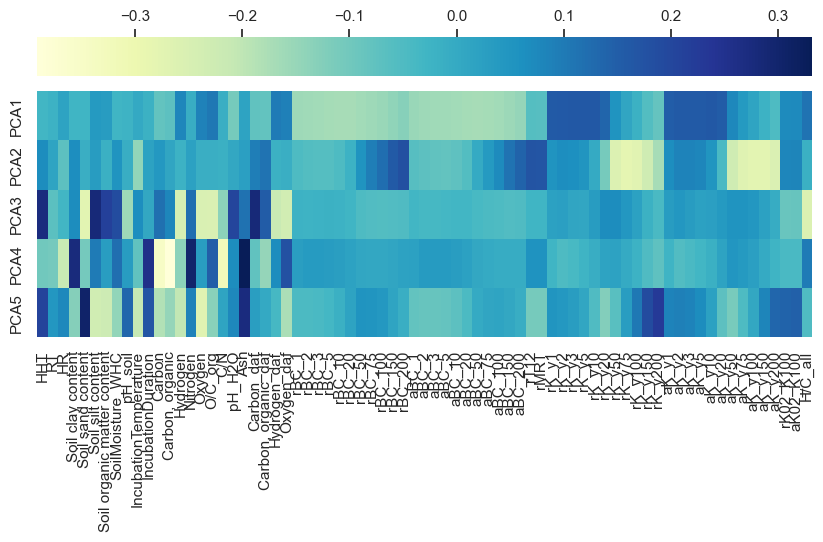

In [312]:
transformedfeatures = list(model_PCA.named_steps['columntransformer'].get_feature_names_out())
transformedfeatures = [x.removeprefix("one-hot-encoder__") for x in transformedfeatures]
transformedfeatures = [x.removeprefix("standard_scaler__") for x in transformedfeatures]
#transformedfeatures
## QUESTION: AM I SURE THAT THE ORDER OF THE COLUMNS HERE MATCH WITH WHAT IS PLOTTED 
pcamodel = model_PCA.named_steps['pca']

fig, ax = plt.subplots(figsize=(10,4))
ax = sns.heatmap(pcamodel.components_,
                 cmap='YlGnBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pcamodel.n_components_+1)],
                 xticklabels=transformedfeatures,
                 cbar_kws={"orientation": "horizontal", "location":"top"})
#ax.set_aspect("equal")

(<Figure size 1000x800 with 2 Axes>, <AxesSubplot: xlabel='PC2', ylabel='PC1'>)

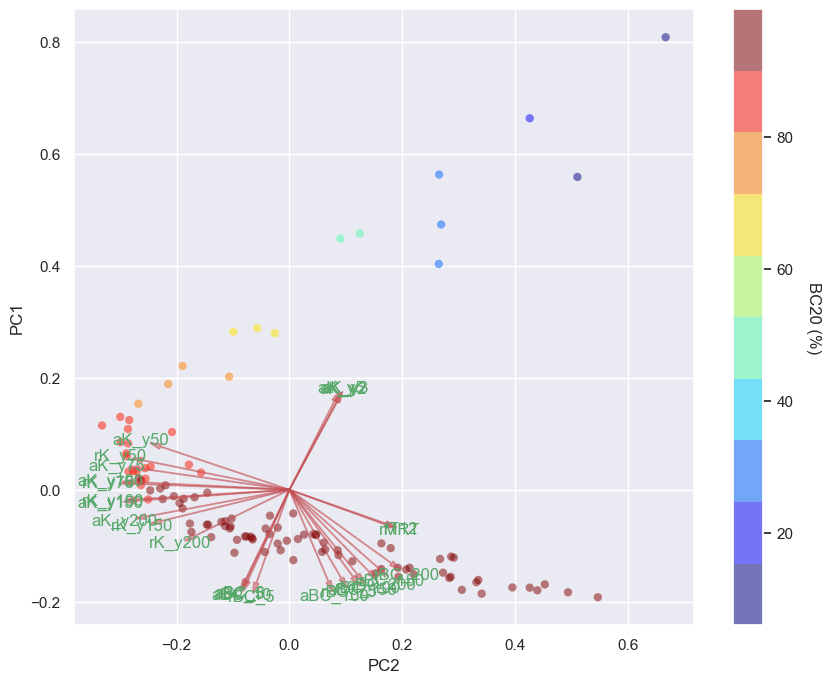

In [314]:
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, 26, X['aBC_20'], cbartxt="BC20 (%)")

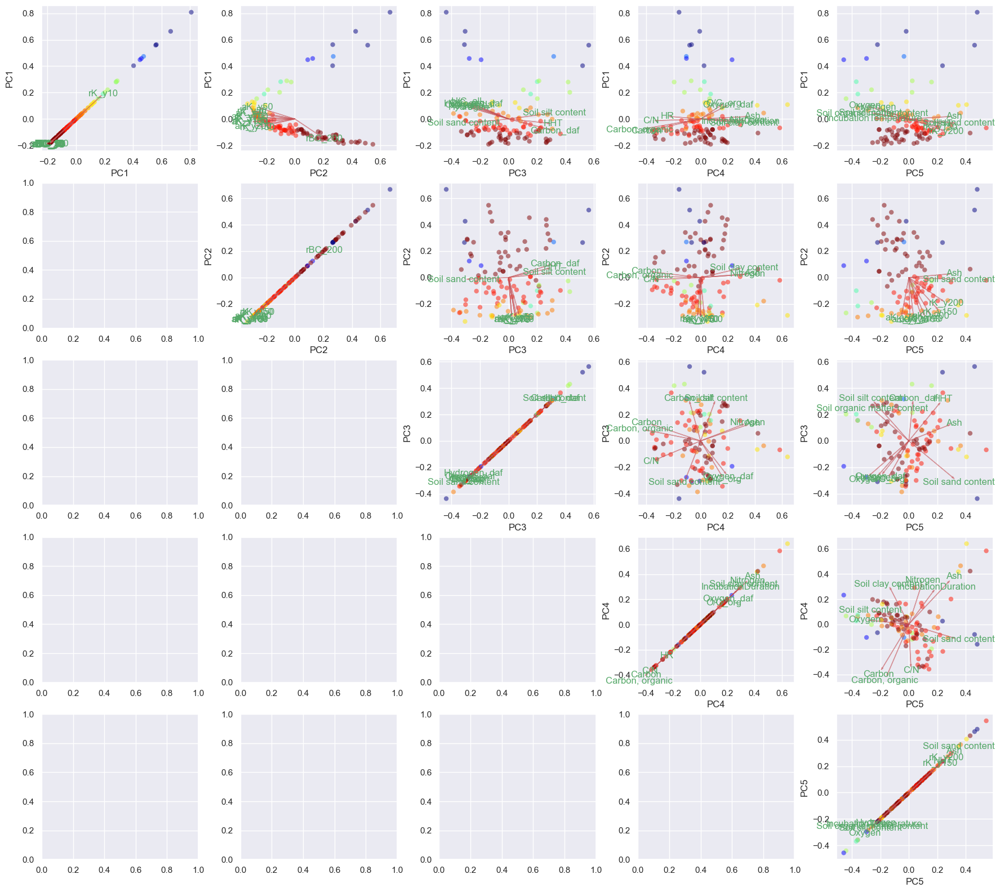

In [325]:
fig, ax = plt.subplots(5,5, figsize=(18, 4*4))
a=10
Y = X['aBC_50'] 
#row 1
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 0, a, Y, fig=fig, ax=ax[0,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, a, Y, fig=fig, ax=ax[0,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 0, a, Y, fig=fig, ax=ax[0,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 0, a, Y, fig=fig, ax=ax[0,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 0, a, Y, fig=fig, ax=ax[0,4])

#row 2
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 1, a, Y, fig=fig, ax=ax[1,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 1, a, Y, fig=fig, ax=ax[1,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 1, a, Y, fig=fig, ax=ax[1,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 1, a, Y, fig=fig, ax=ax[1,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 1, a, Y, fig=fig, ax=ax[1,4])

#row 3
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 2, a, Y, fig=fig, ax=ax[2,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 2, a, Y, fig=fig, ax=ax[2,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 2, a, Y, fig=fig, ax=ax[2,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 2, a, Y, fig=fig, ax=ax[2,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 2, a, Y, fig=fig, ax=ax[2,4])

#row 4
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 3, a, Y, fig=fig, ax=ax[3,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 3, a, Y, fig=fig, ax=ax[3,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 3, a, Y, fig=fig, ax=ax[3,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 3, a, Y, fig=fig, ax=ax[3,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 3, a, Y, fig=fig, ax=ax[3,4])

#row 5
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 4, a, Y, fig=fig, ax=ax[4,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 4, a, Y, fig=fig, ax=ax[4,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 4, a, Y, fig=fig, ax=ax[4,2])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 4, a, Y, fig=fig, ax=ax[4,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 4, a, Y, fig=fig, ax=ax[4,4])

fig.tight_layout(w_pad=0, h_pad=0.2)
fig.savefig('../simulations/PCA_wSf.png', dpi=300)

#### PCA with sub-set of metadata

Let's select a subset of non-correlated metadata, based on the Pearson correlation matrices, and perform PCA on this subset. Let's select 5 numerical metadata.



In [86]:
XY_5cols = XY.copy()
XY_5cols.columns

Index(['HHT', 'RT', 'HR', 'Soil clay content', 'Soil sand content',
       'Soil silt content', 'Soil organic matter content', 'SoilMoisture_WHC',
       'pH_soil', 'IncubationTemperature', 'IncubationDuration', 'Carbon',
       'Carbon, organic', 'Hydrogen', 'Nitrogen', 'Oxygen', 'O/C_org', 'C/N',
       'pH_H2O', 'Ash', 'H/C_all', 'BC100c'],
      dtype='object')

In [87]:
FiveCols = ['Soil silt content', 'SoilMoisture_WHC', 'Ash', 'Nitrogen', 'H/C_all', 'pH_H2O']
XY_5cols = XY_5cols[FiveCols].copy()

In [88]:
def setupPCA(XY):
    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)

    numerical_columns = numerical_columns_selector(XY)
    categorical_columns = categorical_columns_selector(XY)

    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = StandardScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)])

    model_PCA = make_pipeline(preprocessor, PCA(n_components=5))
    _ = model_PCA.fit(XY)
    projected = model_PCA.fit_transform(XY)
    
    return model_PCA, projected

model_PCA, projected = setupPCA(XY_5cols)

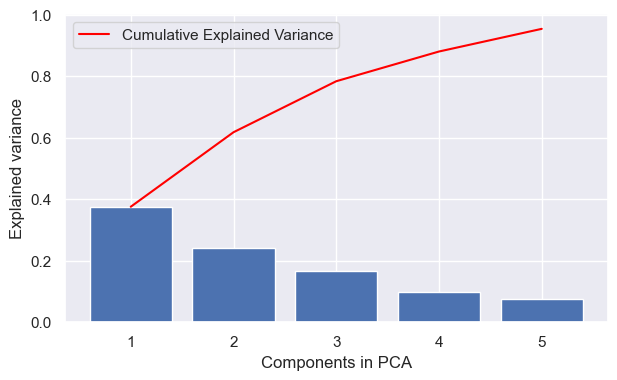

In [89]:
%matplotlib inline

# based on: https://ostwalprasad.github.io/machine-learning/PCA-using-python.html 
expl_var = model_PCA.named_steps['pca'].explained_variance_ratio_

fig, ax = plt.subplots(figsize=(7,4))
ax.bar(range(1,len(expl_var)+1),expl_var )

ax.plot(np.arange(len(expl_var))+1, expl_var.cumsum(), c='red', label="Cumulative Explained Variance")
plt.legend(loc='upper left')

plt.xlabel('Components in PCA')
plt.ylabel('Explained variance');

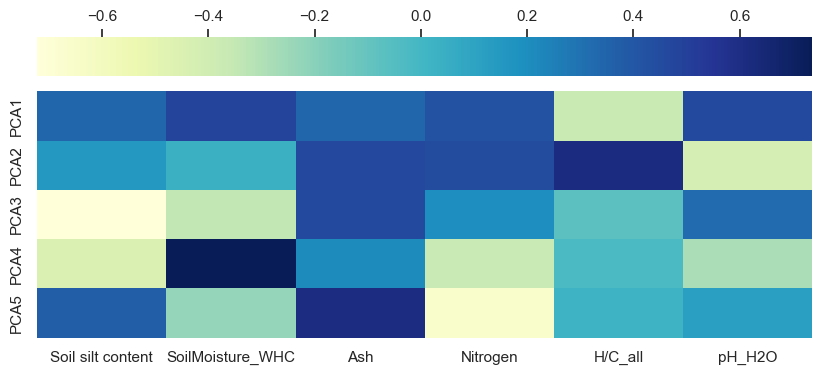

In [90]:
transformedfeatures = list(model_PCA.named_steps['columntransformer'].get_feature_names_out())
transformedfeatures = [x.removeprefix("one-hot-encoder__") for x in transformedfeatures]
transformedfeatures = [x.removeprefix("standard_scaler__") for x in transformedfeatures]
#transformedfeatures
## QUESTION: AM I SURE THAT THE ORDER OF THE COLUMNS HERE MATCH WITH WHAT IS PLOTTED 
pcamodel = model_PCA.named_steps['pca']

fig, ax = plt.subplots(figsize=(10,4))
ax = sns.heatmap(pcamodel.components_,
                 cmap='YlGnBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pcamodel.n_components_+1)],
                 xticklabels=transformedfeatures,
                 cbar_kws={"orientation": "horizontal", "location":"top"})
#ax.set_aspect("equal")

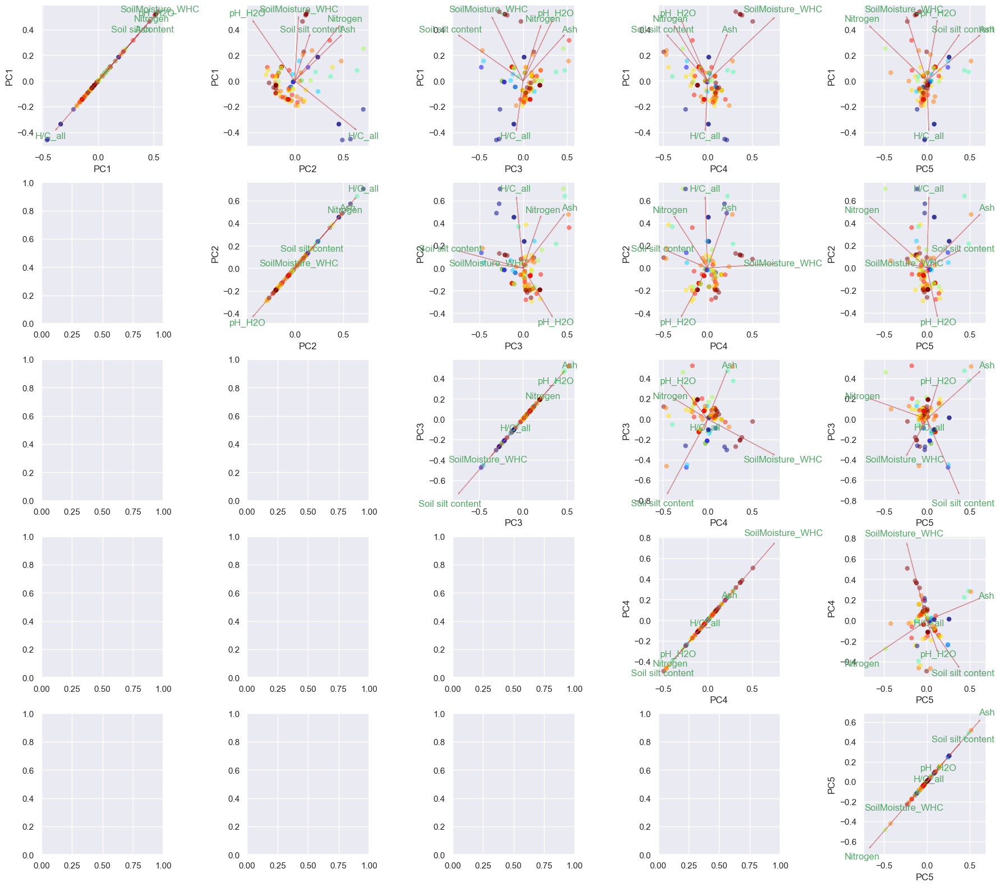

In [91]:
fig, ax = plt.subplots(5,5, figsize=(18, 4*4))
a=7
#row 1
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 0, a, Y, fig=fig, ax=ax[0,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 0, a, Y, fig=fig, ax=ax[0,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 0, a, Y, fig=fig, ax=ax[0,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 0, a, Y, fig=fig, ax=ax[0,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 0, a, Y, fig=fig, ax=ax[0,4])

#row 2
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 1, a, Y, fig=fig, ax=ax[1,0])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 1, a, Y, fig=fig, ax=ax[1,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 1, a, Y, fig=fig, ax=ax[1,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 1, a, Y, fig=fig, ax=ax[1,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 1, a, Y, fig=fig, ax=ax[1,4])

#row 3
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 2, a, Y, fig=fig, ax=ax[2,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 2, a, Y, fig=fig, ax=ax[2,1])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 2, a, Y, fig=fig, ax=ax[2,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 2, a, Y, fig=fig, ax=ax[2,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 2, a, Y, fig=fig, ax=ax[2,4])

#row 4
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 3, a, Y, fig=fig, ax=ax[3,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 3, a, Y, fig=fig, ax=ax[3,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 3, a, Y, fig=fig, ax=ax[3,2])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 3, a, Y, fig=fig, ax=ax[3,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 3, a, Y, fig=fig, ax=ax[3,4])

#row 5
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 0, 4, a, Y, fig=fig, ax=ax[4,0])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 1, 4, a, Y, fig=fig, ax=ax[4,1])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 2, 4, a, Y, fig=fig, ax=ax[4,2])
#bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 3, 4, a, Y, fig=fig, ax=ax[4,3])
bs.plot_pca_biplot(projected, pcamodel.components_, transformedfeatures, 4, 4, a, Y, fig=fig, ax=ax[4,4])

fig.tight_layout(w_pad=0, h_pad=0.2)
#fig.savefig('../simulations/PCA_subset.png', dpi=300)

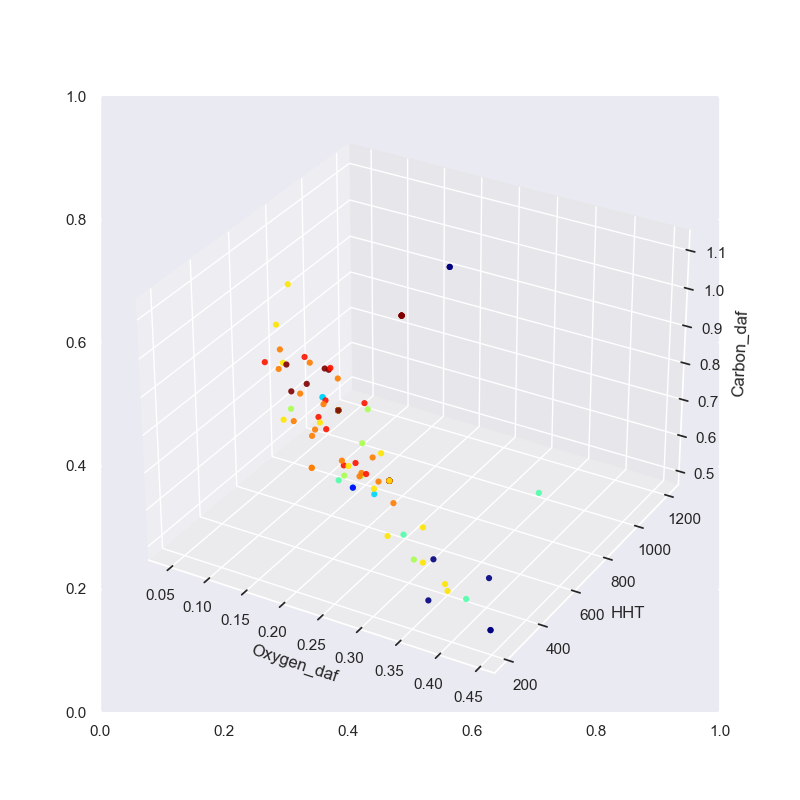

In [41]:
%matplotlib widget
one = 'Oxygen_daf'
two = 'HHT'
three = 'Carbon_daf'

fig, ax = plt.subplots(figsize=(8,8),)# facecolor='white')
ax = plt.axes(projection ="3d")
ax.scatter(XY[one],XY[two],XY[three],
            c=XY['BC100c'], edgecolor='none', alpha=0.9,
            cmap=plt.cm.get_cmap('jet', 10))
ax.set_xlabel(one);
ax.set_ylabel(two);
ax.set_zlabel(three);

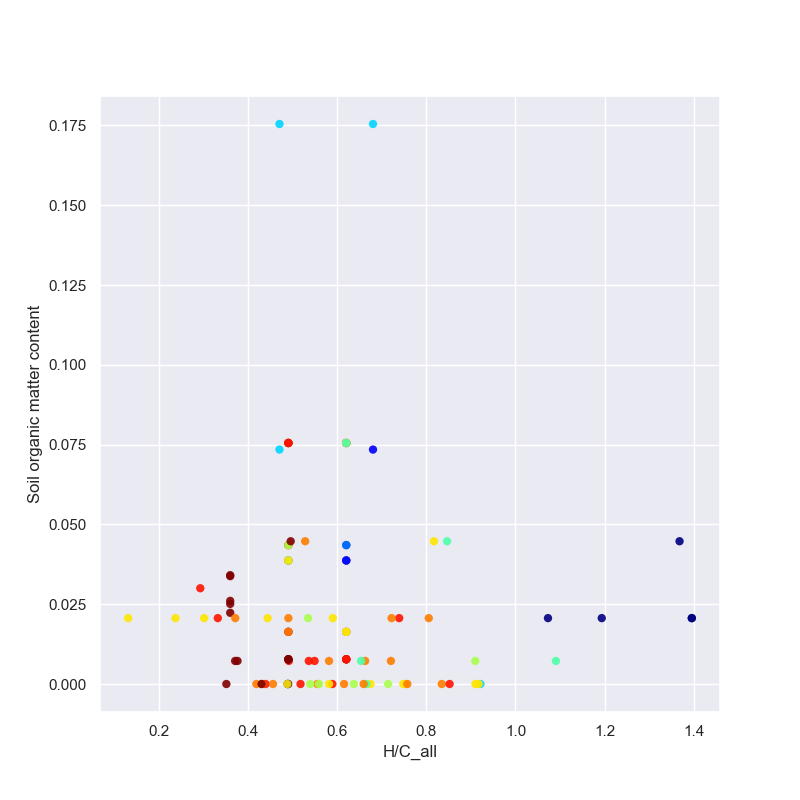

In [45]:
%matplotlib widget
one = 'H/C_all'
three = 'Soil organic matter content'

fig, ax = plt.subplots(figsize=(8,8),)# facecolor='white')
ax.scatter(XY[one],XY[three],
            c=XY['BC100c'], edgecolor='none', alpha=0.9,
            cmap=plt.cm.get_cmap('jet', 10))
ax.set_xlabel(one);
ax.set_ylabel(three);


### Piece-wiese linear models, via linear decision trees

All explained:

https://stackoverflow.com/questions/29382903/how-to-apply-piecewise-linear-fit-in-python


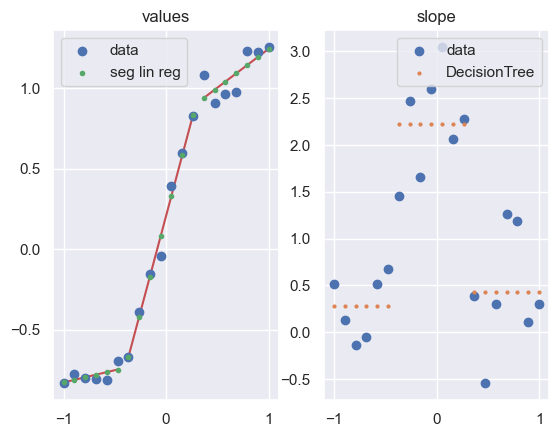

In [371]:
import numpy as np
import matplotlib.pylab as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

# parameters for setup
n_data = 20

# segmented linear regression parameters
n_seg = 3

np.random.seed(0)
fig, (ax0, ax1) = plt.subplots(1, 2)

# example 1
#xs = np.sort(np.random.rand(n_data))
#ys = np.random.rand(n_data) * .3 + np.tanh(5* (xs -.5))

# example 2
xs = np.linspace(-1, 1, 20)
ys = np.random.rand(n_data) * .3 + np.tanh(3*xs)
dys = np.gradient(ys, xs)

rgr = DecisionTreeRegressor(max_leaf_nodes=n_seg)
rgr.fit(xs.reshape(-1, 1), dys.reshape(-1, 1))
dys_dt = rgr.predict(xs.reshape(-1, 1)).flatten()

ys_sl = np.ones(len(xs)) * np.nan
for y in np.unique(dys_dt):
    msk = dys_dt == y
    lin_reg = LinearRegression()
    lin_reg.fit(xs[msk].reshape(-1, 1), ys[msk].reshape(-1, 1))
    ys_sl[msk] = lin_reg.predict(xs[msk].reshape(-1, 1)).flatten()
    ax0.plot([xs[msk][0], xs[msk][-1]],
             [ys_sl[msk][0], ys_sl[msk][-1]],
             color='r', zorder=1)

ax0.set_title('values')
ax0.scatter(xs, ys, label='data')
ax0.scatter(xs, ys_sl, s=3**2, label='seg lin reg', color='g', zorder=5)
ax0.legend()

ax1.set_title('slope')
ax1.scatter(xs, dys, label='data')
ax1.scatter(xs, dys_dt, label='DecisionTree', s=2**2)
ax1.legend()

plt.show()

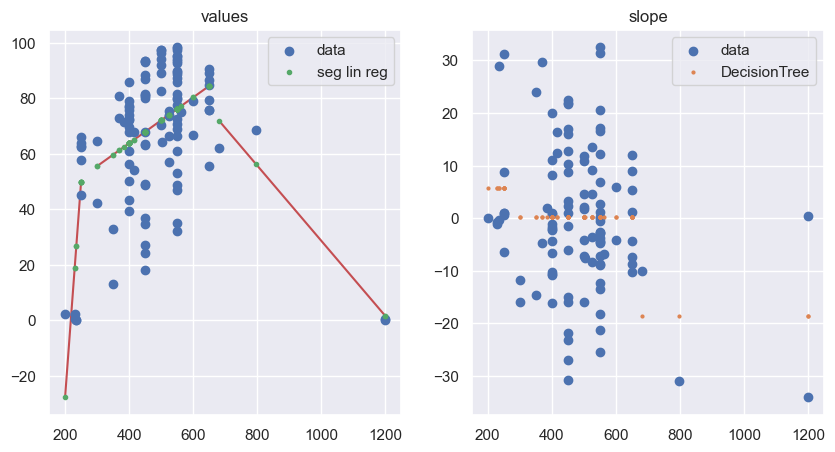

In [376]:
import numpy as np
import matplotlib.pylab as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression

# data
sortedXY = XY.copy()
sortedXY.sort_values(by="HHT", ascending=True, inplace=True)

xs = sortedXY['HHT'].values
ys = sortedXY['BC100c'].values

dys = np.gradient(ys) # gradient ?? np.gradient(ys, xs) >> get nan errors because several obs at the same xs ... 

n_seg = 3

rgr = DecisionTreeRegressor(max_leaf_nodes=n_seg)
rgr.fit(xs.reshape(-1, 1), dys.reshape(-1, 1))
dys_dt = rgr.predict(xs.reshape(-1, 1))

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,5))

ys_sl = np.ones(len(xs)) * np.nan
for y in np.unique(dys_dt):
    msk = dys_dt == y
    lin_reg = LinearRegression()
    lin_reg.fit(xs[msk].reshape(-1, 1), ys[msk].reshape(-1, 1))
    ys_sl[msk] = lin_reg.predict(xs[msk].reshape(-1, 1)).flatten()
    ax0.plot([xs[msk][0], xs[msk][-1]],
             [ys_sl[msk][0], ys_sl[msk][-1]],
             color='r', zorder=1)

ax0.set_title('values')
ax0.scatter(xs, ys, label='data')
ax0.scatter(xs, ys_sl, s=3**2, label='seg lin reg', color='g', zorder=5)
ax0.legend()

ax1.set_title('slope')
ax1.scatter(xs, dys, label='data')
ax1.scatter(xs, dys_dt, label='DecisionTree', s=2**2)
ax1.legend()

plt.show()


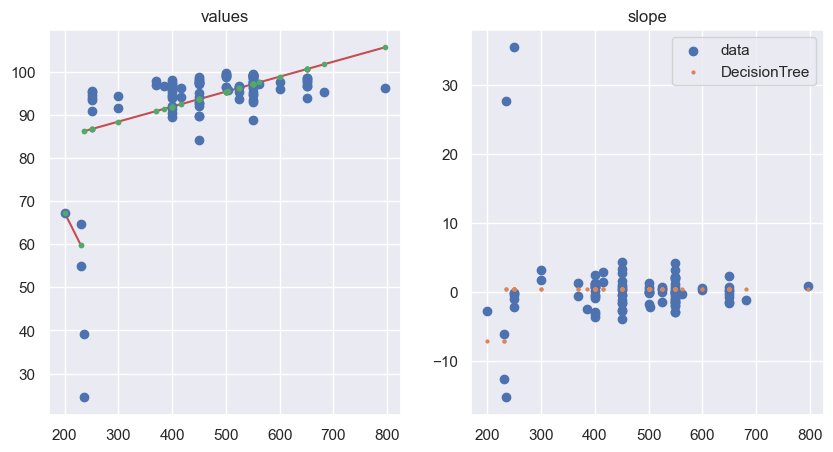

In [435]:
# data
sortedXY = X.copy()
predictor = 'HHT'
predicted = 'aBC_10'
# drop outliers
sortedXY=sortedXY.drop([46, 47, 42, 43, 45, 44, 21, 22, 26])
# sort values
sortedXY.sort_values(by=predictor, ascending=True, inplace=True)

xs = sortedXY[predictor].values
ys = sortedXY[predicted].values

dys = np.gradient(ys) # gradient ?? np.gradient(ys, xs) >> get nan errors because several obs at the same xs ... 

n_seg = 2

rgr = DecisionTreeRegressor(max_leaf_nodes=n_seg)
rgr.fit(xs.reshape(-1, 1), dys.reshape(-1, 1))
dys_dt = rgr.predict(xs.reshape(-1, 1))

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,5))

ys_sl = np.ones(len(xs)) * np.nan
for y in np.unique(dys_dt):
    msk = dys_dt == y
    lin_reg = LinearRegression()
    lin_reg.fit(xs[msk].reshape(-1, 1), ys[msk].reshape(-1, 1))
    ys_sl[msk] = lin_reg.predict(xs[msk].reshape(-1, 1)).flatten()
    ax0.plot([xs[msk][0], xs[msk][-1]],
             [ys_sl[msk][0], ys_sl[msk][-1]],
             color='r', zorder=1)

ax0.set_title('values')
ax0.scatter(xs, ys, label='data')
ax0.scatter(xs, ys_sl, s=3**2, label='seg lin reg', color='g', zorder=5)
#ax0.legend()

ax1.set_title('slope')
ax1.scatter(xs, dys, label='data')
ax1.scatter(xs, dys_dt, label='DecisionTree', s=2**2)
ax1.legend()

plt.show()


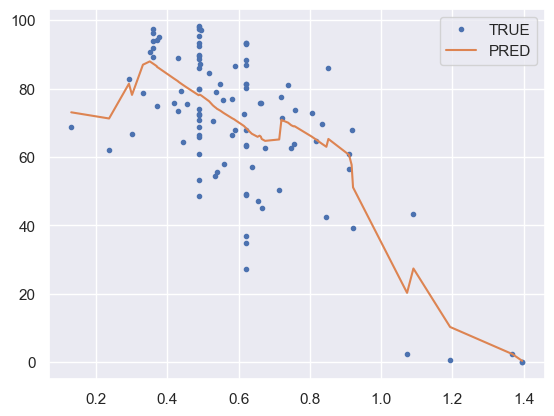

In [40]:
%matplotlib inline

from lineartree import LinearTreeRegressor, LinearForestRegressor

# data
sortedXY = XY.copy()

# drop outliers
sortedXY=sortedXY.drop([46, 47, 42, 43, 45, 44, 21, 22, 26])

# sort values
sortedXY.sort_values(by="H/C_all", ascending=True, inplace=True)

xs = sortedXY['H/C_all'].values.reshape(-1, 1)
ys = sortedXY['BC100c'].values.reshape(-1, 1)

# REGRESSION
regr = LinearForestRegressor(base_estimator=LinearRegression(), 
                            n_estimators=500,
                            max_depth=3,
                            min_samples_split=2,
                            min_samples_leaf=1,
                            min_weight_fraction_leaf=0.0,
                            max_features='log2',
                            max_leaf_nodes=None,
                            min_impurity_decrease=0.0,
                            bootstrap=True,
                            oob_score=False,
                            n_jobs=None,
                            random_state=None,
                            ccp_alpha=0.0,
                            max_samples=None)
regr.fit(xs, ys)

plt.plot(xs, ys, ".", label='TRUE')
plt.plot(xs, regr.predict(xs), label='PRED')
plt.legend()
plt.show()

### Machine Learning Pipelines, multi-target

https://towardsdatascience.com/regression-models-with-multiple-target-variables-8baa75aacd
    
MULTI-TARGET REGRESSION    '

Why use multi-output models instead of a combination of single-output models like regression?
- Models using single outputs take longer to train and are computationally expensive
- They optimize for the single target rather than all the targets together
- They do not use relationships between the target variables (Y)
- MTR regression models are simpler than a stack of Single Target models
- MTR trees provide human-readable predictive models and the models are easily interpreted.


https://scikit-learn.org/stable/modules/generated/sklearn.multioutput.MultiOutputRegressor.html

https://scikit-learn.org/stable/modules/multiclass.html#multioutput-regression

MULTI-OUTPUT REGRESSOR

This example illustrates the use of the multioutput.MultiOutputRegressor meta-estimator to perform multi-output regression. A **random forest regressor is used, which supports multi-output regression natively**, so the results can be compared.

As MultiOutputRegressor fits one regressor per target it can not take advantage of correlations between targets.

Regressor chains (see RegressorChain) is analogous to ClassifierChain as a way of combining a number of regressions into a single multi-target model that is capable of exploiting correlations among targets.


TO READ 

Multi-target support vector regression via correlation regressor chains
https://www.sciencedirect.com/science/article/pii/S0020025517307946



In [ ]:
from biocharStability.analyse import _align_dataframes, _calculateY

In [ ]:
fitdata2, sub_metadata, obs = _align_dataframes(fitdata, metadata, None)
vY, sigvY, vYnan = _calculateY(fitdata2, sub_metadata, 20, 5)
MT_Y = pd.DataFrame({})
MT_Y['BC_5'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, sub_metadata, 20, 10)
MT_Y['BC_10'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, sub_metadata, 20, 20)
MT_Y['BC_20'] = vY
vY, sigvY, vYnan = _calculateY(fitdata2, sub_metadata, 20, 30)
MT_Y['BC_30'] = vY
#vY, sigvY, vYnan = _calculateY(fitdata, sub_metadata, 15, 200)
#MT_Y['BC_200'] = vY

#### Feature sets to consider

In [26]:
featuresets_manual = [
    ('H/C_all'),('HHT'),('Carbon',),('Carbon, organic',),('Hydrogen',),('Nitrogen',),('pH_H2O',),
    ('Ash',), ('Carbon_daf',), ('Carbon, organic_daf',), ('Hydrogen_daf',), ('Oxygen_daf',),('Oxygen',),
    ('O/C_org',), ('BiomassClass', 'HHT'), ('BiomassClass', 'Carbon_daf'), ('BiomassClass', 'H/C_all'),
    ('HHT', 'Carbon'), ('HHT', 'Carbon, organic'), ('HHT', 'Hydrogen'), ('HHT', 'Nitrogen'),
 ('HHT', 'Oxygen'), ('HHT', 'O/C_org'), ('HHT', 'pH_H2O'), ('HHT', 'Ash'), ('HHT', 'Carbon_daf'), ('HHT', 'Carbon, organic_daf'),
 ('HHT', 'Hydrogen_daf'), ('HHT', 'Oxygen_daf'), ('Carbon', 'Hydrogen'), ('Carbon', 'Oxygen'),('Carbon', 'O/C_org'),
    ('Carbon', 'pH_H2O'),('Carbon', 'Ash'),('Carbon', 'H/C_all'), ('Hydrogen', 'Oxygen'),('Hydrogen', 'pH_H2O'),('Hydrogen', 'Ash'),
('Oxygen', 'H/C_all'), ('pH_H2O', 'H/C_all'), ('Ash', 'H/C_all'),
('Carbon_daf', 'H/C_all'),('Carbon, organic_daf', 'H/C_all'),('Hydrogen_daf', 'H/C_all'),
('Oxygen_daf', 'H/C_all'),('Soil clay content', 'Carbon, organic_daf'), ('Soil clay content', 'Hydrogen_daf'),
 ('Soil clay content', 'H/C_all'),('Soil organic matter content', 'Carbon, organic_daf'), ('Soil organic matter content', 'Hydrogen_daf'),
('Soil organic matter content', 'H/C_all'),('SoilMoisture_WHC', 'Carbon'),('SoilMoisture_WHC', 'Carbon, organic'),('SoilMoisture_WHC', 'Hydrogen'),
('SoilMoisture_WHC', 'Carbon, organic_daf'),('SoilMoisture_WHC', 'Hydrogen_daf'),('SoilMoisture_WHC', 'H/C_all'),
]
featuresets_manual = {i:k for i,k in enumerate(featuresets_manual)}

In [502]:
# considering all combinations of 1, 2, 3 features, or all features together; naivly/brute-forcing
feature_set_all = bs.featcombin(X, n=len(X.columns), m=len(X.columns))
feature_sets_1 = bs.featcombin(X, n=1, m=1)
feature_sets_2 = bs.featcombin(X, n=2, m=2)
feature_sets_3 = bs.featcombin(X, n=3, m=3)

feature_sets = feature_sets_1 + feature_sets_2 + feature_sets_3 + feature_set_all
feature_sets = {i:x for i,x in enumerate(feature_sets)}
len(feature_set_all), len(feature_sets_1), len(feature_sets_2), len(feature_sets_3), len(feature_sets)

(1, 77, 2926, 73150, 76154)

In [516]:
# from the above features, a selection can be made based on domain knowledge
# based on rationales, e.g. compulsory features: one of the following features must be in the set [C, H, Ash, H/C_all],
# because we know they have explanatory power; and it will exclude sets that are based solely on biochar pH...
must_have = ['Carbon', 'Hydrogen', 'Carbon, organic', 'H/C_all', 'HHT', 'Carbon, organic_daf','Hydrogen_daf' ]
feature_must = { k:s for k, s in enumerate(feature_sets_2) if any(x in s for x in must_have) }
feature_must = { i:s for i,s in enumerate(feature_must.values())}
len(feature_must)

511

In [517]:
feature_must

{0: ('AuthorDate', 'HHT'),
 1: ('AuthorDate', 'Carbon'),
 2: ('AuthorDate', 'Carbon, organic'),
 3: ('AuthorDate', 'Hydrogen'),
 4: ('AuthorDate', 'Carbon, organic_daf'),
 5: ('AuthorDate', 'Hydrogen_daf'),
 6: ('AuthorDate', 'H/C_all'),
 7: ('BiomassClass', 'HHT'),
 8: ('BiomassClass', 'Carbon'),
 9: ('BiomassClass', 'Carbon, organic'),
 10: ('BiomassClass', 'Hydrogen'),
 11: ('BiomassClass', 'Carbon, organic_daf'),
 12: ('BiomassClass', 'Hydrogen_daf'),
 13: ('BiomassClass', 'H/C_all'),
 14: ('PyrolysisClass', 'HHT'),
 15: ('PyrolysisClass', 'Carbon'),
 16: ('PyrolysisClass', 'Carbon, organic'),
 17: ('PyrolysisClass', 'Hydrogen'),
 18: ('PyrolysisClass', 'Carbon, organic_daf'),
 19: ('PyrolysisClass', 'Hydrogen_daf'),
 20: ('PyrolysisClass', 'H/C_all'),
 21: ('HHT', 'RT'),
 22: ('HHT', 'HR'),
 23: ('HHT', 'Soil clay content'),
 24: ('HHT', 'Soil sand content'),
 25: ('HHT', 'Soil silt content'),
 26: ('HHT', 'Soil organic matter content'),
 27: ('HHT', 'SoilMoisture_WHC'),
 28: ('HH

#### Training: single random forest

In [36]:
rfr = RandomForestRegressor(n_estimators=100, # nb of trees in RF
                            max_features='log2', # nb of features to consider at each split
                            max_depth=2, # None = default value
                            min_samples_split=2, # min number of data points placed in a node before the node is split
                            min_samples_leaf=1, # min number of data points allowed in a leaf node
                            bootstrap=False, # bagging and resampling from same observations
                            criterion='squared_error', # 
                            random_state=0,                            
                           )

In [37]:
rfr = RandomForestRegressor(n_estimators=100, # nb of trees in RF
                            max_features='log2', # nb of features to consider at each split
                            max_depth=2, # None = default value
                            min_samples_split=2, # min number of data points placed in a node before the node is split
                            min_samples_leaf=2, # min number of data points allowed in a leaf node
                            bootstrap=False, # bagging and resampling from same observations
                            criterion='squared_error', # 
                            random_state=0,                            
                           )
    
# we want shallow tree (max_depth low) to not overfit: max 3


In [38]:
# linear random forest
lrfr = LinearForestRegressor(base_estimator=LinearRegression(),
                            n_estimators=50, # nb of trees in RF
                            max_features='log2', # nb of features to consider at each split
                            max_depth=1, # None = default value
                            min_samples_split=5, # min number of data points placed in a node before the node is split
                            min_samples_leaf=5, # min number of data points allowed in a leaf node
                            bootstrap=True, # bagging and resampling from same observations
                            #random_state=0,
                            )

NameError: name 'LinearForestRegressor' is not defined

In [39]:
fX = X[list(feature_sets_1[-1])] # H/C_all
#fX = X[list(feature_sets[2239])] # H/C_all, C, Ash 

NameError: name 'feature_sets_1' is not defined

In [40]:
lrfr.fit(fX, MT_Y)
pY = lrfr.predict(fX)
pY = pd.DataFrame(pY, index=MT_Y.index, columns=MT_Y.columns)
#plt.scatter(fY.iloc[:,1], pY.iloc[:,1])
r2_score(MT_Y, pY)

NameError: name 'lrfr' is not defined

In [41]:
xxx = np.arange(0,1.5, 0.001).reshape(-1, 1)
bs.plot_RF_model(lrfr, xxx, ycols=[1], ylabel=['BC20'], figsize=(10,5),
              fX=X[list(feature_sets_1[-1])], fY=MT_Y['BC_20'])

NameError: name 'lrfr' is not defined

In [42]:
rfr.fit(fX, MT_Y)
pY = rfr.predict(fX)
pY = pd.DataFrame(pY, index=MT_Y.index, columns=MT_Y.columns)
#plt.scatter(fY.iloc[:,1], pY.iloc[:,1])
r2_score(MT_Y, pY)

NameError: name 'fX' is not defined

In [43]:
xxx = np.arange(0,1.5, 0.001).reshape(-1, 1)
bs.plot_RF_model(rfr, xxx, ycols=[1], ylabel=['BC20'], figsize=(10,5),
              fX=X[list(feature_sets_1[-1])], fY=MT_Y['BC_20'])

NameError: name 'feature_sets_1' is not defined

C:\anaconda\envs\bw2\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


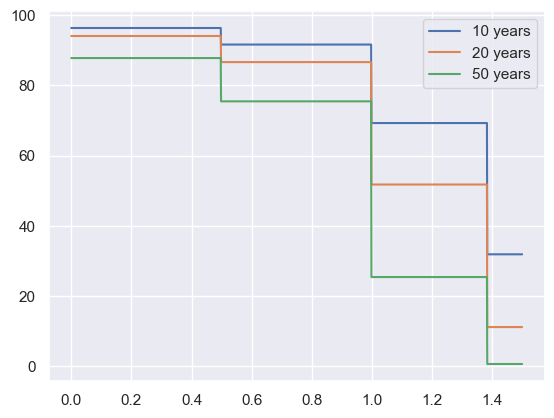

In [365]:
yyy = rfr.predict(xxx)
plt.plot(xxx, yyy[:,0], label="10 years");
plt.plot(xxx, yyy[:,1], label="20 years");
plt.plot(xxx, yyy[:,2], label="50 years");
plt.legend();

In [87]:
xxx.shape

(1500, 1)

In [ ]:
def plot_RF_model(rf, xs, ycols=0, ylabel='', fig=None, ax=None, figsize=(10,3), fX=None, fY=None, sliceOn=1):
    '''
    Plots the outcome of a trained random forest regressor (rf) over a given feature space (xs), selecting which target variable to plot with (ys)
    If xs has 1 dimension (1 feature), then it's a simple 2D plot.
    If xs has 2 dimensions, and both are continuous variables; then it's a 2D plot with permanence as color
    If xs has 3 dimensions, and 1 of them is a discrete variable; then, we can plot as a 2D plot, for each value of the discrete variable
    ...
    
    Input:
    - rf: a sklearn regressor, with the rf.predict() method
    - xs: order of variables, must be same as in rf.features_names_in_ , a list of np.arrays
    - ys: which target variables to select, if several ones; default, first one.
    '''
    feature_names_in = rf.feature_names_in_ #list of feature names input
    print('feature_names_in', feature_names_in)
    if not isinstance(ycols, list):
        ycols = [ycols]
        ylabel = [ylabel]
    
    if isinstance(xs, np.ndarray):        
        if ax is None:
            fig, ax = plt.subplots(1,1, figsize=figsize)    
        ys = rf.predict(xs)
        [ax.plot(xs, ys[:,y], label=yl) for y, yl  in zip(ycols, ylabel)]
        ax.set_xlabel('feature: '+feature_names_in[0])
        ax.set_ylabel('prediction')
        plt.legend();
        if fX is not None:
            ax.scatter(fX, fY, alpha=0.5)
        
    if isinstance(xs, list) and len(xs) == 2:
        if ax is None:
            fig, ax = plt.subplots(1, len(ycols), figsize=figsize) # one plot for each target variable
        for i, (y, yl) in enumerate(zip(ycols, ylabel)):
            # heatmap and contours
            X,Y = np.meshgrid(xs[0], xs[1])
            Z = np.zeros(shape=X.shape)
            for j in range(X.shape[0]):
                mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[1]:Y[j]})
                Z[j,:] = rf.predict(mesh)[:,y] # get only one column # shape 1-dim array, of length same as mesh.shape[0]
            
            im = ax[i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
            cbar = fig.colorbar(mappable=im, ax=ax[i])
            cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
            ax[i].set_xlabel('feature: '+feature_names_in[0])
            ax[i].set_ylabel('feature: '+feature_names_in[1])

            if fX is not None:
                ax[i].scatter(fX.iloc[:,0] , fX.iloc[:,1], c=fY[i], alpha=0.9, cmap=plt.cm.get_cmap('jet', 10), vmin=0, vmax=100, 
                             edgecolors="white")
            #contour
            #class nf(float):
            #    def __repr__(self):
            #        s = f'{self:.1f}'
            #        return f'{self:.0f}' if s[-1] == '0' else s
            #CS = ax[i].contour(Y, X, Z, [0, 50, 80], colors=['red','red', 'red']) # Y, X, Z 
            #CS.levels = [nf(val) for val in CS.levels]

            # Label levels with specially formatted floats
            #if plt.rcParams["text.usetex"]:
            #    fmt = r'%r '
            #else:
            #    fmt = '%r'
            #ax[i].clabel(CS, CS.levels, inline=True, fmt=fmt, fontsize=14)
        fig.tight_layout(pad=1.4)
    
    if isinstance(xs, list) and len(xs) == 3:
        # if 1 is not a float...
        oneCat = False
        for c, x in enumerate(xs):
            if isinstance(x[0], str):
                oneCat = True
                cx = c
        if oneCat:
            if ax is None:
                fig, ax = plt.subplots(len(set(xs[cx])), len(ycols), figsize=figsize) # rows: each category, column: each target variable
            for u, c in enumerate(set(xs[cx])):
                for i, (y, yl) in enumerate(zip(ycols, ylabel)):
                    # heatmap and contours
                    xs.pop(cx)
                    X,Y = np.meshgrid(xs[0], xs[1])
                    Z = np.zeros(shape=X.shape)
                    for j in range(X.shape[0]):
                        mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[1]:Y[j], feature_names_in[2]: np.repeat(c, X.shape[1])})
                        Z[j,:] = rf.predict(mesh)[:,y] # get only one column # shape 1-dim array, of length same as mesh.shape[0]
                    
                    im = ax[u, i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
                    cbar = fig.colorbar(mappable=im, ax=ax[i])
                    cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
                    ax[u, i].set_xlabel('feature: '+feature_names_in[0])
                    ax[u, i].set_ylabel('feature: '+feature_names_in[1])

                    if fX is not None:
                        ax[u, i].scatter(fX.iloc[:,0] , fX.iloc[:,1], c=fY[i], alpha=0.9, cmap=plt.cm.get_cmap('jet', 10), vmin=0, vmax=100, 
                                     edgecolors="white")

        else: 
            # 3 continuous variables, plot slices of the 3rd dimension.
            # the slices are made on the 3 dimension: thus limit nb of slices to reasonable number
            if ax is None:
                fig, ax = plt.subplots(min(5, len(xs[sliceOn])), len(ycols), figsize=figsize) # rows: each category, column: each target variable
            
            for u, c in enumerate(xs[sliceOn]):
                # u: row to plot to
                # c: value of 3rd dimension
                for i, (y, yl) in enumerate(zip(ycols, ylabel)):
                    X,Y = np.meshgrid(xs[0], xs[2])
                    Z = np.zeros(shape=X.shape)
                    for j in range(X.shape[0]):
                        mesh = pd.DataFrame({feature_names_in[0]:X[j], feature_names_in[2]:Y[j], feature_names_in[1]: np.repeat(c, X.shape[1]) })
                        Z[j,:] = rf.predict(mesh)[:,y]
                    
                    im = ax[u, i].pcolormesh(X,Y,Z, cmap= plt.cm.get_cmap('jet', 10), alpha=0.7, vmin=0, vmax=100) #PiYG_r seismic_r
                    #cbar = fig.colorbar(mappable=im, ax=ax[i])
                    #cbar.set_label('prediction: '+yl, rotation=270, labelpad=20)
                    ax[u, i].set_xlabel('feature: '+feature_names_in[0])
                    ax[u, i].set_ylabel('feature: '+feature_names_in[2])
                    ax[u, i].annotate('Ash: '+str(c[0]), xy=(0.5, 1))
            
            fig.tight_layout(pad=1.4)

        print("Not yet developped")
    # for 3D - slices through 3rd dimension - volume plot
    # https://matplotlib.org/stable/gallery/event_handling/image_slices_viewer.html

In [30]:
plot_RF_model(rfr, xxx, ycols=[1], ylabel=['BC20'], figsize=(10,5),
              fX=X[list(feature_sets_1[-1])], fY=MT_Y['BC_20'])

NameError: name 'rfr' is not defined

In [312]:
xSand = np.arange(mod_metadata['Soil sand content'].min(),mod_metadata['Soil sand content'].max(), 0.1).reshape(-1, 1)
xC = np.arange(mod_metadata['Carbon'].min(),mod_metadata['Carbon'].max(), 0.1).reshape(-1, 1)
xHC = np.arange(0.05, 1.5, 0.05).reshape(-1, 1)
xIncubationTemp = np.arange(metadata['IncubationTemperature'].min(),metadata['IncubationTemperature'].max(), 1).reshape(-1, 1)
xHHT = np.arange(metadata['HHT'].min(),metadata['HHT'].max()+20, 20).reshape(-1, 1)
xHR = np.arange(mod_metadata['HR'].min(),mod_metadata['HR'].max(), 5).reshape(-1, 1)
xAsh = np.arange(X['Ash'].min(),X['Ash'].max(), 0.05).reshape(-1, 1)
xAsh_slice = np.arange(X['Ash'].min(),X['Ash'].max(), 0.2).reshape(-1, 1)

Not yet developped


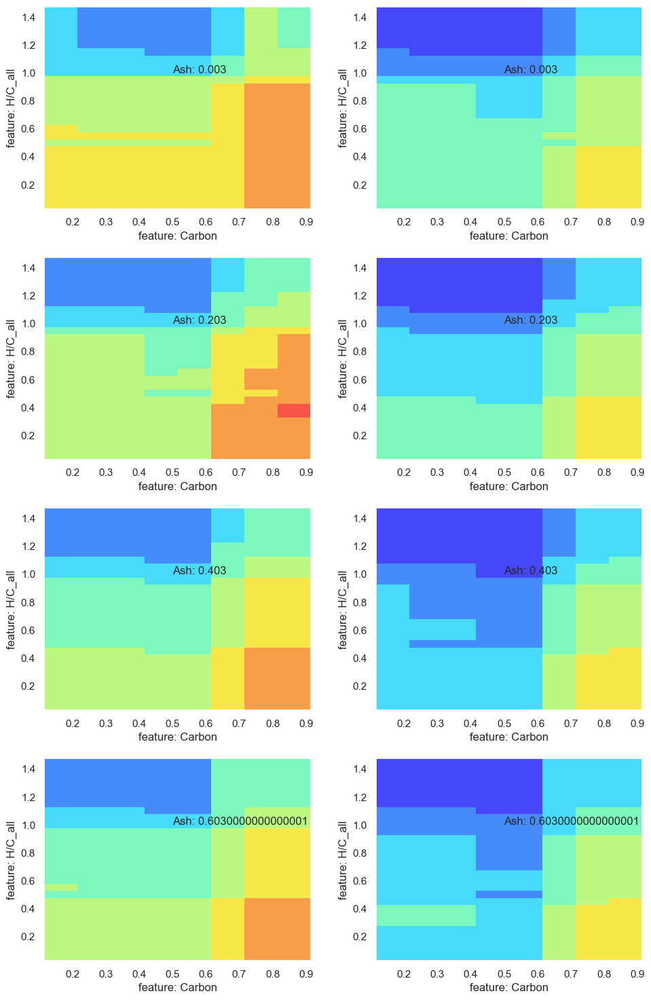

In [313]:
pipeRF = pick_model(k=2239, df=df, sets=feature_sets)
plot_RF_model(pipeRF, [xC, xAsh_slice, xHC], ycols=[1,3], ylabel=['BC100', 'BC200'],
              fX=X[list(feature_sets[263])], fY=[MT_Y['BC_100'], MT_Y['BC_200']], figsize=(10,15))

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['Carbon', 'H/C_all'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

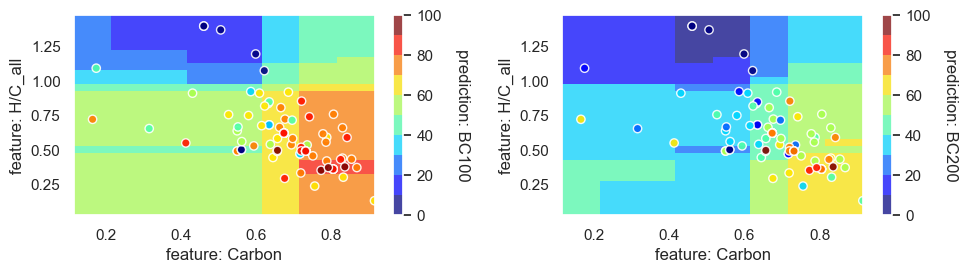

In [202]:
pipeRF = pick_model(k=263, df=df, sets=feature_sets)
plot_RF_model(pipeRF, [xC, xHC], ycols=[1,3], ylabel=['BC100', 'BC200'],
              fX=X[list(feature_sets[263])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['IncubationTemperature',
                                                   'H/C_all'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

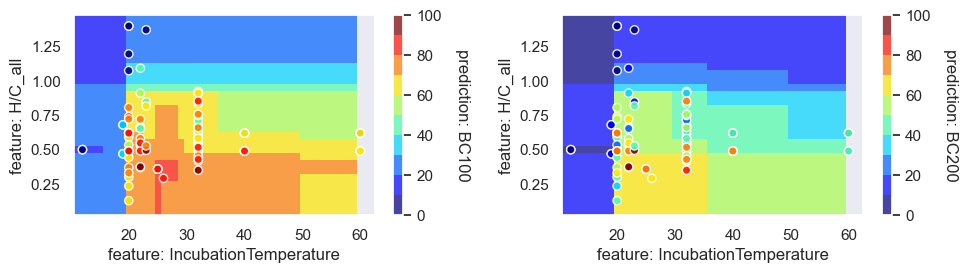

In [203]:
pipeRF = pick_model(k=244, df=df)
plot_RF_model(pipeRF, [xIncubationTemp, xHC], ycols=[1,3], ylabel=['BC100', 'BC200'],
              fX=X[list(feature_sets[244])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['HHT',
                                                   'IncubationTemperature'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

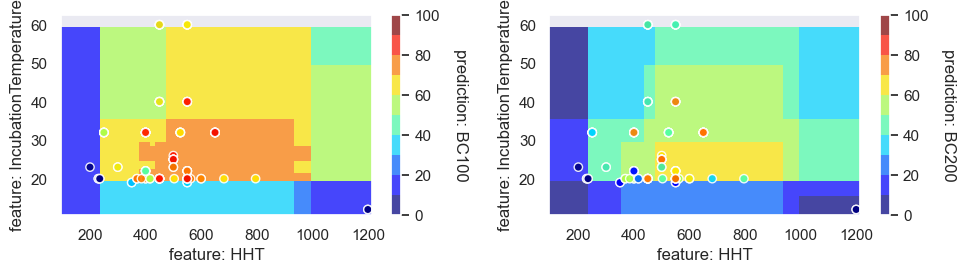

In [448]:
k = 78
pipeRF = pick_model(k, df=df)
plot_RF_model(pipeRF, [xHHT, xIncubationTemp], ycols=[1,3], ylabel=['BC100', 'BC200'],
              fX=X[list(feature_sets[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['Soil sand content',
                                                   'Carbon'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

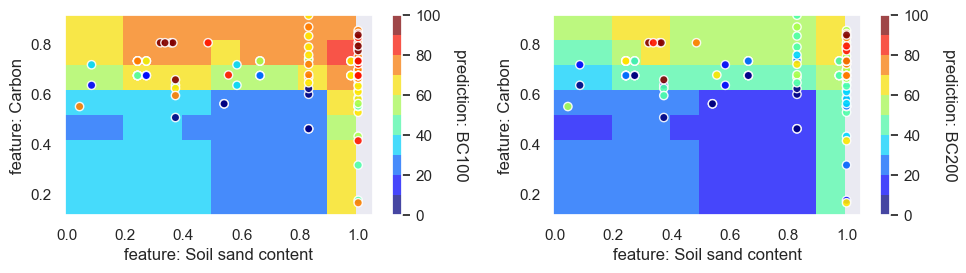

In [449]:
k = 154
pipeRF = pick_model(k, df=df)
plot_RF_model(pipeRF, [xSand, xC], ycols=[1,3], ylabel=['BC100', 'BC200'],
            fX=X[list(feature_sets[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['HHT', 'Carbon'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

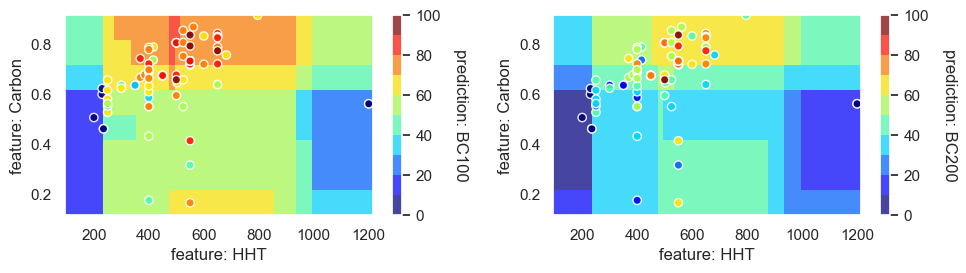

In [450]:
k=80
pipeRF = pick_model(k, df=df)
plot_RF_model(pipeRF, [xHHT, xC], ycols=[1,3], ylabel=['BC100', 'BC200'],
              fX=X[list(feature_sets[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['HHT', 'H/C_all'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

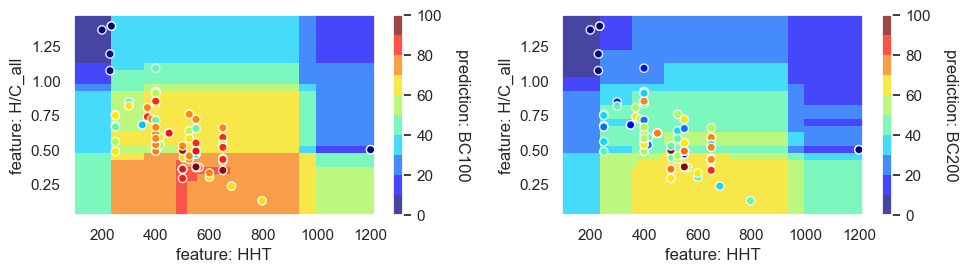

In [451]:
k = 89
pipeRF = pick_model(k, df=df)
plot_RF_model(pipeRF, [xHHT, xHC], ycols=[1,3], ylabel=['BC100', 'BC200'],
             fX=X[list(feature_sets[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['HHT', 'HR'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

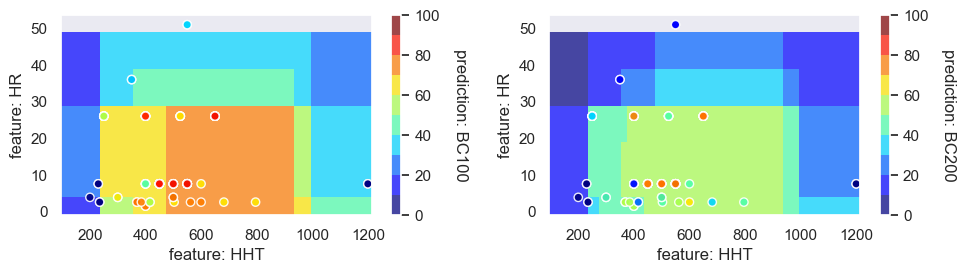

In [452]:
k = 70
pipeRF = pick_model(k, df=df)
plot_RF_model(pipeRF, [xHHT, xHR], ycols=[1,3], ylabel=['BC100', 'BC200'],
             fX=X[list(feature_sets[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['Soil sand content',
                                                   'H/C_all'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

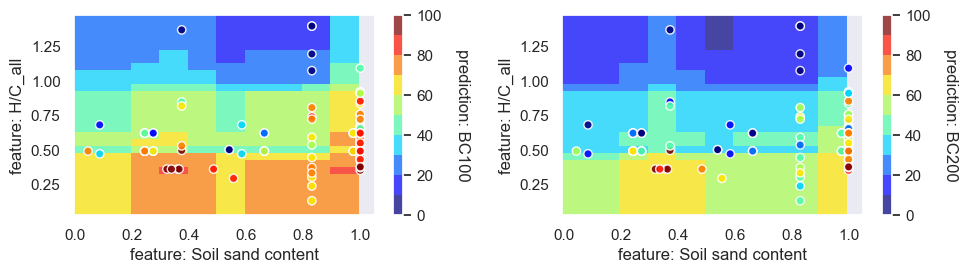

In [453]:
k = 51
pipeRF = pick_model(k, df=df, sets=feature_must)
plot_RF_model(pipeRF, [xSand, xHC], ycols=[1,3], ylabel=['BC100', 'BC200'],
             fX=X[list(feature_must[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

<bound method Pipeline.set_params of Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['HHT', 'Ash'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])>

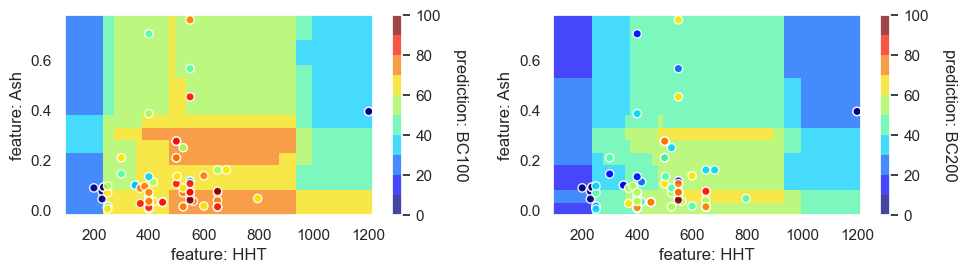

In [204]:
k = 34
pipeRF = pick_model(k, df=df, sets=feature_must)
plot_RF_model(pipeRF, [xHHT, xAsh], ycols=[1,3], ylabel=['BC100', 'BC200'],
             fX=X[list(feature_must[k])], fY=[MT_Y['BC_100'], MT_Y['BC_200']])
pipeRF.set_params

#### Training: Random forest with cross-validation

In [ ]:
def r2a(r2, n, p):
    ''' R2 adjusted, cf. https://en.wikipedia.org/wiki/Coefficient_of_determination#Adjusted_R2 
    Calculates the adjusted R2 score, 
        - where n is the number of observations, and 
        - p is the number of features
    Compared to R2, R2a adds a penalty for model complexity / number of features
    '''
    return 1 - (1-r2)*(n-1)/(n-p-1)

In [528]:
# cross-validation parameters
cross_validation_folds = 3

# hyper-parameter space for Random Forests

hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [150,], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [3], # None = default value
    'randomforestregressor__min_samples_split': [10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, ], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True], # method for sampling data points (with or without replacement)
}

hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [50, 100, 300], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [1, 3, 6], # None = default value
    'randomforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}

In [529]:
trained_models = {'RFs':{
                        'feature_set':[],
                        'model_params':[],
                        'RMSE': [],
                        'expvar':[],
                        'r2':[],
                        'r2a':[],
                        },
                  'BRTs':{
                        'feature_set':[],
                        'model_params':[],
                        'RMSE': [],
                        'expvar':[],
                        'r2':[],
                        'r2a':[],
                        }
                 }

train_RF = True
for k, feature_set in feature_must.items(): #feature_sets.items():
    
    # feature selection, normalisation, one-hot encoding
    fX = X[list(feature_must[k])]
    fY = MT_Y 
    
    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)

    numerical_columns = numerical_columns_selector(fX)
    categorical_columns = categorical_columns_selector(fX)

    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)])

    print("set %i, with %i features..." %( k, fX.shape[1] ) )
    print(feature_set)
    # Random Forest - grid search with CV
    if train_RF:
        
        pipeRF = make_pipeline(preprocessor, RandomForestRegressor())
        
        rf_rd = GridSearchCV(estimator=pipeRF,
                            param_grid=hyper_param_grid_RF,
                            cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                            scoring='neg_mean_squared_error',
                            refit=True,# so that best estimator is retrained on the whole dataset
                            verbose=1,
                            n_jobs=4,
                            )

        rf_rd.fit(fX, fY)
        Y_test_predicted = rf_rd.predict(fX)

        ## calculate & save performance metrics
        trained_models['RFs']['feature_set'].append(k)
        trained_models['RFs']['model_params'].append(rf_rd.best_params_)
        trained_models['RFs']['RMSE'].append( np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
        trained_models['RFs']['expvar'].append( explained_variance_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2'].append( r2_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2a'].append( r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1])  )  
        print("---> RF - feature set: ", k, "r2: ", trained_models['RFs']['r2'][k] )
        
        # save best estimators to disk, as pickle
        # save_model_pickle(rf_rd.best_estimator_, 'model_RF_featureSet_'+str(k)+'foldCV_'+str(cross_validation_folds))

print("\n End of model training")

set 0, with 2 features...
('AuthorDate', 'HHT')
Fitting 3 folds for each of 216 candidates, totalling 648 fits


KeyboardInterrupt: 

In [28]:
featuresets_manual = [
    ('H/C_all',),('HHT',),('Nitrogen',),('pH_H2O',), ('Ash',), ('Carbon_daf',), ('Carbon, organic_daf',), ('Hydrogen_daf',), ('Oxygen_daf',),('O/C_org',), ('BiomassClass', 'HHT'), ('BiomassClass', 'Carbon_daf'), ('BiomassClass', 'H/C_all'),('HHT', 'Nitrogen'), ('HHT', 'O/C_org'), ('HHT', 'pH_H2O'), ('HHT', 'Ash'), ('HHT', 'Carbon_daf'), ('HHT', 'Carbon, organic_daf'),('HHT', 'Hydrogen_daf'), ('HHT', 'Oxygen_daf'), ('pH_H2O', 'H/C_all'), ('Ash', 'H/C_all'),('Carbon_daf', 'H/C_all'),('Carbon, organic_daf', 'H/C_all'),('Hydrogen_daf', 'H/C_all'),('Oxygen_daf', 'H/C_all'),('Soil clay content', 'Carbon, organic_daf'), ('Soil clay content', 'Hydrogen_daf'), ('Soil clay content', 'H/C_all'),('Soil organic matter content', 'Carbon, organic_daf'), ('Soil organic matter content', 'Hydrogen_daf'),('Soil organic matter content', 'H/C_all'), ('SoilMoisture_WHC', 'Carbon, organic_daf'),('SoilMoisture_WHC', 'Hydrogen_daf'),('SoilMoisture_WHC', 'H/C_all'),
]
featuresets_manual = {i:k for i,k in enumerate(featuresets_manual)}
featuresets_manual

{0: ('H/C_all',),
 1: ('HHT',),
 2: ('Nitrogen',),
 3: ('pH_H2O',),
 4: ('Ash',),
 5: ('Carbon_daf',),
 6: ('Carbon, organic_daf',),
 7: ('Hydrogen_daf',),
 8: ('Oxygen_daf',),
 9: ('O/C_org',),
 10: ('BiomassClass', 'HHT'),
 11: ('BiomassClass', 'Carbon_daf'),
 12: ('BiomassClass', 'H/C_all'),
 13: ('HHT', 'Nitrogen'),
 14: ('HHT', 'O/C_org'),
 15: ('HHT', 'pH_H2O'),
 16: ('HHT', 'Ash'),
 17: ('HHT', 'Carbon_daf'),
 18: ('HHT', 'Carbon, organic_daf'),
 19: ('HHT', 'Hydrogen_daf'),
 20: ('HHT', 'Oxygen_daf'),
 21: ('pH_H2O', 'H/C_all'),
 22: ('Ash', 'H/C_all'),
 23: ('Carbon_daf', 'H/C_all'),
 24: ('Carbon, organic_daf', 'H/C_all'),
 25: ('Hydrogen_daf', 'H/C_all'),
 26: ('Oxygen_daf', 'H/C_all'),
 27: ('Soil clay content', 'Carbon, organic_daf'),
 28: ('Soil clay content', 'Hydrogen_daf'),
 29: ('Soil clay content', 'H/C_all'),
 30: ('Soil organic matter content', 'Carbon, organic_daf'),
 31: ('Soil organic matter content', 'Hydrogen_daf'),
 32: ('Soil organic matter content', 'H/C_al

In [387]:
# save params
fp = '../simulations/correlations/RF_models_2022-11-22_gridSeach3CV_1166musthavesets.pickle'
s = pickle.dump(trained_models,  open(fp, 'wb'))

In [418]:
# load params
fp = '../simulations/correlations/RF_models_2022-11-16_137sets.pickle'
fp = '../simulations/correlations/RF_models_2022-11-16_simpleCV_2325sets.pickle'
fp = '../simulations/correlations/RF_models_2022-11-22_gridSeach3CV_1166musthavesets.pickle'

trained_models = pickle.load(open(fp, 'rb'))
len(trained_models['RFs']['feature_set'])

91

In [201]:
# load params
fp = '../simulations/correlations/RF_models_2022-11-16_137sets.pickle'
fp = '../simulations/correlations/RF_models_2022-11-16_simpleCV_2325sets.pickle'
trained_models = pickle.load(open(fp, 'rb'))
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [feature_sets[x] for x in df.index]

In [443]:
# load params
fp = '../simulations/correlations/RF_models_2022-11-16_137sets.pickle'
fp = '../simulations/correlations/RF_models_2022-11-16_simpleCV_2325sets.pickle'
fp = '../simulations/correlations/RF_models_2022-11-22_gridSeach3CV_1166musthavesets.pickle'
trained_models = pickle.load(open(fp, 'rb'))
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [feature_sets[x] for x in df.index]

In [392]:
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [feature_sets[x] for x in df.index]

In [425]:
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [feature_must[x] for x in df.index]
df = df.sort_values('r2', ascending=False)
df.head(25)

,model_params,RMSE,expvar,r2,r2a,features
feature_set,,,,,,
24,"{'randomforestregressor__bootstrap': False, 'r...",11.620867,0.804204,0.804204,0.800544,"(HHT, IncubationTemperature)"
51,"{'randomforestregressor__bootstrap': True, 'ra...",12.484333,0.773071,0.772999,0.768756,"(Soil sand content, H/C_all)"
49,"{'randomforestregressor__bootstrap': False, 'r...",13.597123,0.728328,0.728328,0.723250,"(Soil sand content, Carbon, organic)"
19,"{'randomforestregressor__bootstrap': False, 'r...",14.073806,0.712498,0.712498,0.707124,"(HHT, Soil silt content)"
75,"{'randomforestregressor__bootstrap': False, 'r...",15.443826,0.648588,0.648588,0.642019,"(IncubationTemperature, H/C_all)"
26,"{'randomforestregressor__bootstrap': False, 'r...",16.924416,0.580473,0.580473,0.572631,"(HHT, Carbon)"
56,"{'randomforestregressor__bootstrap': True, 'ra...",17.179182,0.553098,0.553079,0.544725,"(Soil organic matter content, Carbon)"
20,"{'randomforestregressor__bootstrap': True, 'ra...",17.432467,0.552049,0.551817,0.543439,"(HHT, Soil organic matter content)"
18,"{'randomforestregressor__bootstrap': True, 'ra...",17.514533,0.550534,0.550507,0.542106,"(HHT, Soil sand content)"


In [397]:
u=25*1
df.iloc[u:u+25,:]

,model_params,RMSE,expvar,r2,r2a,features
feature_set,,,,,,
28,"{'randomforestregressor__bootstrap': False, 'r...",18.601903,0.495069,0.495069,0.485632,"(HHT, Hydrogen)"
44,"{'randomforestregressor__bootstrap': False, 'r...",18.470728,0.485644,0.485644,0.476029,"(Soil clay content, Carbon)"
14,"{'randomforestregressor__bootstrap': False, 'r...",18.805526,0.478557,0.478557,0.468811,"(PyrolysisClass, H/C_all)"
32,"{'randomforestregressor__bootstrap': True, 'ra...",18.811142,0.478355,0.477767,0.468006,"(HHT, C/N)"
10,"{'randomforestregressor__bootstrap': False, 'r...",18.955198,0.474898,0.474898,0.465083,"(PyrolysisClass, HHT)"
15,"{'randomforestregressor__bootstrap': False, 'r...",19.030777,0.470543,0.470543,0.460646,"(HHT, RT)"
83,"{'randomforestregressor__bootstrap': False, 'r...",18.953215,0.461001,0.461001,0.450927,"(Carbon, Oxygen)"
71,"{'randomforestregressor__bootstrap': True, 'ra...",19.422817,0.442133,0.441966,0.431536,"(LabField, H/C_all)"
23,"{'randomforestregressor__bootstrap': True, 'ra...",19.604984,0.433055,0.432766,0.422164,"(HHT, LabField)"


In [231]:
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = list(feature_sets.values())
df = df.sort_values('r2', ascending=False)
df.head(20)

,model_params,RMSE,expvar,r2,r2a,features
feature_set,,,,,,
929,"{'randomforestregressor__bootstrap': True, 'ra...",14.755587,0.680673,0.680540,0.671499,"(HHT, IncubationTemperature, Carbon)"
2115,"{'randomforestregressor__bootstrap': True, 'ra...",14.935013,0.672104,0.672071,0.662790,"(IncubationTemperature, Carbon, Hydrogen)"
2324,"{'randomforestregressor__bootstrap': True, 'ra...",14.977736,0.669822,0.669720,0.576465,"(BiomassClass, PyrolysisClass, HHT, RT, HR, So..."
244,"{'randomforestregressor__bootstrap': True, 'ra...",15.055130,0.666772,0.666598,0.660366,"(IncubationTemperature, H/C_all)"
2122,"{'randomforestregressor__bootstrap': True, 'ra...",15.024409,0.665934,0.665765,0.656305,"(IncubationTemperature, Carbon, H/C_all)"
938,"{'randomforestregressor__bootstrap': True, 'ra...",15.281098,0.659847,0.659729,0.650098,"(HHT, IncubationTemperature, H/C_all)"
331,"{'randomforestregressor__bootstrap': True, 'ra...",15.294071,0.656345,0.656247,0.646518,"(BiomassClass, HHT, IncubationTemperature)"
78,"{'randomforestregressor__bootstrap': True, 'ra...",15.388689,0.654329,0.654225,0.647762,"(HHT, IncubationTemperature)"
934,"{'randomforestregressor__bootstrap': True, 'ra...",15.408077,0.652575,0.652573,0.642741,"(HHT, IncubationTemperature, O/C_org)"


In [ ]:
def pick_model(k, df, sets=feature_sets):
    mp = { k.removeprefix("randomforestregressor__"):v for k,v in df.loc[k,:]['model_params'].items()}

    # feature selection, normalisation, one-hot encoding
    fX = X[list(sets[k])]
    fY = MT_Y 

    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)
    numerical_columns = numerical_columns_selector(fX)
    categorical_columns = categorical_columns_selector(fX)
    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently
    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)])

    pipeRF = make_pipeline(preprocessor, RandomForestRegressor(**mp))
    pipeRF.fit(fX, fY)
    return pipeRF

In [227]:
pipeRF = pick_model(k=263, df=df)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standard_scaler',
                                                  RobustScaler(),
                                                  ['Carbon', 'H/C_all'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=3, max_features='log2',
                                       min_samples_split=10,
                                       n_estimators=150))])

In [76]:
r2_score(fY, pipeRF.predict(fX))

0.529846243811201

#### Training: Linear RF on biochar loss at 20 years

In [532]:
# X as defined in 2.4.2 PCA with Stability Features
# cross-validation parameters
cross_validation_folds = 2

# hyper-parameter space for Random Forests

hyper_param_grid_RF = {
    'randomforestregressor__n_estimators': [10, 50], # nb of trees in RF
    'randomforestregressor__max_features': ['log2'], # nb of features to consider at each split
    'randomforestregressor__max_depth': [1, 3, 6], # None = default value
    'randomforestregressor__min_samples_split': [2, 5, 10],# min number of data points placed in a node before the node is split
    'randomforestregressor__min_samples_leaf': [1, 2, 4, 10], # min number of data points allowed in a leaf node
    'randomforestregressor__bootstrap': [True, False], # method for sampling data points (with or without replacement)
}

In [534]:
trained_models = {'RFs':{
                        'feature_set':[],
                        'model_params':[],
                        'RMSE': [],
                        'expvar':[],
                        'r2':[],
                        'r2a':[],
                        },
                 }

train_RF = True
predicted = 'aBC_20'
for k, feature_set in enumerate(featuresets_manual): #feature_sets.items():
    
    # feature selection, normalisation, one-hot encoding
    fX = X[list(feature_must[k])]
    fY = X[predicted]
    
    numerical_columns_selector = selector(dtype_exclude=object)
    categorical_columns_selector = selector(dtype_include=object)

    numerical_columns = numerical_columns_selector(fX)
    categorical_columns = categorical_columns_selector(fX)

    categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
    numerical_preprocessor = RobustScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

    preprocessor = ColumnTransformer([
        ('one-hot-encoder', categorical_preprocessor, categorical_columns),
        ('standard_scaler', numerical_preprocessor, numerical_columns)])

    print("set %i, with %i features..." %( k, fX.shape[1] ) )
    print(feature_set)
    # Random Forest - grid search with CV
    if train_RF:
        pipeRF = make_pipeline(preprocessor, RandomForestRegressor() ) # LinearForestRegressor(base_estimator=LinearRegression())
        
        rf_rd = GridSearchCV(estimator=pipeRF,
                            param_grid=hyper_param_grid_RF,
                            cv=cross_validation_folds, # k-fold cross validation, 3, 5, 10
                            scoring='neg_mean_squared_error',
                            refit=True,# so that best estimator is retrained on the whole dataset
                            verbose=1,
                            n_jobs=8,
                            )
        rf_rd.fit(fX, fY)
        Y_test_predicted = rf_rd.predict(fX)

        ## calculate & save performance metrics
        trained_models['RFs']['feature_set'].append(k)
        trained_models['RFs']['model_params'].append(rf_rd.best_params_)
        trained_models['RFs']['RMSE'].append( np.sqrt(mean_squared_error(fY, Y_test_predicted)) )
        trained_models['RFs']['expvar'].append( explained_variance_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2'].append( r2_score(fY, Y_test_predicted) )
        trained_models['RFs']['r2a'].append( r2a(r2_score(fY, Y_test_predicted), len(fX), fX.shape[1])  )  
        print("---> RF - feature set: ", k, "r2: ", trained_models['RFs']['r2'][k] )
        
        # save best estimators to disk, as pickle
        # save_model_pickle(rf_rd.best_estimator_, 'model_RF_featureSet_'+str(k)+'foldCV_'+str(cross_validation_folds))

print("\n End of model training")

set 0, with 2 features...
0
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  0 r2:  0.8899228190723821
set 1, with 2 features...
1
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  1 r2:  0.8315028666160178
set 2, with 2 features...
2
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  2 r2:  0.7384233836108889
set 3, with 2 features...
3
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  3 r2:  0.8782418779566249
set 4, with 2 features...
4
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  4 r2:  0.5068195062834671
set 5, with 2 features...
5
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  5 r2:  0.6631485515013165
set 6, with 2 features...
6
Fitting 2 folds for each of 144 candidates, totalling 288 fits
---> RF - feature set:  6 r2:  0.7367593254656241
set 7, with 2

In [535]:
# save params
fp = '../simulations/correlations/RF_models_2023-03-23_gridSeach2CV_56_manually-selected-features.pickle'
s = pickle.dump(trained_models,  open(fp, 'wb'))

In [536]:
# load params
fp = '../simulations/correlations/RF_models_2023-03-23_gridSeach2CV_56_manually-selected-features.pickle'
trained_models = pickle.load(open(fp, 'rb'))
len(trained_models['RFs']['feature_set'])

57

In [541]:
df = pd.DataFrame(trained_models['RFs'])
df = df.set_index('feature_set')
df['features'] = [featuresets_manual[x] for x in df.index]
df = df.sort_values('r2', ascending=False)


In [542]:
df

,model_params,RMSE,expvar,r2,r2a,features
feature_set,,,,,,
51,"{'randomforestregressor__bootstrap': False, 'r...",1.216113,0.995569,0.995569,0.995486,"(SoilMoisture_WHC, Carbon)"
52,"{'randomforestregressor__bootstrap': False, 'r...",1.810689,0.990177,0.990177,0.989994,"(SoilMoisture_WHC, Carbon, organic)"
47,"{'randomforestregressor__bootstrap': False, 'r...",2.095829,0.986840,0.986840,0.986594,"(Soil clay content, H/C_all)"
54,"{'randomforestregressor__bootstrap': True, 'ra...",2.934399,0.974225,0.974202,0.973720,"(SoilMoisture_WHC, Carbon, organic_daf)"
55,"{'randomforestregressor__bootstrap': True, 'ra...",3.344594,0.966641,0.966485,0.965859,"(SoilMoisture_WHC, Hydrogen_daf)"
45,"{'randomforestregressor__bootstrap': False, 'r...",3.560519,0.962018,0.962018,0.961308,"(Soil clay content, Carbon, organic_daf)"
56,"{'randomforestregressor__bootstrap': False, 'r...",3.990322,0.952295,0.952295,0.951403,"(SoilMoisture_WHC, H/C_all)"
46,"{'randomforestregressor__bootstrap': False, 'r...",4.408570,0.941770,0.941770,0.940682,"(Soil clay content, Hydrogen_daf)"
50,"{'randomforestregressor__bootstrap': True, 'ra...",4.681849,0.934438,0.934327,0.933100,"(Soil organic matter content, H/C_all)"


In [579]:
sss = 'SoilMoisture_WHC'
xWHC = np.arange(X[sss].min(),X[sss].max(), 0.02).reshape(-1, 1)
sss = 'Carbon'
xC = np.arange(X[sss].min(),X[sss].max(), 0.01).reshape(-1, 1)
xVAR = {}
for c in X.columns:
    if X[c].dtype == np.float64:
        xVAR[c] = np.arange(X[c].min(),X[c].max(), 0.01).reshape(-1, 1)

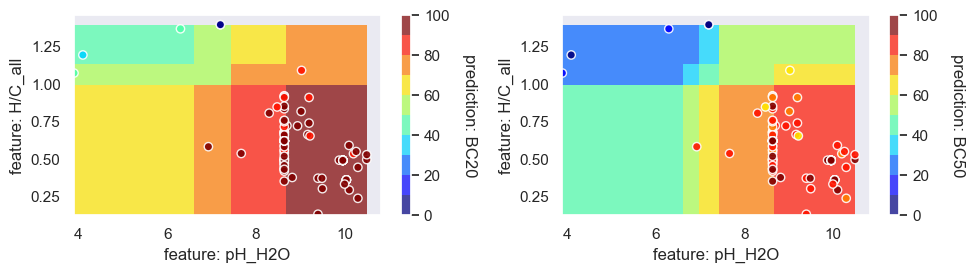

In [585]:
k = 39
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])


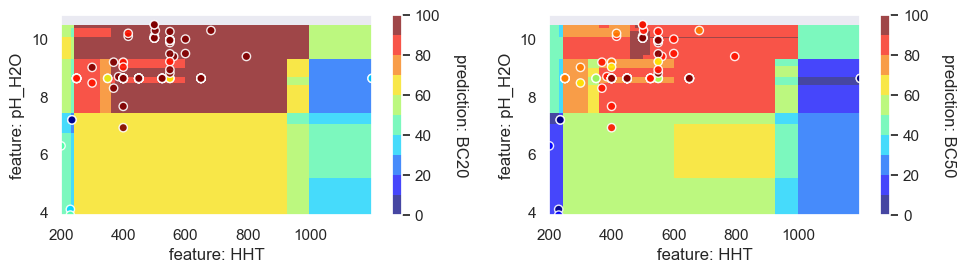

In [589]:
k = 23
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

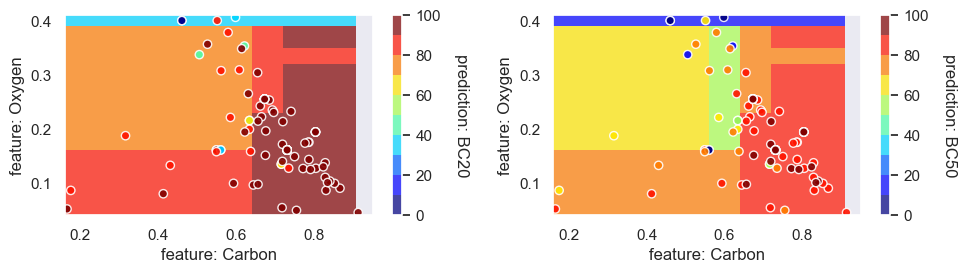

In [590]:
k = 30
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

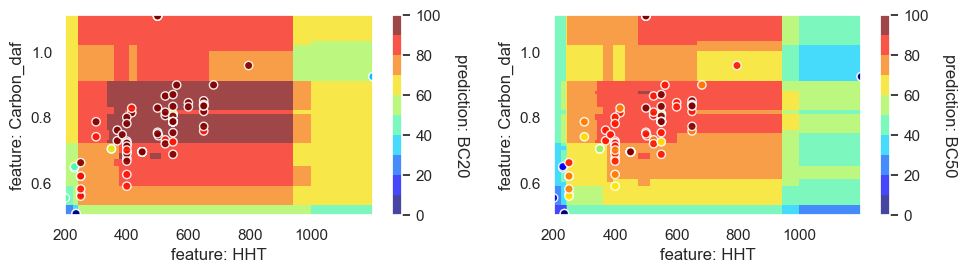

In [591]:
k = 25
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

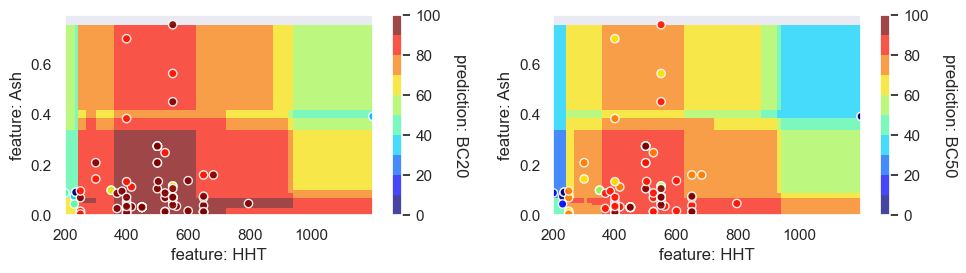

In [592]:
k = 24
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

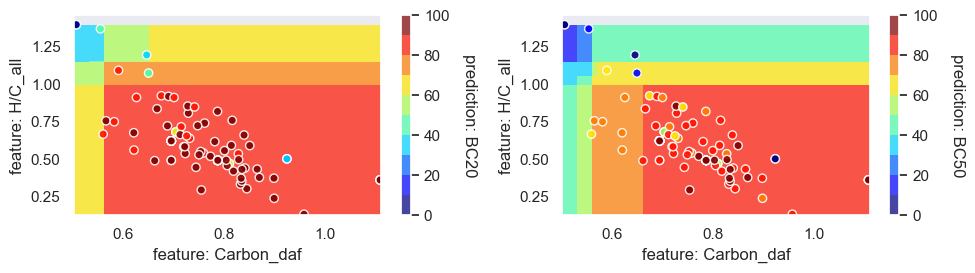

In [593]:
k = 41
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

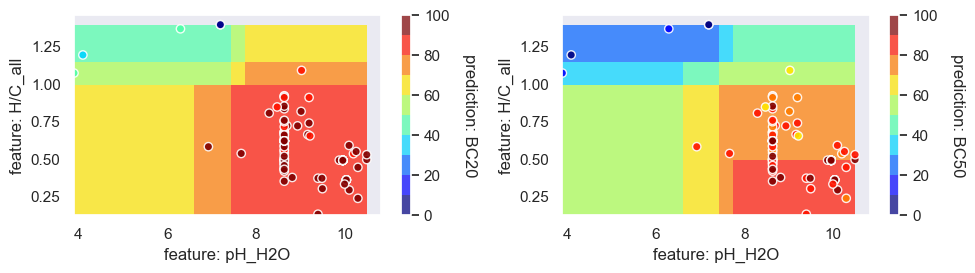

In [594]:
k = 39
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

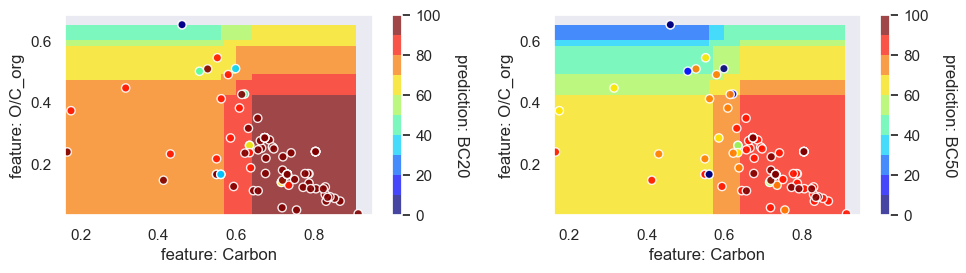

In [595]:
k = 31
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

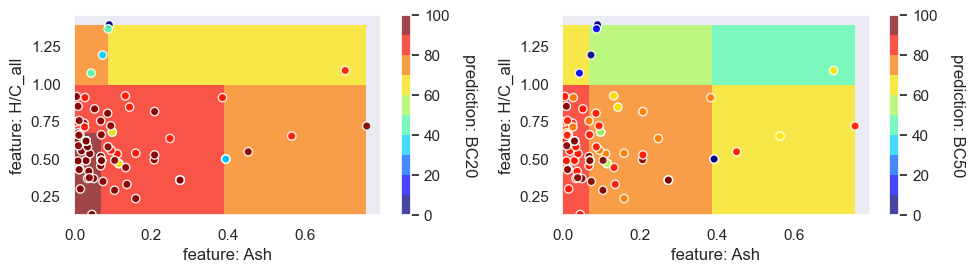

In [596]:
k = 40
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

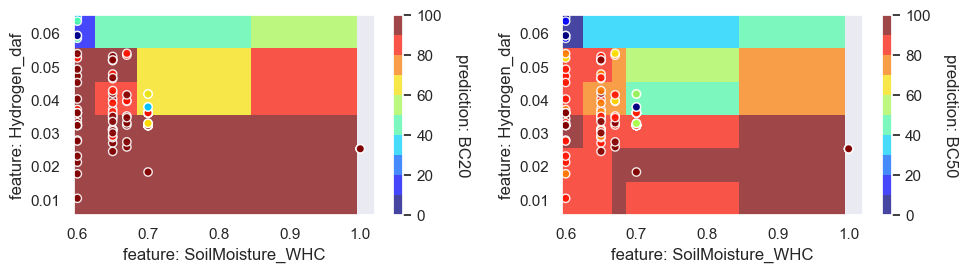

In [597]:
k = 55
pipeRF = pick_model(k=k, df=df, sets=featuresets_manual)
plot_RF_model(pipeRF, [xVAR[xV] for xV in featuresets_manual[k]], ycols=[1,2], ylabel=['BC20', 'BC50'],
              fX= X[list(df.loc[k, 'features'])], fY=[X['aBC_20'], X['aBC_50']])

### Classification decision trees: rapid losses in near-term

In [120]:
rules_sets = [
    ('H/C_all'),('HHT'),('Carbon',),('Carbon, organic',),('Hydrogen',),('Nitrogen',),('pH_H2O',),
    ('Ash',), ('Carbon_daf',), ('Carbon, organic_daf',), ('Hydrogen_daf',), ('Oxygen_daf',),('Oxygen',),
    ('O/C_org',), ('BiomassClass', 'HHT'), ('BiomassClass', 'Carbon_daf'), ('BiomassClass', 'H/C_all'),
    ('HHT', 'Carbon'), ('HHT', 'Carbon, organic'), ('HHT', 'Hydrogen'), ('HHT', 'Nitrogen'),
 ('HHT', 'Oxygen'), ('HHT', 'O/C_org'), ('HHT', 'pH_H2O'), ('HHT', 'Ash'), ('HHT', 'Carbon_daf'), ('HHT', 'Carbon, organic_daf'),
 ('HHT', 'Hydrogen_daf'), ('HHT', 'Oxygen_daf'), ('Carbon', 'Hydrogen'), ('Carbon', 'Oxygen'),('Carbon', 'O/C_org'),
    ('Carbon', 'pH_H2O'),('Carbon', 'Ash'),('Carbon', 'H/C_all'), ('Hydrogen', 'Oxygen'),('Hydrogen', 'pH_H2O'),('Hydrogen', 'Ash'),
('Oxygen', 'H/C_all'), ('pH_H2O', 'H/C_all'), ('Ash', 'H/C_all'),
('Carbon_daf', 'H/C_all'),('Carbon, organic_daf', 'H/C_all'),('Hydrogen_daf', 'H/C_all'),
('Oxygen_daf', 'H/C_all'),('Soil clay content', 'Carbon, organic_daf'), ('Soil clay content', 'Hydrogen_daf'),
 ('Soil clay content', 'H/C_all'),('Soil organic matter content', 'Carbon, organic_daf'), ('Soil organic matter content', 'Hydrogen_daf'),
('Soil organic matter content', 'H/C_all'),('SoilMoisture_WHC', 'Carbon'),('SoilMoisture_WHC', 'Carbon, organic'),('SoilMoisture_WHC', 'Hydrogen'),
('SoilMoisture_WHC', 'Carbon, organic_daf'),('SoilMoisture_WHC', 'Hydrogen_daf'),('SoilMoisture_WHC', 'H/C_all'),
]
rules_sets = {i:k for i,k in enumerate(rules_sets)}
rules_sets

{0: 'H/C_all',
 1: 'HHT',
 2: ('Carbon',),
 3: ('Carbon, organic',),
 4: ('Hydrogen',),
 5: ('Nitrogen',),
 6: ('pH_H2O',),
 7: ('Ash',),
 8: ('Carbon_daf',),
 9: ('Carbon, organic_daf',),
 10: ('Hydrogen_daf',),
 11: ('Oxygen_daf',),
 12: ('Oxygen',),
 13: ('O/C_org',),
 14: ('BiomassClass', 'HHT'),
 15: ('BiomassClass', 'Carbon_daf'),
 16: ('BiomassClass', 'H/C_all'),
 17: ('HHT', 'Carbon'),
 18: ('HHT', 'Carbon, organic'),
 19: ('HHT', 'Hydrogen'),
 20: ('HHT', 'Nitrogen'),
 21: ('HHT', 'Oxygen'),
 22: ('HHT', 'O/C_org'),
 23: ('HHT', 'pH_H2O'),
 24: ('HHT', 'Ash'),
 25: ('HHT', 'Carbon_daf'),
 26: ('HHT', 'Carbon, organic_daf'),
 27: ('HHT', 'Hydrogen_daf'),
 28: ('HHT', 'Oxygen_daf'),
 29: ('Carbon', 'Hydrogen'),
 30: ('Carbon', 'Oxygen'),
 31: ('Carbon', 'O/C_org'),
 32: ('Carbon', 'pH_H2O'),
 33: ('Carbon', 'Ash'),
 34: ('Carbon', 'H/C_all'),
 35: ('Hydrogen', 'Oxygen'),
 36: ('Hydrogen', 'pH_H2O'),
 37: ('Hydrogen', 'Ash'),
 38: ('Oxygen', 'H/C_all'),
 39: ('pH_H2O', 'H/C_all')

In [180]:
allNumerics = ['HHT', 'RT', 'HR',
       'Soil clay content', 'Soil sand content', 'Soil silt content',
       'Soil organic matter content', 'SoilMoisture_WHC', 'pH_soil',
       'IncubationTemperature', 'IncubationDuration', 'Nitrogen',
       'O/C_org', 'C/N', 'pH_H2O', 'Ash', 'Carbon_daf', 'Carbon, organic_daf',
       'Hydrogen_daf', 'Oxygen_daf', 'H/C_all']
rules_sets[1000] = allNumerics

In [145]:
MT_Y_cls = pd.DataFrame(index=MT_Y.index)
MT_Y_cls['cBC5']= MT_Y['BC_5'] > 0.95*100
MT_Y_cls['cBC10']= MT_Y['BC_10'] > 0.90*100
MT_Y_cls['cBC20']= MT_Y['BC_20'] > 0.85*100
MT_Y_cls['cBC30']= MT_Y['BC_30'] > 0.80*100

Score:  0.9454545454545454


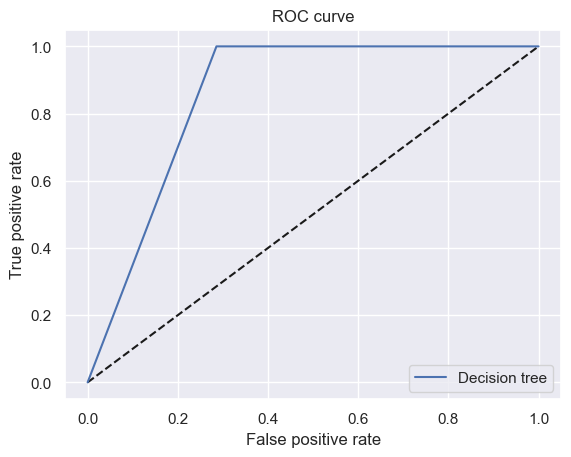

In [183]:
from sklearn.metrics import mean_squared_error, r2_score, roc_curve, explained_variance_score
k = 1000
MT_X = X[list(rules_sets[k])].copy()

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(MT_X)
categorical_columns = categorical_columns_selector(MT_X)

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore") # Here, could do a LabelEncoder() as well
numerical_preprocessor = StandardScaler() #StandardScaler() # RobustScaler() can also do robustscaler, dealing with outliers differently

preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
   ])

clf = DecisionTreeClassifier(
    criterion='gini', # entropy, gini
    splitter='best', # best, random
    max_depth=4, # int or None (until leaves are expanded) >> lead to perfect score > set a limit, shallow, to get simple rules min(2, X_dfr.shape[1]-1)
    min_samples_split=2, # int or float
    min_samples_leaf=1, #
    min_weight_fraction_leaf=0.0, # optional
    max_features=None, # None = n_features, int, float, sqrt, log2
    random_state=42, # None or int
    max_leaf_nodes=None, # max number of leaves
    min_impurity_decrease=0.0, # float force impurity to decrease at each node
    class_weight=None,
) # default parameters - TO DO : learning ...

clf_CV = GridSearchCV(clf, {'criterion':['gini', 'entropy']},
                      cv=3)

cls_pipe = make_pipeline(clf_CV)

cls_pipe.fit(MT_X, MT_Y_cls['cBC10'])
Y_dfr_predict = cls_pipe.predict(MT_X)
print("Score: ", cls_pipe.score(MT_X,MT_Y_cls['cBC10']))

# saving & re-loading a model
#s = pickle.dump(clf,  open('models/decisionTree.pickle', 'wb'))
#clf = pickle.load(open('models/decisionTree.pickle', 'rb'))

# ROC & AUC
fpr, tpr, thres = roc_curve(MT_Y_cls['cBC10'], Y_dfr_predict)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision tree')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

In [184]:
rules = export_text(cls_pipe[0].best_estimator_, feature_names=list(rules_sets[k]), show_weights=True)
print("\n Rules")
print(rules)


 Rules
|--- H/C_all <= 0.92
|   |--- IncubationTemperature <= 19.50
|   |   |--- weights: [6.00, 0.00] class: False
|   |--- IncubationTemperature >  19.50
|   |   |--- H/C_all <= 0.62
|   |   |   |--- weights: [0.00, 57.00] class: True
|   |   |--- H/C_all >  0.62
|   |   |   |--- Oxygen_daf <= 0.40
|   |   |   |   |--- weights: [6.00, 32.00] class: True
|   |   |   |--- Oxygen_daf >  0.40
|   |   |   |   |--- weights: [2.00, 0.00] class: False
|--- H/C_all >  0.92
|   |--- weights: [7.00, 0.00] class: False

